## ⚙️ Import Libraries

In [1]:
import os
from datetime import datetime

import numpy as np
import pandas as pd

import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl

import matplotlib.pyplot as plt
%matplotlib inline

np.random.seed(42)
tf.random.set_seed(42)

print(f"TensorFlow version: {tf.__version__}")
print(f"Keras version: {tfk.__version__}")
print(f"GPU devices: {len(tf.config.list_physical_devices('GPU'))}")

TensorFlow version: 2.16.1
Keras version: 3.3.3
GPU devices: 2


## ⏳ Load the Data (no outlier)

In [2]:
from sklearn.model_selection import train_test_split
import numpy as np
data = np.load("/kaggle/input/cleaned/cleaned_data.npz")

X_train = data["training_set_filtered"]

y_train = data["masks_filtered"]

X_test = data["test_set"]
print(y_train[0].shape)
print(f"Test X shape: {X_test.shape}")

# Perform train-validation split (80-20 split)
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.2, random_state=42
)

print(f"Train set: {X_train.shape}, {y_train.shape}")
print(f"Validation set: {X_val.shape}, {y_val.shape}")

(64, 128)
Test X shape: (10022, 64, 128)
Train set: (2004, 64, 128), (2004, 64, 128)
Validation set: (501, 64, 128), (501, 64, 128)


### Outliers removed

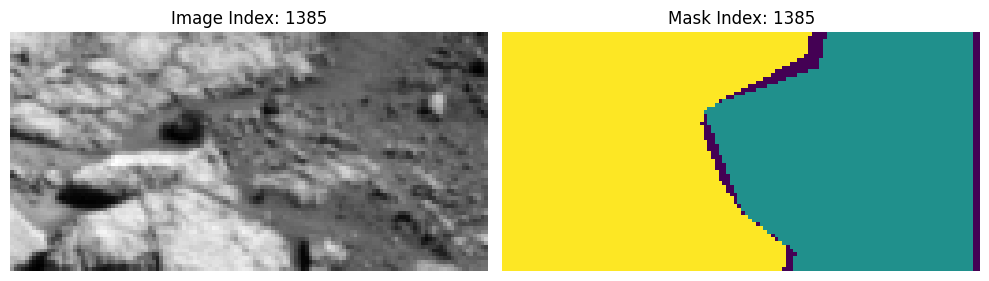

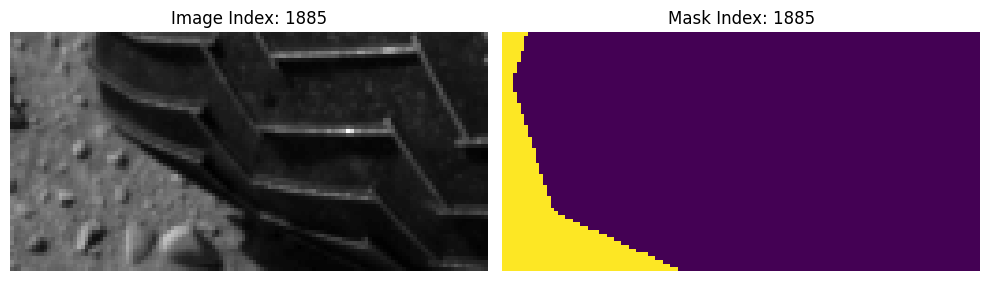

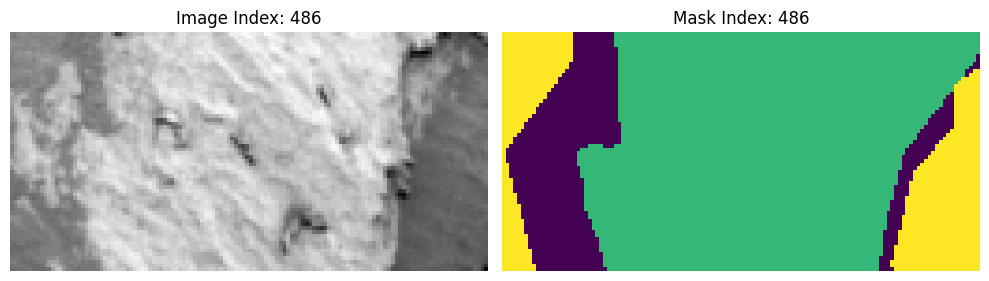

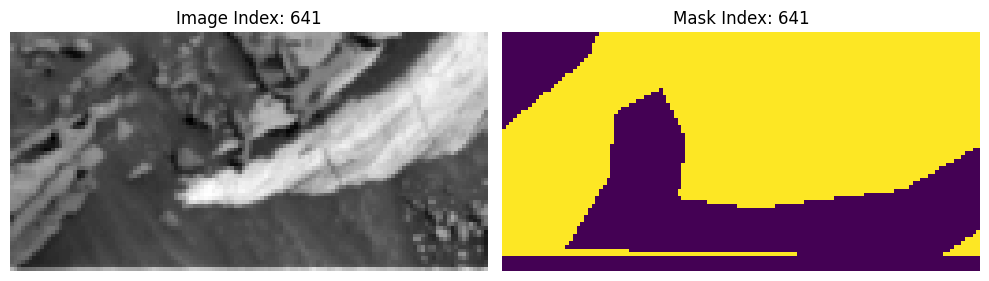

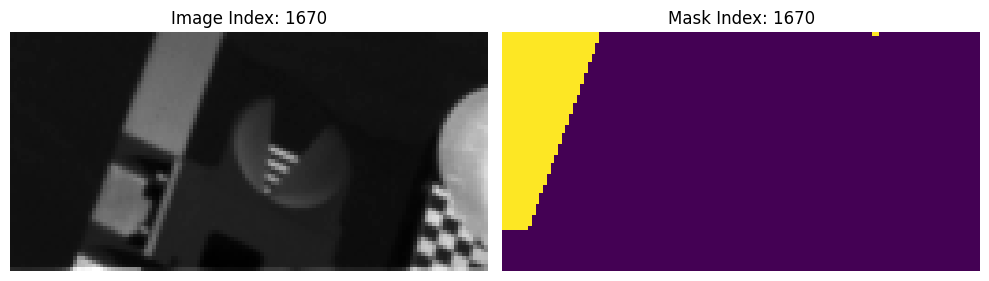

In [3]:
import random

# Visualize random image-mask pairs
for _ in range(5):
    idx = random.randint(0, len(X_train) - 1)
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))

    # Display input image
    ax[0].imshow(X_train[idx], cmap="gray")
    ax[0].set_title(f"Image Index: {idx}")
    ax[0].axis("off")

    # Display corresponding mask
    ax[1].imshow(y_train[idx], cmap="viridis")
    ax[1].set_title(f"Mask Index: {idx}")
    ax[1].axis("off")

    plt.tight_layout()
    plt.show()

## LETS DO SOME AUGMENTATION!!

## invert image and noise

/tmp/ipykernel_23/687367835.py:58: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(len(images), 6, i * 6 + 3)
/tmp/ipykernel_23/687367835.py:80: UserWarning: tight_layout not applied: number of columns in subplot specifications must be multiples of one another.
  plt.tight_layout()


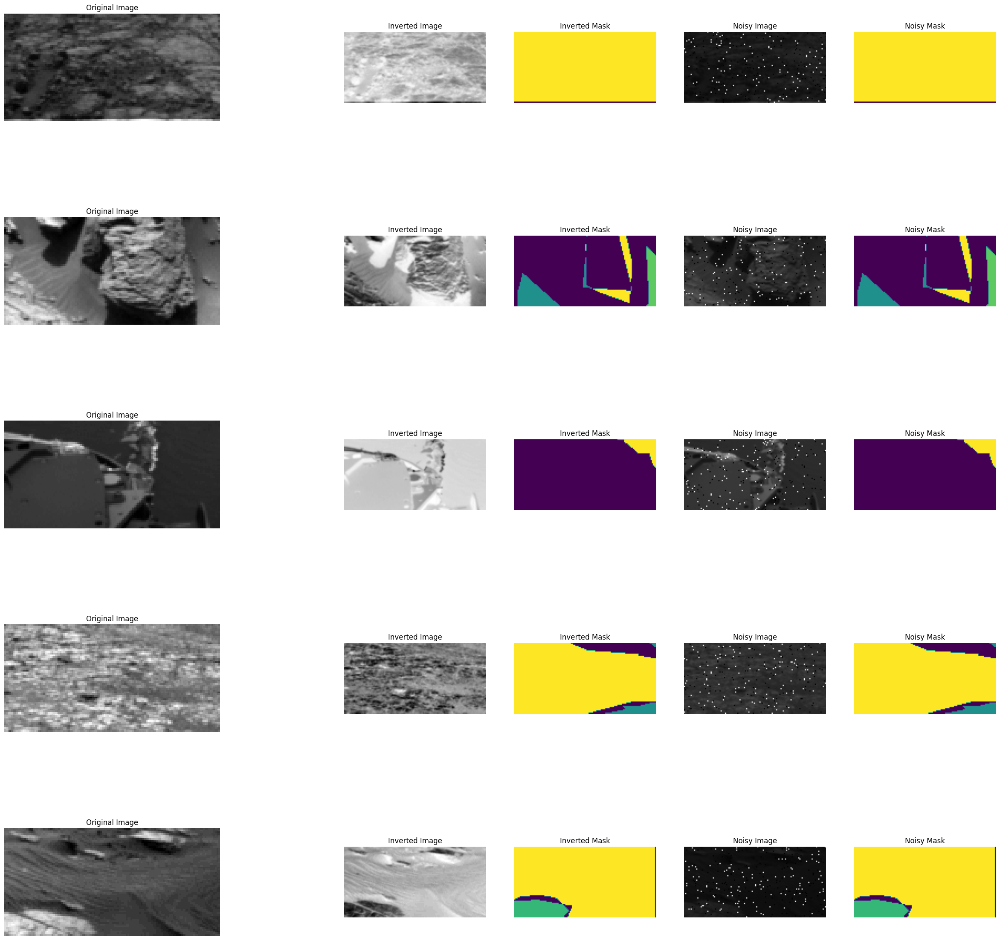

In [4]:


import numpy as np
from skimage.util import random_noise

# Define augmentation functions with mask handling
def invert_image(image, mask):
    return 255 - image, mask  # Mask remains unchanged

def add_salt_and_pepper_noise(image, mask, amount=0.03):
    """
    Add salt-and-pepper noise to an image, preserving its grayscale range.

    Args:
        image (np.ndarray): Input grayscale image with range [0, 255].
        mask (np.ndarray): Corresponding mask (unchanged).
        amount (float): Proportion of image pixels to replace with noise.

    Returns:
        noisy_image (np.ndarray): Image with salt-and-pepper noise applied.
        mask (np.ndarray): Unchanged mask.
    """
    # Normalize the image to [0, 1]

    normalized_image = image / 255.0
    # Add salt-and-pepper noise
    noisy_image = random_noise(normalized_image, mode='s&p', amount=amount)
    # Scale back to [0, 255]
    noisy_image = (noisy_image * 255)

    return noisy_image, mask


"""def rotate_image(image, mask, angle):
    rotated_image = rotate(image, angle, reshape=False, mode='constant', cval=0)
    rotated_mask = rotate(mask, angle, reshape=False, mode='constant', order=0)
    return rotated_image, rotated_mask"""
"""
def adjust_brightness(image, mask, factor=1.2):
    brightened_image = np.clip(image * factor, 0, 255).astype(np.uint8)
    return brightened_image, mask  # Mask remains unchanged"""

# Visualize augmentations with masks
def visualize_all_augmentations(images, masks):
    plt.figure(figsize=(30, 30))
    for i, (image, mask) in enumerate(zip(images, masks)):
        # Original image and mask
        plt.subplot(len(images), 4, i * 4 + 1)
        plt.imshow(image, cmap="gray")
        plt.title("Original Image")
        plt.axis("off")

        plt.subplot(len(images), 4, i * 4 + 2)
        plt.imshow(mask, cmap="viridis")
        plt.title("Original Mask")
        plt.axis("off")

        # Inversion
        inverted_image, inverted_mask = invert_image(image, mask)
        plt.subplot(len(images), 6, i * 6 + 3)
        plt.imshow(inverted_image, cmap="gray")
        plt.title("Inverted Image")
        plt.axis("off")

        plt.subplot(len(images), 6, i * 6 + 4)
        plt.imshow(inverted_mask, cmap="viridis")
        plt.title("Inverted Mask")
        plt.axis("off")

        # Noise
        noisy_image, noisy_mask = add_salt_and_pepper_noise(image, mask)
        plt.subplot(len(images), 6, i * 6 + 5)
        plt.imshow(noisy_image, cmap="gray")
        plt.title("Noisy Image")
        plt.axis("off")

        plt.subplot(len(images), 6, i * 6 + 6)
        plt.imshow(noisy_mask, cmap="viridis")
        plt.title("Noisy Mask")
        plt.axis("off")

    plt.tight_layout()
    plt.show()


# Randomly select 5 samples from the dataset
random_indices = np.random.choice(len(X_train), size=5, replace=False)
sample_images = X_train[random_indices]
sample_masks = y_train[random_indices]

# Visualize augmentations
visualize_all_augmentations(sample_images, sample_masks)


### rotation

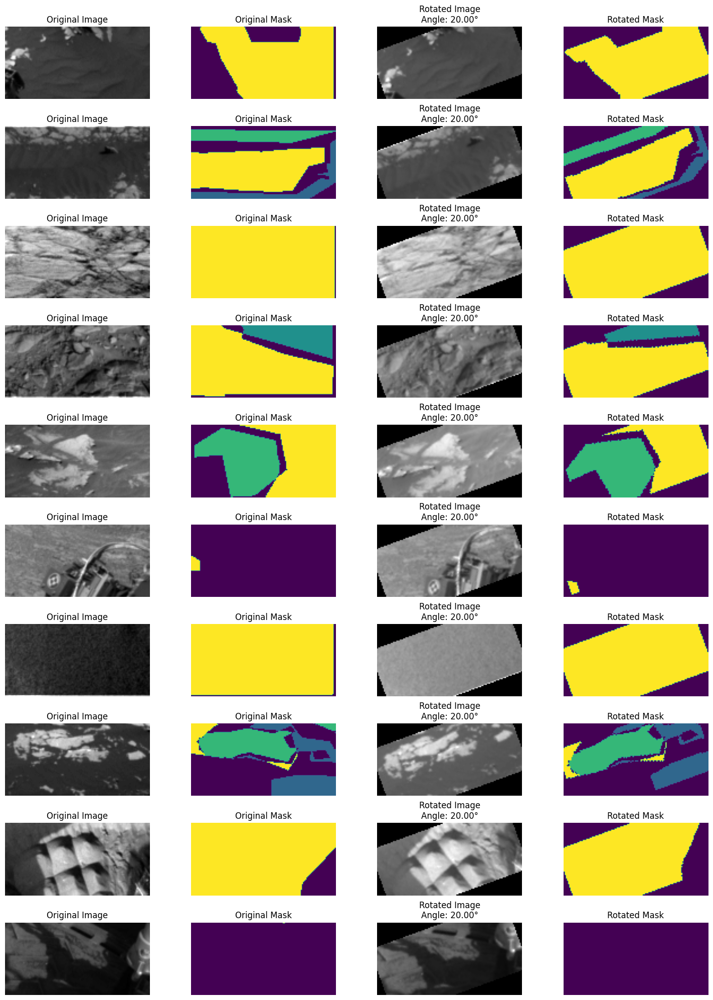

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import rotate

# Define the rotation function using scipy
def rotate_image_and_mask(image, mask, angle):
    """
    Rotate a grayscale image and its corresponding mask by a given angle.
    """
    # Rotate the grayscale image (bilinear interpolation)
    rotated_image = rotate(image, angle, reshape=False, mode="constant", order=1)

    # Rotate the mask (nearest-neighbor interpolation)
    rotated_mask = rotate(mask, angle, reshape=False, mode="constant", order=0)

    return rotated_image, rotated_mask

# Randomly select 10 images
random_indices = np.random.choice(len(X_train), size=10, replace=False)
selected_images = X_train[random_indices]
selected_masks = y_train[random_indices]

# Apply random rotation and visualize
plt.figure(figsize=(15, 20))
for i, (image, mask) in enumerate(zip(selected_images, selected_masks)):
    # Generate a random angle for rotation
    angle = np.random.uniform(20, 20)  # Random angle between -30° and 30°

    # Rotate the image and mask
    rotated_image, rotated_mask = rotate_image_and_mask(image, mask, angle)

    # Plot original and rotated images/masks
    plt.subplot(10, 4, i * 4 + 1)
    plt.imshow(image, cmap="gray")
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(10, 4, i * 4 + 2)
    plt.imshow(mask, cmap="viridis")
    plt.title("Original Mask")
    plt.axis("off")

    plt.subplot(10, 4, i * 4 + 3)
    plt.imshow(rotated_image, cmap="gray")
    plt.title(f"Rotated Image\nAngle: {angle:.2f}°")
    plt.axis("off")

    plt.subplot(10, 4, i * 4 + 4)
    plt.imshow(rotated_mask, cmap="viridis")
    plt.title("Rotated Mask")
    plt.axis("off")

plt.tight_layout()
plt.show()


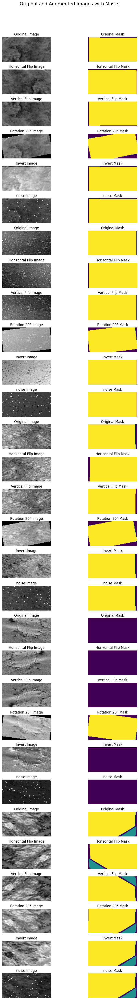

In [6]:
# Helper functions for applying augmentations
def augment_image_and_mask(image, mask, augment_type):
    if augment_type == "Horizontal Flip":
        return np.fliplr(image), np.fliplr(mask)
    elif augment_type == "Vertical Flip":
        return np.flipud(image), np.flipud(mask)
    elif augment_type == "Rotation 20°":
        angle = np.random.uniform(-20, 20)
        # Rotate the grayscale image (bilinear interpolation)
        rotated_image = rotate(image, angle, reshape=False, mode="constant", order=1)

        # Rotate the mask (nearest-neighbor interpolation)
        rotated_mask = rotate(mask, angle, reshape=False, mode="constant", order=0)

        return rotated_image, rotated_mask
    elif augment_type=="Invert":
        inverted_image, inverted_mask = invert_image(image, mask)
        return inverted_image,inverted_mask
    elif augment_type=="noise":
        noisy_image, noisy_mask = add_salt_and_pepper_noise(image, mask)
        return noisy_image,noisy_mask

    """elif augment_type == "Zoom (0.8-1.2)":
        zoom_factor = random.uniform(0.8, 1.2)
        zoom_image = np.clip(image * zoom_factor, 0, 255)
        return zoom_image, mask
    elif augment_type == "Shift (Width and Height)":
        shift_x, shift_y = random.uniform(-0.1, 0.1), random.uniform(-0.1, 0.1)
        return shift(image, [shift_x * image.shape[0], shift_y * image.shape[1]]), shift(mask, [shift_x * mask.shape[0], shift_y * mask.shape[1]], order=0)"""
    return image, mask

# Define augmentations
data_augmentations = {
    "Horizontal Flip": "Horizontal Flip",
    "Vertical Flip": "Vertical Flip",
    "Rotation 20°": "Rotation 20°",
    "Invert":"Invert",
    "noise":"noise"
    #"Zoom (0.8-1.2)": "Zoom (0.8-1.2)",
    #"Shift (Width and Height)": "Shift (Width and Height)",
}

# Visualize 5 random images and masks with augmentations
random_indices = np.random.choice(len(X_train), size=5, replace=False)
# Adjusting to display original image/mask with augmentations below each
fig, axes = plt.subplots(len(random_indices) * (1 + len(data_augmentations)), 2, figsize=(10, 50))
fig.suptitle("Original and Augmented Images with Masks", fontsize=16)

for idx, random_idx in enumerate(random_indices):
    original_image = X_train[random_idx]
    original_mask = y_train[random_idx]

    # Plot original image and mask
    row = idx * (1 + len(data_augmentations))  # Calculate starting row for each original image
    axes[row, 0].imshow(original_image, cmap='gray')
    axes[row, 0].set_title("Original Image")
    axes[row, 0].axis('off')

    axes[row, 1].imshow(original_mask)
    axes[row, 1].set_title("Original Mask")
    axes[row, 1].axis('off')

    # Apply augmentations and plot augmented images and masks
    for aug_idx, (augmentation_name, augment_type) in enumerate(data_augmentations.items()):
        augmented_image, augmented_mask = augment_image_and_mask(original_image, original_mask, augment_type)

        axes[row + aug_idx + 1, 0].imshow(augmented_image , cmap='gray' )
        axes[row + aug_idx + 1, 0].set_title(f"{augmentation_name} Image")
        axes[row + aug_idx + 1, 0].axis('off')

        axes[row + aug_idx + 1, 1].imshow(augmented_mask)
        axes[row + aug_idx + 1, 1].set_title(f"{augmentation_name} Mask")
        axes[row + aug_idx + 1, 1].axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

In [7]:
import os
import matplotlib.pyplot as plt

# Directory where augmented files are stored
output_dir = "augmented_data"
os.makedirs(output_dir, exist_ok=True)

# Re-save augmented datasets to the directory with structured filenames
for augmentation_name, augment_type in data_augmentations.items():
    augmented_images = []
    augmented_masks = []

    for image, mask in zip(X_train, y_train):
        aug_image, aug_mask = augment_image_and_mask(image, mask, augment_type)
        augmented_images.append(aug_image)
        augmented_masks.append(aug_mask)

    # Convert lists to numpy arrays
    augmented_images = np.array(augmented_images)
    augmented_masks = np.array(augmented_masks)

    # Save to npz file
    output_path = os.path.join(output_dir, f"{augmentation_name.replace(' ', '_').lower()}.npz")
    np.savez_compressed(output_path, augmented_images=augmented_images, augmented_masks=augmented_masks)


File: vertical_flip.npz
  Key: augmented_images, Shape: (2004, 64, 128)
  Key: augmented_masks, Shape: (2004, 64, 128)


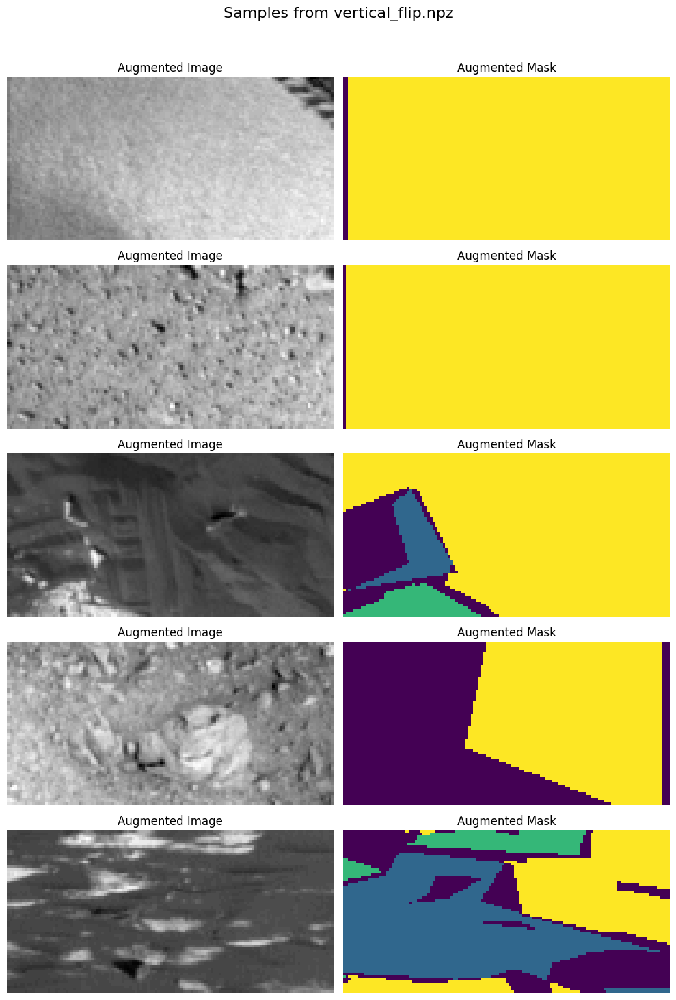

File: rotation_20°.npz
  Key: augmented_images, Shape: (2004, 64, 128)
  Key: augmented_masks, Shape: (2004, 64, 128)


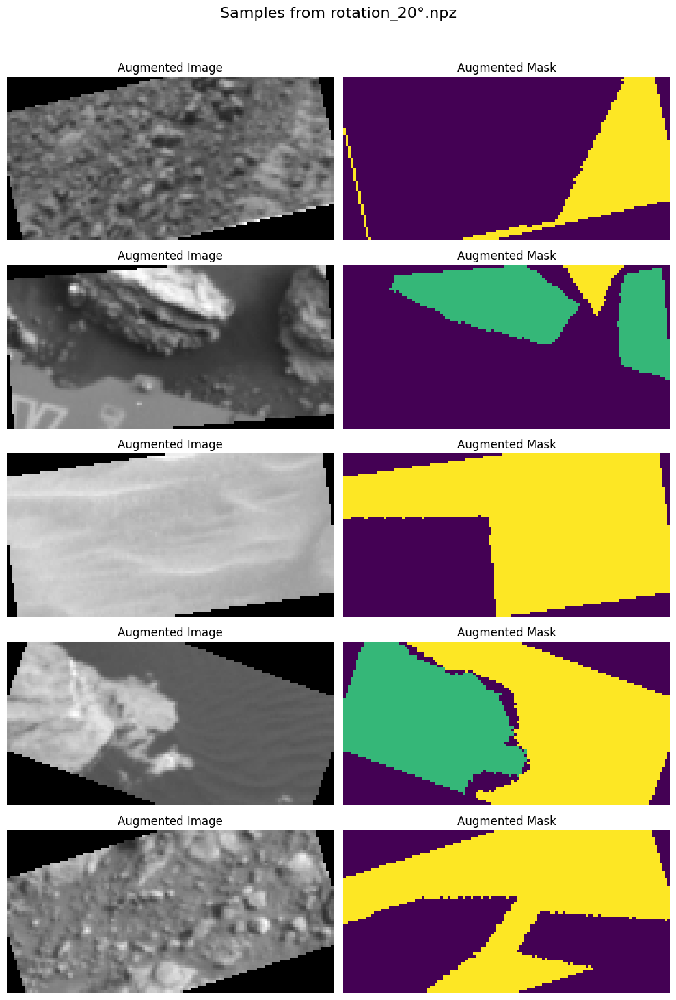

File: invert.npz
  Key: augmented_images, Shape: (2004, 64, 128)
  Key: augmented_masks, Shape: (2004, 64, 128)


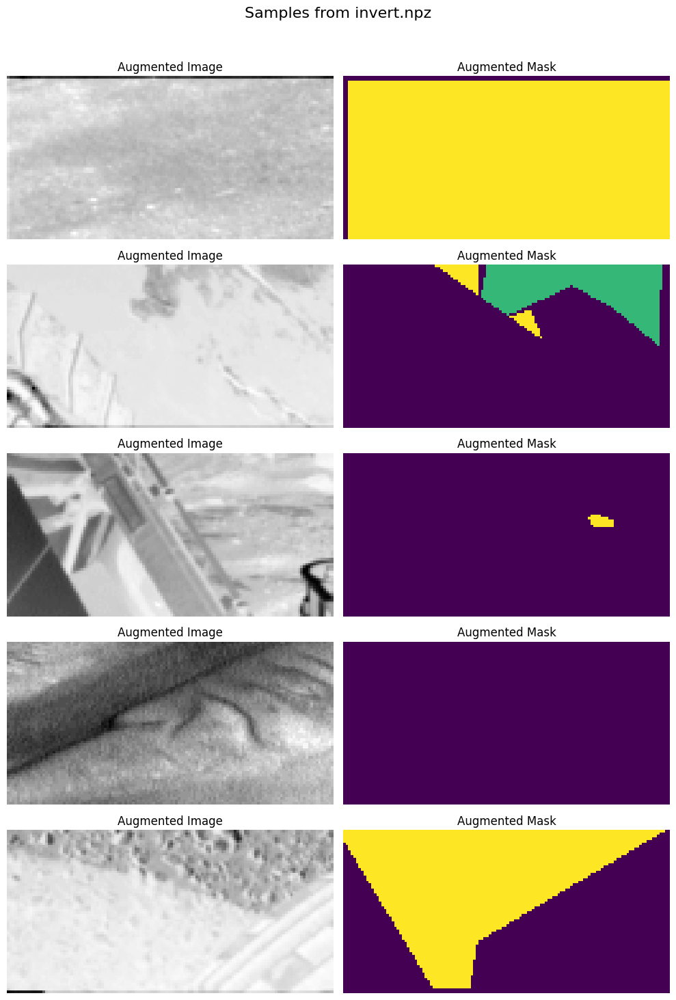

File: noise.npz
  Key: augmented_images, Shape: (2004, 64, 128)
  Key: augmented_masks, Shape: (2004, 64, 128)


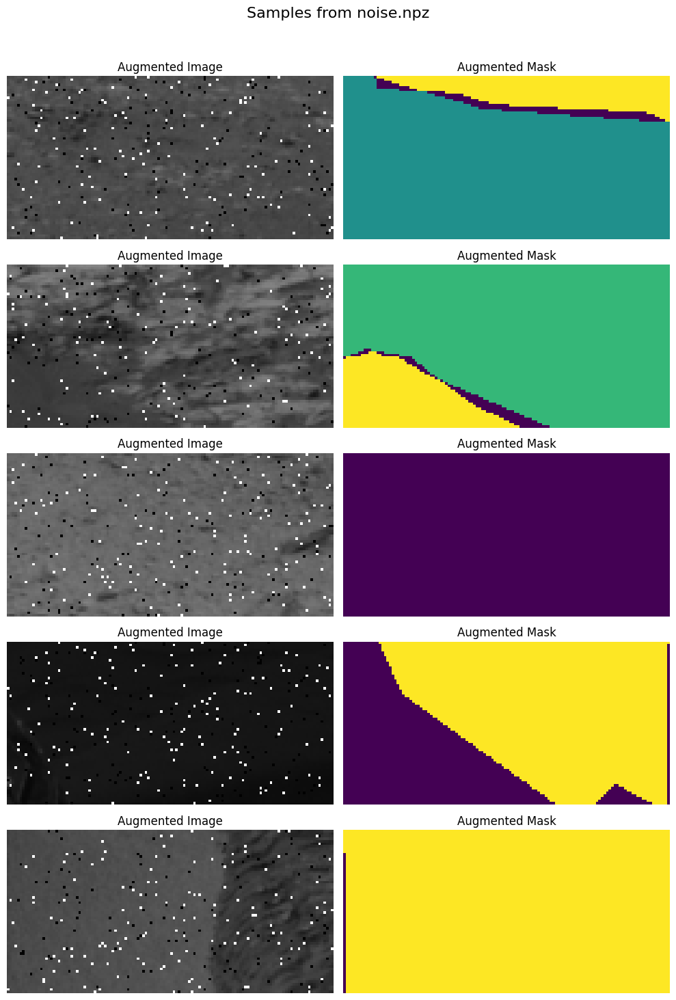

File: horizontal_flip.npz
  Key: augmented_images, Shape: (2004, 64, 128)
  Key: augmented_masks, Shape: (2004, 64, 128)


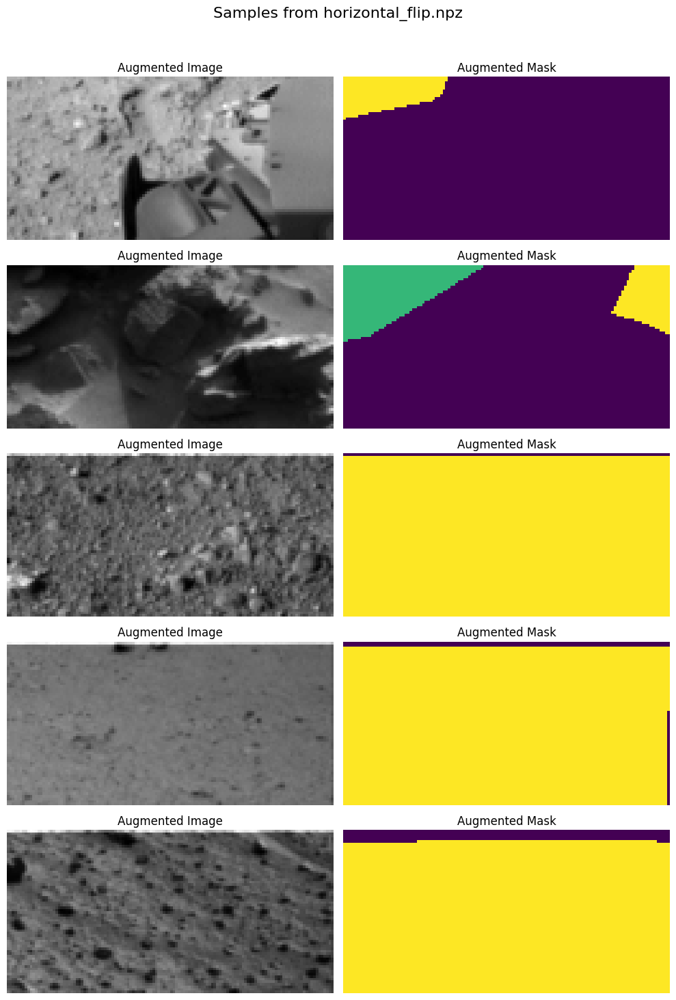

In [8]:

# Read the saved files and display details
output_dir="/kaggle/working/augmented_data"
for file_name in os.listdir(output_dir):
    if file_name.endswith(".npz"):
        file_path = os.path.join(output_dir, file_name)
        data = np.load(file_path)

        # Display keys and their shapes
        print(f"File: {file_name}")
        for key in data.keys():
            print(f"  Key: {key}, Shape: {data[key].shape}")

        # Plot 5 random images and masks
        fig, axes = plt.subplots(5, 2, figsize=(10, 15))
        fig.suptitle(f"Samples from {file_name}", fontsize=16)
        for i in range(5):
            random_idx = np.random.randint(data["augmented_images"].shape[0])
            axes[i, 0].imshow(data["augmented_images"][random_idx], cmap="gray")
            axes[i, 0].set_title("Augmented Image")
            axes[i, 0].axis("off")
            axes[i, 1].imshow(data["augmented_masks"][random_idx])
            axes[i, 1].set_title("Augmented Mask")
            axes[i, 1].axis("off")
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()

## 🛠️ Train and Save the Model

In [9]:
# Load the rotation augmentation dataset
rotation_file_path = os.path.join("/kaggle/working/augmented_data/horizontal_flip.npz")
rotation_data = np.load(rotation_file_path)

# Extract augmented images and masks
augmented_images = rotation_data["augmented_images"]
augmented_masks = rotation_data["augmented_masks"]

# Merge with original X_train and y_train
X_train = np.concatenate([X_train, augmented_images], axis=0)
y_train = np.concatenate([y_train, augmented_masks], axis=0)

# Display the new shapes
print(f"New X_train shape: {X_train.shape}")
print(f"New y_train shape: {y_train.shape}")

New X_train shape: (4008, 64, 128)
New y_train shape: (4008, 64, 128)


In [10]:
# Load the rotation augmentation dataset
rotation_file_path = os.path.join("/kaggle/working/augmented_data/vertical_flip.npz")
rotation_data = np.load(rotation_file_path)

# Extract augmented images and masks
augmented_images = rotation_data["augmented_images"]
augmented_masks = rotation_data["augmented_masks"]

# Merge with original X_train and y_train
X_train = np.concatenate([X_train, augmented_images], axis=0)
y_train = np.concatenate([y_train, augmented_masks], axis=0)

# Display the new shapes
print(f"New X_train shape: {X_train.shape}")
print(f"New y_train shape: {y_train.shape}")

New X_train shape: (6012, 64, 128)
New y_train shape: (6012, 64, 128)


In [11]:
# Load the rotation augmentation dataset
rotation_file_path = os.path.join("/kaggle/working/augmented_data/rotation_20°.npz")
rotation_data = np.load(rotation_file_path)

# Extract augmented images and masks
augmented_images = rotation_data["augmented_images"]
augmented_masks = rotation_data["augmented_masks"]

# Merge with original X_train and y_train
X_train = np.concatenate([X_train, augmented_images], axis=0)
y_train = np.concatenate([y_train, augmented_masks], axis=0)

# Display the new shapes
print(f"New X_train shape: {X_train.shape}")
print(f"New y_train shape: {y_train.shape}")

New X_train shape: (8016, 64, 128)
New y_train shape: (8016, 64, 128)


In [12]:
# Load the rotation augmentation dataset
rotation_file_path = os.path.join("/kaggle/working/augmented_data/invert.npz")
rotation_data = np.load(rotation_file_path)

# Extract augmented images and masks
augmented_images = rotation_data["augmented_images"]
augmented_masks = rotation_data["augmented_masks"]

# Merge with original X_train and y_train
X_train = np.concatenate([X_train, augmented_images], axis=0)
y_train = np.concatenate([y_train, augmented_masks], axis=0)

# Display the new shapes
print(f"New X_train shape: {X_train.shape}")
print(f"New y_train shape: {y_train.shape}")

New X_train shape: (10020, 64, 128)
New y_train shape: (10020, 64, 128)


In [13]:
# Load the rotation augmentation dataset
rotation_file_path = os.path.join("/kaggle/working/augmented_data/noise.npz")
rotation_data = np.load(rotation_file_path)

# Extract augmented images and masks
augmented_images = rotation_data["augmented_images"]
augmented_masks = rotation_data["augmented_masks"]

# Merge with original X_train and y_train
X_train = np.concatenate([X_train, augmented_images], axis=0)
y_train = np.concatenate([y_train, augmented_masks], axis=0)

# Display the new shapes
print(f"New X_train shape: {X_train.shape}")
print(f"New y_train shape: {y_train.shape}")

New X_train shape: (12024, 64, 128)
New y_train shape: (12024, 64, 128)


In [14]:
# Add color channel and rescale pixels between 0 and 1
X_train = X_train[..., np.newaxis] / 255.0
X_test = X_test[..., np.newaxis] / 255.0

input_shape = X_train.shape[1:]
num_classes = len(np.unique(y_train))

print(f"Input shape: {input_shape}")
print(f"Number of classes: {num_classes}")

Input shape: (64, 128, 1)
Number of classes: 5


In [15]:
X_val = X_val[..., np.newaxis] / 255.0

In [16]:
print(f"X_train shape: {X_train.shape}")
print(f"X_val shape: {X_val.shape}")
print(f"y_train shape: {y_train.shape}")

X_train shape: (12024, 64, 128, 1)
X_val shape: (501, 64, 128, 1)
y_train shape: (12024, 64, 128)


In [17]:
# Custom callback for visualization
class VisualizeSegmentationCallback(tf.keras.callbacks.Callback):
    def __init__(self, X_train, y_train, num_images=2):
        super().__init__()
        self.X_train = X_train
        self.y_train = y_train
        self.num_images = num_images
        self.selected_indices = []

        # Identify images containing at least 4 classes
        for i in range(len(y_train)):
            if len(np.unique(y_train[i])) >= 4:  # Check for at least 4 classes
                self.selected_indices.append(i)
            if len(self.selected_indices) == num_images:
                break

    def on_epoch_end(self, epoch, logs=None):
        # Plot predictions for the selected images
        fig, axes = plt.subplots(self.num_images, 3, figsize=(15, self.num_images * 5))

        for idx, i in enumerate(self.selected_indices):
            # Extract image and ground truth
            X_sample = self.X_train[i:i + 1]  # Add batch dimension
            y_sample = self.y_train[i]

            # Predict on the image
            predicted_mask = self.model.predict(X_sample)
            predicted_mask = np.argmax(predicted_mask, axis=-1)[0]  # Convert to class labels

            # Visualize the input, ground truth, and predicted mask
            axes[idx, 0].imshow(X_sample[0].squeeze(), cmap="gray")
            axes[idx, 0].set_title("Input Image")
            axes[idx, 0].axis("off")

            axes[idx, 1].imshow(y_sample, cmap="viridis")
            axes[idx, 1].set_title("Ground Truth Mask")
            axes[idx, 1].axis("off")

            axes[idx, 2].imshow(predicted_mask, cmap="viridis")
            axes[idx, 2].set_title(f"Predicted Mask (Epoch {epoch + 1})")
            axes[idx, 2].axis("off")

        plt.tight_layout()
        plt.show()

## Adding advanced tecnics

In [18]:
# Ensure the input shape for both images and masks is correct
X_train = np.squeeze(X_train)  # Remove any singleton dimensions
y_train = np.squeeze(y_train)  # Remove any singleton dimensions

# Check if the channel dimension exists, otherwise add it
if X_train.ndim == 3:  # If missing the channel dimension, add it
    X_train = X_train[..., np.newaxis]

if y_train.ndim == 3:  # Ensure y_train has the correct shape
    y_train = y_train[..., np.newaxis]

print(f"Shape of X_train after reshaping: {X_train.shape}")
print(f"Shape of y_train after reshaping: {y_train.shape}")

Shape of X_train after reshaping: (12024, 64, 128, 1)
Shape of y_train after reshaping: (12024, 64, 128, 1)


In [19]:
# Ensure the input shape for both images and masks is correct
X_val = np.squeeze(X_val)  # Remove any singleton dimensions
y_val= np.squeeze(y_val)  # Remove any singleton dimensions

# Check if the channel dimension exists, otherwise add it
if X_val.ndim == 3:  # If missing the channel dimension, add it
    X_val = X_val[..., np.newaxis]

if y_val.ndim == 3:  # Ensure y_train has the correct shape
    y_val = y_val[..., np.newaxis]

print(f"Shape of X_train after reshaping: {X_val.shape}")
print(f"Shape of y_train after reshaping: {y_val.shape}")

Shape of X_train after reshaping: (501, 64, 128, 1)
Shape of y_train after reshaping: (501, 64, 128, 1)


In [20]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# Ensure the input shape for both images and masks is correct
X_train = np.squeeze(X_train)  # Remove singleton dimensions
if X_train.ndim == 3:  # If missing the channel dimension, add it
    X_train = X_train[..., np.newaxis]

y_train = np.squeeze(y_train)  # Ensure that y_train has the correct shape

print(f"Shape of X_train after reshaping: {X_train.shape}")
print(f"Shape of y_train after reshaping: {y_train.shape}")

# Convert y_train to integers for class count
y_train_int = y_train.astype(np.int32)

# Calculate class weights based on pixel proportions
class_pixel_counts = np.bincount(y_train_int.flatten(), minlength=num_classes)  # Count pixels for each class
total_pixels = np.sum(class_pixel_counts)  # Total number of pixels
class_weights = total_pixels / (class_pixel_counts + 1e-6)  # Inverse frequency
class_weights /= np.sum(class_weights)  # Normalize to sum to 1

print(f"Class pixel counts: {class_pixel_counts}")
print(f"Calculated class weights: {class_weights}")

# Updated EarlyStopping with min_delta to ignore minimal improvements
"""early_stopping = EarlyStopping(
    monitor="val_loss",  # Monitor loss instead of validation loss
    patience=50,
    restore_best_weights=True,
    min_delta=1e-4  # Minimum change to qualify as an improvement
)
"""

model_checkpoint = ModelCheckpoint(
    filepath="best_model.keras",
    monitor="val_loss",  # Monitor loss instead of validation loss
    save_best_only=True,
    mode="min",
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor="val_loss",  # Monitor loss instead of validation loss
    factor=0.5,
    patience=20,
    verbose=1,
    mode="min",
    min_lr=1e-6
)

# Visualization Callback for Two Images with At Least 4 Classes
visualize_callback = VisualizeSegmentationCallback(X_val, y_val, num_images=2)




Shape of X_train after reshaping: (12024, 64, 128, 1)
Shape of y_train after reshaping: (12024, 64, 128)
Class pixel counts: [25103192 32634216 23167641 17469862   125697]
Calculated class weights: [0.00490192 0.0037707  0.00531145 0.00704378 0.97897214]


In [21]:
# Define custom Mean Intersection Over Union metric
class MeanIntersectionOverUnion(tf.keras.metrics.MeanIoU):
    def __init__(self, num_classes, labels_to_exclude=None, name="mean_iou", dtype=None):
        super(MeanIntersectionOverUnion, self).__init__(num_classes=num_classes, name=name, dtype=dtype)
        if labels_to_exclude is None:
            labels_to_exclude = [0]  # Default to excluding label 0
        self.labels_to_exclude = labels_to_exclude

    def update_state(self, y_true, y_pred, sample_weight=None):
        # Convert predictions to class labels
        y_pred = tf.math.argmax(y_pred, axis=-1)

        # Flatten the tensors
        y_true = tf.reshape(y_true, [-1])
        y_pred = tf.reshape(y_pred, [-1])

        # Apply mask to exclude specified labels
        for label in self.labels_to_exclude:
            mask = tf.not_equal(y_true, label)
            y_true = tf.boolean_mask(y_true, mask)
            y_pred = tf.boolean_mask(y_pred, mask)

        # Update the state
        return super().update_state(y_true, y_pred, sample_weight)

In [22]:
class PerClassIoUCallback(tf.keras.callbacks.Callback):
    def __init__(self, validation_data, num_classes, labels_to_exclude=None):
        super(PerClassIoUCallback, self).__init__()
        self.validation_data = validation_data
        self.num_classes = num_classes
        self.labels_to_exclude = labels_to_exclude if labels_to_exclude is not None else [0]

    def on_epoch_end(self, epoch, logs=None):
        val_X, val_y = self.validation_data
        y_pred = self.model.predict(val_X, verbose=0)
        y_pred = tf.math.argmax(y_pred, axis=-1)

        # Initialize IoU calculation
        total_cm = np.zeros((self.num_classes, self.num_classes))

        for true_mask, pred_mask in zip(val_y, y_pred):
            # Flatten the tensors
            true_mask = tf.reshape(true_mask, [-1])
            pred_mask = tf.reshape(pred_mask, [-1])

            # Exclude specified labels
            mask = tf.not_equal(true_mask, self.labels_to_exclude)
            true_mask = tf.boolean_mask(true_mask, mask)
            pred_mask = tf.boolean_mask(pred_mask, mask)

            # Update confusion matrix
            current_cm = tf.math.confusion_matrix(
                true_mask, pred_mask, num_classes=self.num_classes
            )
            total_cm += current_cm.numpy()

        # Compute per-class IoU
        per_class_iou = []
        for i in range(self.num_classes):
            if i in self.labels_to_exclude:
                per_class_iou.append(None)  # Excluded classes
            else:
                tp = total_cm[i, i]
                fp = np.sum(total_cm[:, i]) - tp
                fn = np.sum(total_cm[i, :]) - tp
                denominator = tp + fp + fn
                iou = tp / denominator if denominator > 0 else 0.0
                per_class_iou.append(iou)

        # Log the IoU values
        print(f"Epoch {epoch + 1}: Per-class IoUs: {per_class_iou}")


In [23]:
from tensorflow.keras.callbacks import Callback
class SaveBestMeanIoU(Callback):
    def __init__(self, filepath, monitor="val_mean_io_u", mode="max", verbose=1):
        super(SaveBestMeanIoU, self).__init__()
        self.filepath = filepath
        self.monitor = monitor
        self.mode = mode
        self.verbose = verbose
        self.best = -float("inf") if mode == "max" else float("inf")

    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}
        # Debug: Print available keys in logs
        print(f"Available log keys: {logs.keys()}")

        # Use the correct log key
        current = logs.get(self.monitor)
        if current is None:
            if self.verbose > 0:
                print(f"Warning: Monitor '{self.monitor}' is not available in logs.")
            return

        if (self.mode == "max" and current > self.best) or (self.mode == "min" and current < self.best):
            self.best = current
            if self.verbose > 0:
                print(f"Epoch {epoch + 1}: {self.monitor} improved to {current:.4f}, saving model.")
            self.model.save(self.filepath)


In [24]:
def weighted_sparse_categorical_crossentropy(class_weights):
    def loss(y_true, y_pred):
        # One-hot encode y_true
        y_true_one_hot = tf.one_hot(tf.cast(y_true, tf.int32), depth=len(class_weights))

        # Reshape to (batch_size * height * width, num_classes)
        y_true_one_hot = tf.reshape(y_true_one_hot, (-1, len(class_weights)))
        y_pred = tf.reshape(y_pred, (-1, len(class_weights)))

        # Convert class_weights to a tensor
        weights_tensor = tf.gather(tf.constant(class_weights, dtype=tf.float32), tf.cast(tf.reshape(y_true, (-1,)), tf.int32))

        # Compute sparse categorical crossentropy
        y_pred = tf.clip_by_value(y_pred, tf.keras.backend.epsilon(), 1 - tf.keras.backend.epsilon())
        cross_entropy = -tf.reduce_sum(y_true_one_hot * tf.math.log(y_pred), axis=-1)

        # Apply weights to loss
        weighted_loss = weights_tensor * cross_entropy

        return tf.reduce_mean(weighted_loss)
    return loss

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 64, 128,   │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 64, 128,   │        640 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 64, 128,   │     36,928 │ conv2d[0][0]      │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 64, 128,   │        128 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 64, 128,   │          0 │ conv2d_1[0][0],   │
│                     │ 64)               │            │ conv2d_2[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 32, 64,    │          0 │ add[0][0]         │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 32, 64,    │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 32, 64,    │    147,584 │ conv2d_3[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 32, 64,    │      8,320 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_1 (Add)         │ (None, 32, 64,    │          0 │ conv2d_4[0][0],   │
│                     │ 128)              │            │ conv2d_5[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 16, 32,    │          0 │ add_1[0][0]       │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 16, 32,    │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 16, 32,    │    590,080 │ conv2d_6[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 16, 32,    │     33,024 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_2 (Add)         │ (None, 16, 32,    │          0 │ conv2d_7[0][0],   │
│                     │ 256)              │            │ conv2d_8[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 8, 16,     │          0 │ add_2[0][0]       │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 8, 16,     │  1,180,160 │ max_pooling2d_2[

 Total params: 8,041,989 (30.68 MB)

 Trainable params: 8,041,989 (30.68 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/300


I0000 00:00:1733488936.930223      92 service.cc:145] XLA service 0x78eb98007ce0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733488936.930272      92 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1733488936.930276      92 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1733488970.275169      92 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_compare_reduce_fusion_1', 80 bytes spill stores, 80 bytes spill loads

I0000 00:00:1733488970.288208      92 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - accuracy: 0.2904 - loss: 0.0100 - mean_io_u: 0.1152 - mean_iou: 0.1152Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 1: val_mean_iou improved to 0.0998, saving model.

Epoch 1: val_loss improved from inf to 0.00965, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


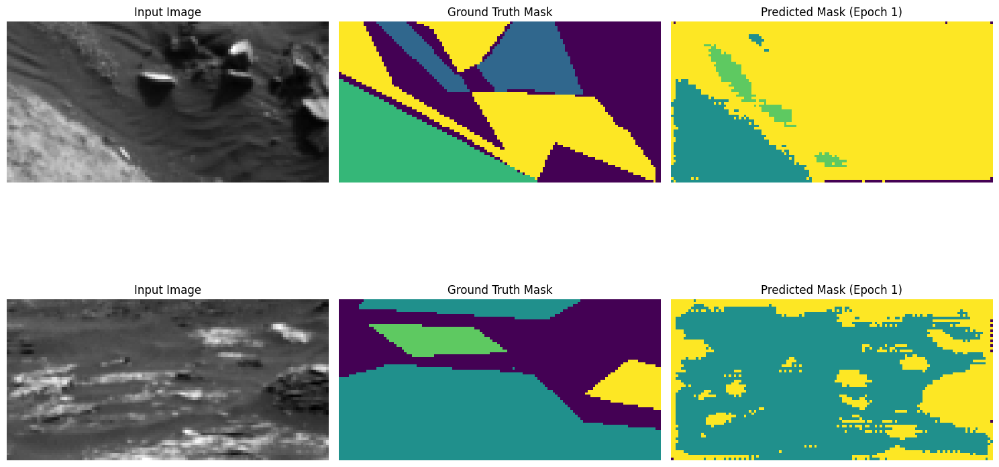

Epoch 1: Per-class IoUs: [None, 4.1376244004827694e-05, 0.25484115170249433, 0.23966471081307628, 0.0045632205795457]
376/376 ━━━━━━━━━━━━━━━━━━━━ 166s 337ms/step - accuracy: 0.2904 - loss: 0.0100 - mean_io_u: 0.1152 - mean_iou: 0.1152 - val_accuracy: 0.1849 - val_loss: 0.0096 - val_mean_io_u: 0.0998 - val_mean_iou: 0.0998 - learning_rate: 1.0000e-04
Epoch 2/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step - accuracy: 0.2513 - loss: 0.0095 - mean_io_u: 0.1311 - mean_iou: 0.1311Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 2: val_loss improved from 0.00965 to 0.00957, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


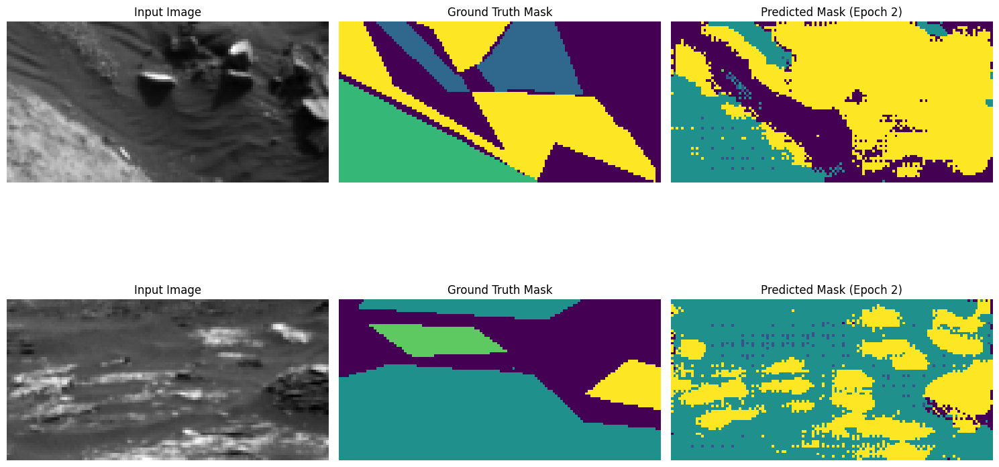

Epoch 2: Per-class IoUs: [None, 0.024173314430865955, 0.22628167112026637, 0.00037681898281040463, 0.0068076546774403215]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 239ms/step - accuracy: 0.2514 - loss: 0.0095 - mean_io_u: 0.1311 - mean_iou: 0.1311 - val_accuracy: 0.1547 - val_loss: 0.0096 - val_mean_io_u: 0.0515 - val_mean_iou: 0.0515 - learning_rate: 1.0000e-04
Epoch 3/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - accuracy: 0.2737 - loss: 0.0093 - mean_io_u: 0.1354 - mean_iou: 0.1354Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 3: val_mean_iou improved to 0.1869, saving model.

Epoch 3: val_loss improved from 0.00957 to 0.00879, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


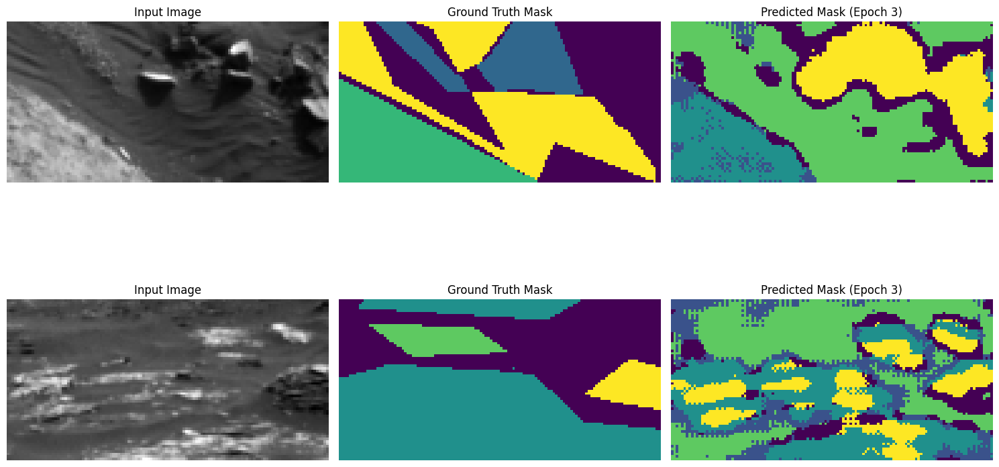

Epoch 3: Per-class IoUs: [None, 0.21152368507061511, 0.2818648658154831, 0.4262979215762737, 0.0146767798888266]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 241ms/step - accuracy: 0.2737 - loss: 0.0093 - mean_io_u: 0.1355 - mean_iou: 0.1355 - val_accuracy: 0.3503 - val_loss: 0.0088 - val_mean_io_u: 0.1869 - val_mean_iou: 0.1869 - learning_rate: 1.0000e-04
Epoch 4/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.3139 - loss: 0.0087 - mean_io_u: 0.1656 - mean_iou: 0.1656Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 4: val_loss improved from 0.00879 to 0.00774, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


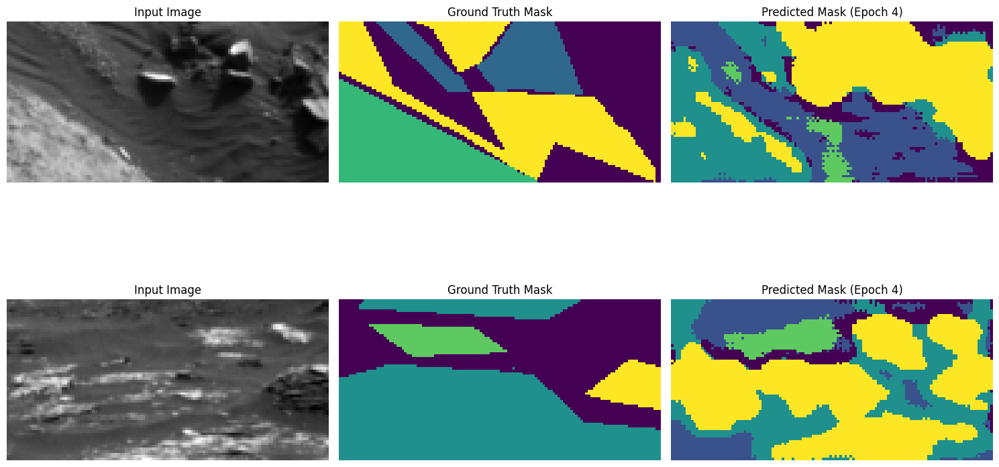

Epoch 4: Per-class IoUs: [None, 0.1882088256828243, 0.18606973147879424, 0.5249000309455684, 0.006442085312069004]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.3140 - loss: 0.0087 - mean_io_u: 0.1656 - mean_iou: 0.1656 - val_accuracy: 0.3007 - val_loss: 0.0077 - val_mean_io_u: 0.1811 - val_mean_iou: 0.1811 - learning_rate: 1.0000e-04
Epoch 5/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.3476 - loss: 0.0082 - mean_io_u: 0.1883 - mean_iou: 0.1883Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 5: val_mean_iou improved to 0.2514, saving model.

Epoch 5: val_loss improved from 0.00774 to 0.00693, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


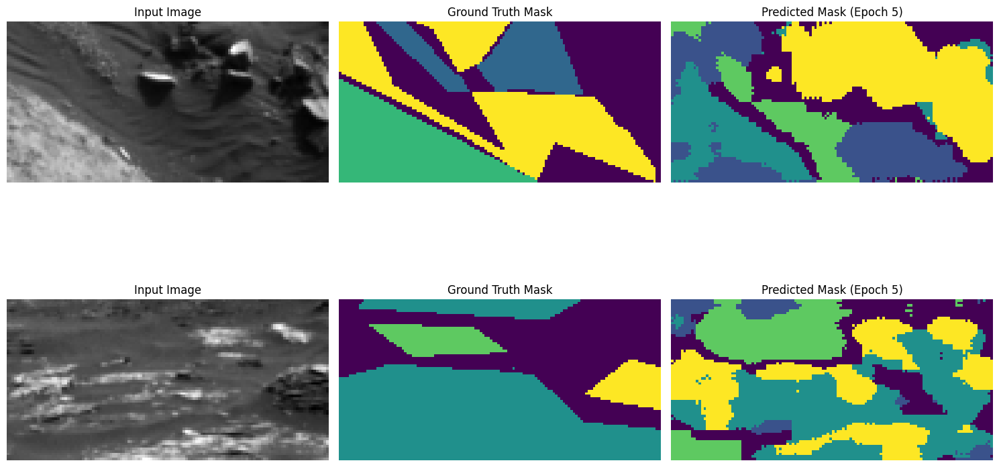

Epoch 5: Per-class IoUs: [None, 0.33954719545496564, 0.3103204311764158, 0.591136053630267, 0.016142716287175254]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 242ms/step - accuracy: 0.3477 - loss: 0.0082 - mean_io_u: 0.1884 - mean_iou: 0.1884 - val_accuracy: 0.4383 - val_loss: 0.0069 - val_mean_io_u: 0.2514 - val_mean_iou: 0.2514 - learning_rate: 1.0000e-04
Epoch 6/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - accuracy: 0.3701 - loss: 0.0081 - mean_io_u: 0.1911 - mean_iou: 0.1911Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 6: val_loss did not improve from 0.00693
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


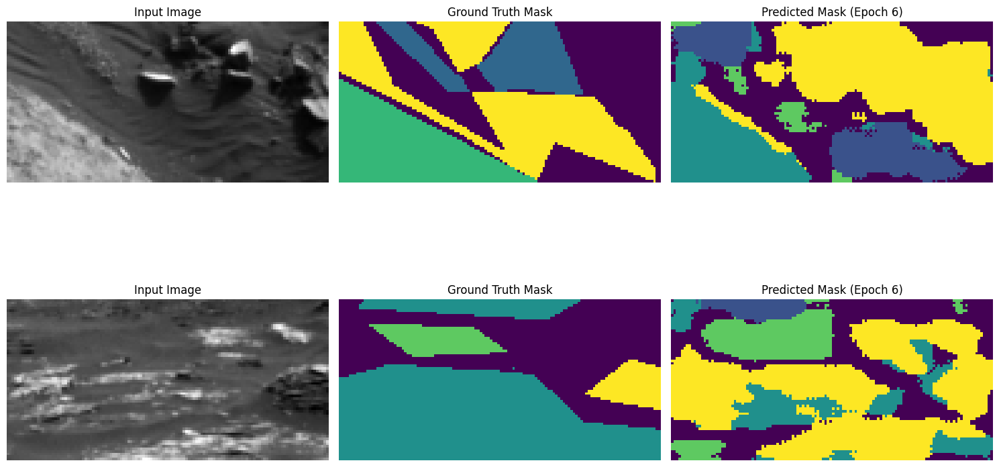

Epoch 6: Per-class IoUs: [None, 0.18412735987845522, 0.27087915140305413, 0.5972912590789609, 0.01096730343146616]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 239ms/step - accuracy: 0.3701 - loss: 0.0081 - mean_io_u: 0.1911 - mean_iou: 0.1911 - val_accuracy: 0.3741 - val_loss: 0.0072 - val_mean_io_u: 0.2127 - val_mean_iou: 0.2127 - learning_rate: 1.0000e-04
Epoch 7/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.4020 - loss: 0.0078 - mean_io_u: 0.2153 - mean_iou: 0.2153Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 7: val_mean_iou improved to 0.2765, saving model.

Epoch 7: val_loss improved from 0.00693 to 0.00674, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


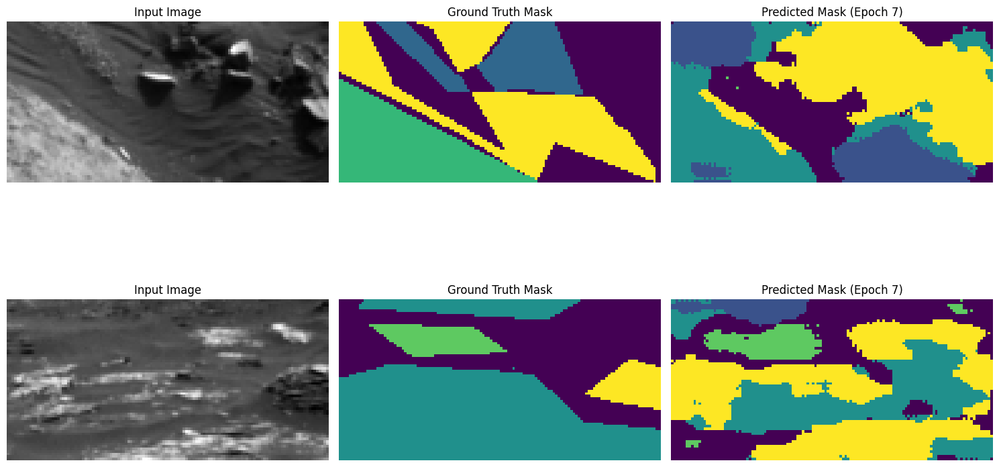

Epoch 7: Per-class IoUs: [None, 0.41712897514892433, 0.3380526336728497, 0.6124373430546534, 0.014662431242481927]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 242ms/step - accuracy: 0.4021 - loss: 0.0078 - mean_io_u: 0.2153 - mean_iou: 0.2153 - val_accuracy: 0.4632 - val_loss: 0.0067 - val_mean_io_u: 0.2765 - val_mean_iou: 0.2765 - learning_rate: 1.0000e-04
Epoch 8/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.4385 - loss: 0.0073 - mean_io_u: 0.2407 - mean_iou: 0.2407Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 8: val_mean_iou improved to 0.3077, saving model.

Epoch 8: val_loss improved from 0.00674 to 0.00635, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


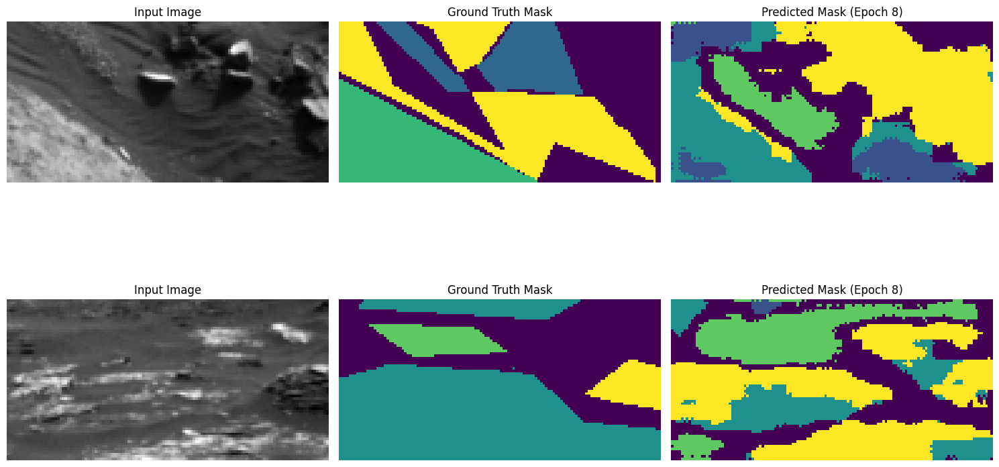

Epoch 8: Per-class IoUs: [None, 0.5191250919475574, 0.3467172898189641, 0.6572918477655733, 0.015574146612737068]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 242ms/step - accuracy: 0.4386 - loss: 0.0073 - mean_io_u: 0.2408 - mean_iou: 0.2408 - val_accuracy: 0.5083 - val_loss: 0.0064 - val_mean_io_u: 0.3077 - val_mean_iou: 0.3077 - learning_rate: 1.0000e-04
Epoch 9/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.4694 - loss: 0.0069 - mean_io_u: 0.2642 - mean_iou: 0.2642Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 9: val_loss improved from 0.00635 to 0.00632, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


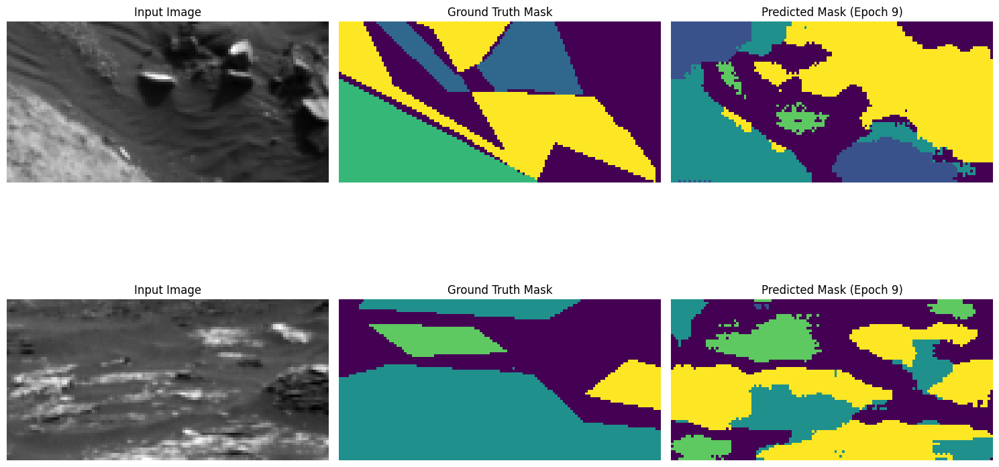

Epoch 9: Per-class IoUs: [None, 0.48427033973424993, 0.33780645864389497, 0.6574902094046005, 0.015231023343516583]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.4695 - loss: 0.0069 - mean_io_u: 0.2642 - mean_iou: 0.2642 - val_accuracy: 0.4973 - val_loss: 0.0063 - val_mean_io_u: 0.2990 - val_mean_iou: 0.2990 - learning_rate: 1.0000e-04
Epoch 10/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.4813 - loss: 0.0068 - mean_io_u: 0.2711 - mean_iou: 0.2711Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 10: val_loss did not improve from 0.00632
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


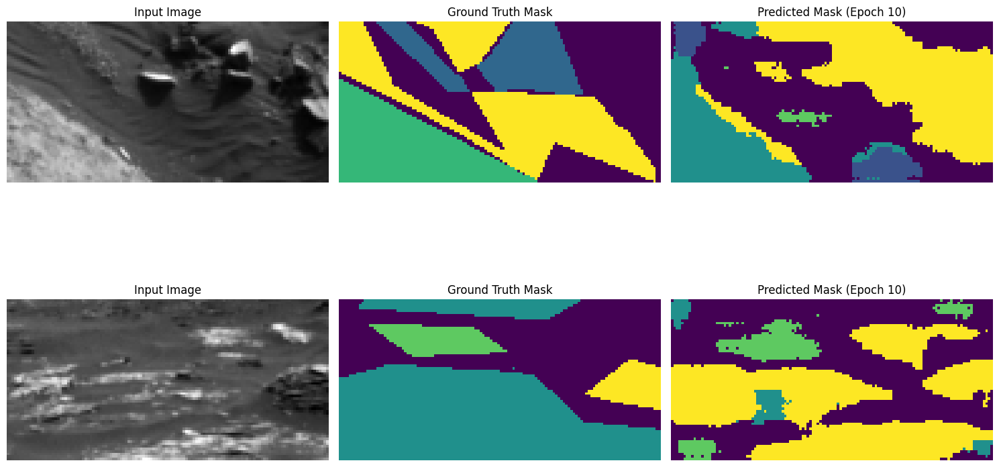

Epoch 10: Per-class IoUs: [None, 0.42216399840528446, 0.24609284390956607, 0.6190875406688588, 0.009410050004156695]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 240ms/step - accuracy: 0.4814 - loss: 0.0068 - mean_io_u: 0.2712 - mean_iou: 0.2712 - val_accuracy: 0.4460 - val_loss: 0.0068 - val_mean_io_u: 0.2594 - val_mean_iou: 0.2594 - learning_rate: 1.0000e-04
Epoch 11/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.5077 - loss: 0.0065 - mean_io_u: 0.2932 - mean_iou: 0.2932Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 11: val_loss improved from 0.00632 to 0.00628, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


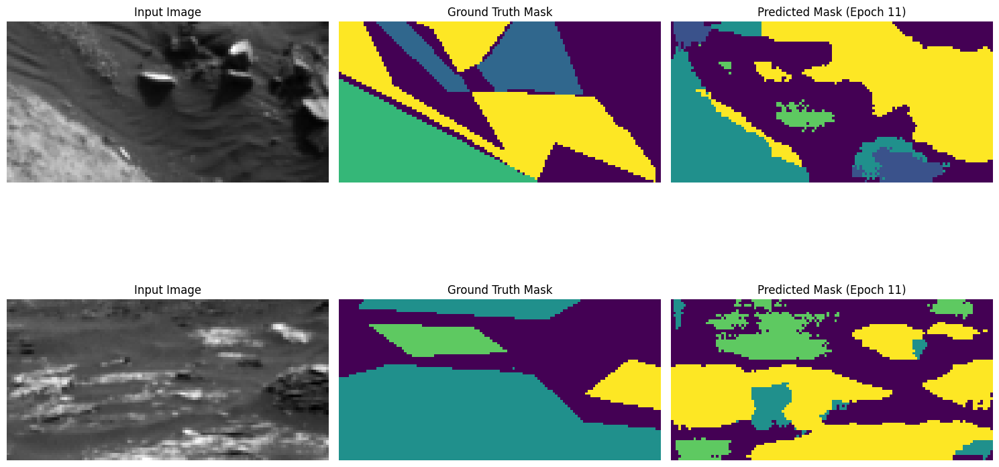

Epoch 11: Per-class IoUs: [None, 0.5150719294529267, 0.3068864498755559, 0.6520387174073329, 0.011763135388054501]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.5077 - loss: 0.0065 - mean_io_u: 0.2932 - mean_iou: 0.2932 - val_accuracy: 0.5024 - val_loss: 0.0063 - val_mean_io_u: 0.2972 - val_mean_iou: 0.2972 - learning_rate: 1.0000e-04
Epoch 12/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.5371 - loss: 0.0061 - mean_io_u: 0.3115 - mean_iou: 0.3115Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 12: val_mean_iou improved to 0.3183, saving model.

Epoch 12: val_loss improved from 0.00628 to 0.00603, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


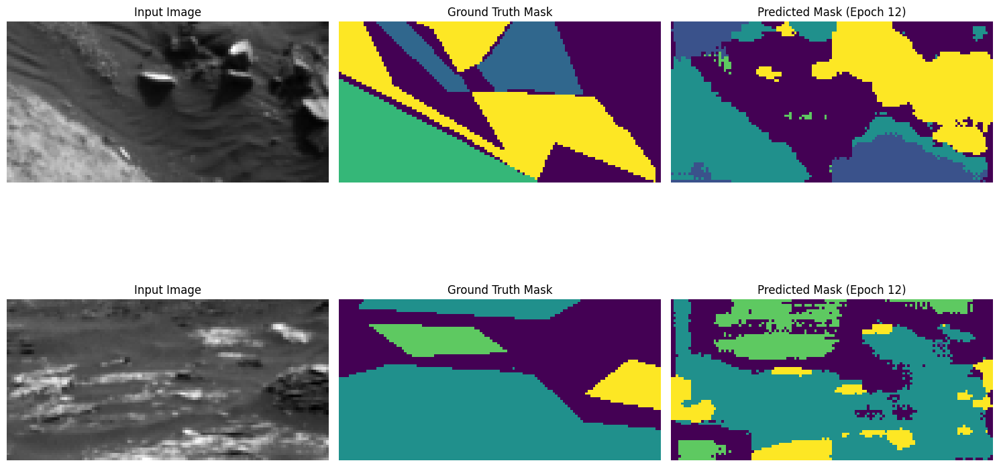

Epoch 12: Per-class IoUs: [None, 0.5107803657487952, 0.41373050266997774, 0.6419633982342279, 0.02487040391824281]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 242ms/step - accuracy: 0.5371 - loss: 0.0061 - mean_io_u: 0.3114 - mean_iou: 0.3114 - val_accuracy: 0.5378 - val_loss: 0.0060 - val_mean_io_u: 0.3183 - val_mean_iou: 0.3183 - learning_rate: 1.0000e-04
Epoch 13/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.5280 - loss: 0.0062 - mean_io_u: 0.3024 - mean_iou: 0.3024Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 13: val_loss did not improve from 0.00603
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


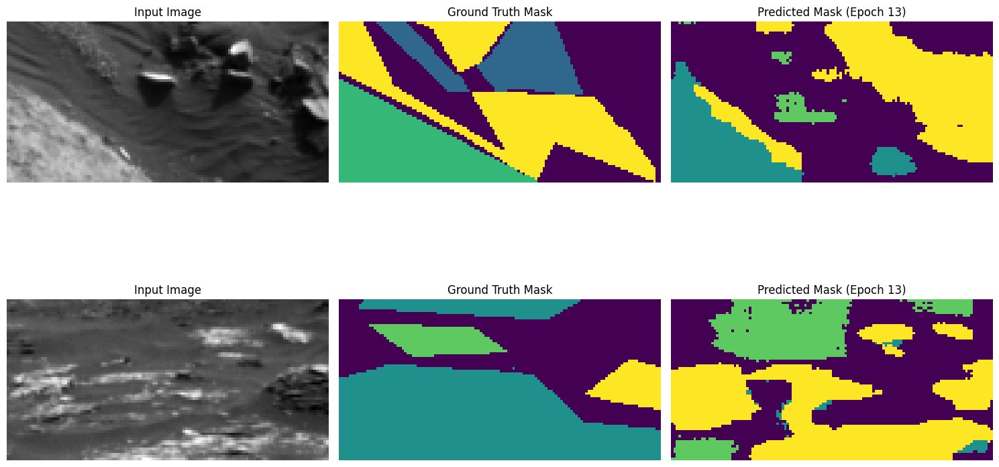

Epoch 13: Per-class IoUs: [None, 0.524470170457278, 0.2805584174650905, 0.6547713798948537, 0.010363194931264943]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 240ms/step - accuracy: 0.5281 - loss: 0.0062 - mean_io_u: 0.3024 - mean_iou: 0.3024 - val_accuracy: 0.5054 - val_loss: 0.0064 - val_mean_io_u: 0.2940 - val_mean_iou: 0.2940 - learning_rate: 1.0000e-04
Epoch 14/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.5692 - loss: 0.0057 - mean_io_u: 0.3318 - mean_iou: 0.3318Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 14: val_mean_iou improved to 0.3349, saving model.

Epoch 14: val_loss improved from 0.00603 to 0.00583, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


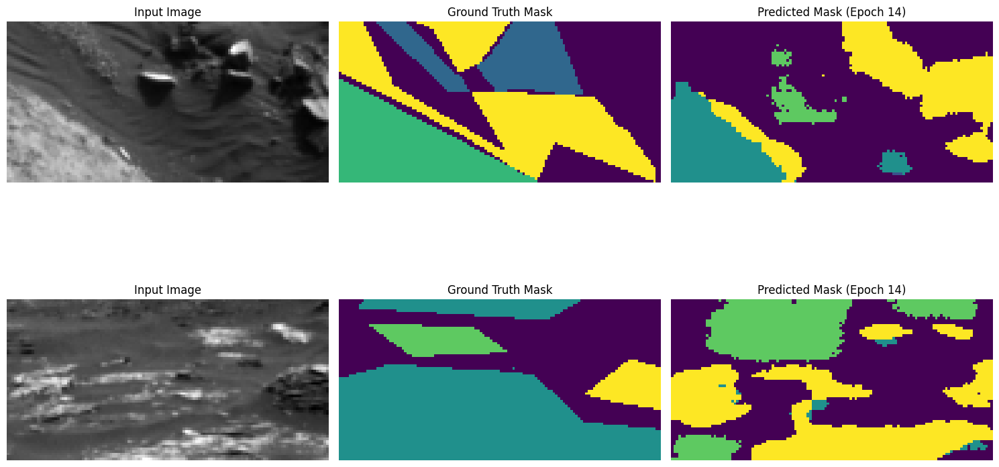

Epoch 14: Per-class IoUs: [None, 0.6184368290620413, 0.35903577165584105, 0.6812259389695422, 0.015662708369959564]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 242ms/step - accuracy: 0.5692 - loss: 0.0057 - mean_io_u: 0.3318 - mean_iou: 0.3318 - val_accuracy: 0.5757 - val_loss: 0.0058 - val_mean_io_u: 0.3349 - val_mean_iou: 0.3349 - learning_rate: 1.0000e-04
Epoch 15/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - accuracy: 0.5769 - loss: 0.0056 - mean_io_u: 0.3325 - mean_iou: 0.3325Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 15: val_mean_iou improved to 0.3724, saving model.

Epoch 15: val_loss improved from 0.00583 to 0.00530, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


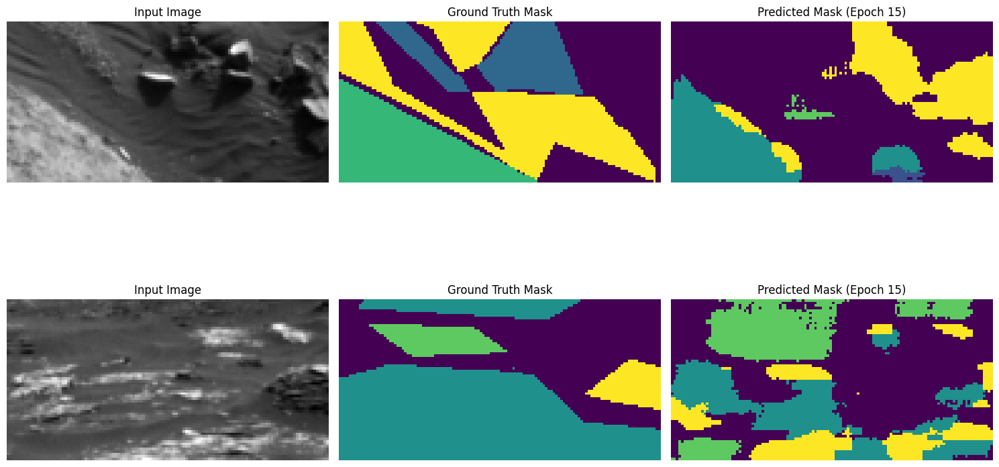

Epoch 15: Per-class IoUs: [None, 0.6798517910391545, 0.4637680875528645, 0.6920788998947668, 0.026317857685516532]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 242ms/step - accuracy: 0.5770 - loss: 0.0056 - mean_io_u: 0.3325 - mean_iou: 0.3325 - val_accuracy: 0.6221 - val_loss: 0.0053 - val_mean_io_u: 0.3724 - val_mean_iou: 0.3724 - learning_rate: 1.0000e-04
Epoch 16/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.6084 - loss: 0.0051 - mean_io_u: 0.3571 - mean_iou: 0.3571Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 16: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


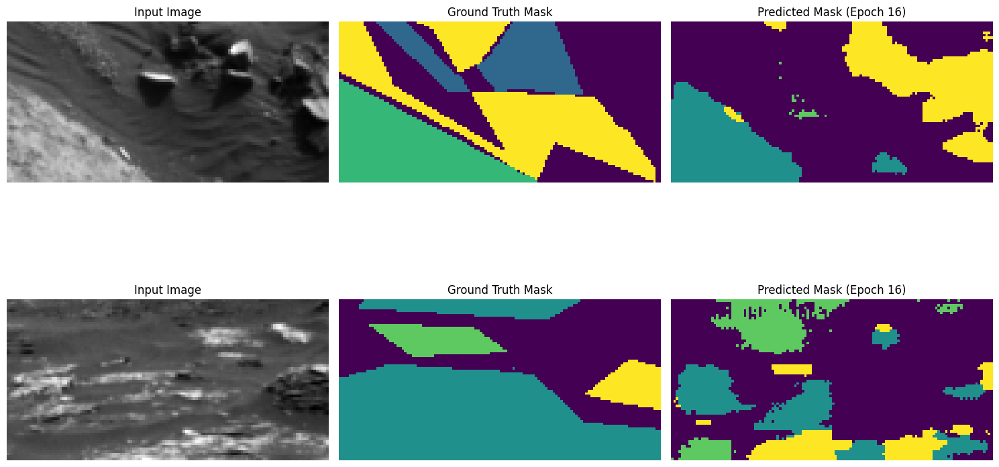

Epoch 16: Per-class IoUs: [None, 0.6671159227739616, 0.4465142067643429, 0.6766843100459096, 0.02209377424855612]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.6084 - loss: 0.0051 - mean_io_u: 0.3571 - mean_iou: 0.3571 - val_accuracy: 0.6162 - val_loss: 0.0055 - val_mean_io_u: 0.3625 - val_mean_iou: 0.3625 - learning_rate: 1.0000e-04
Epoch 17/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.6096 - loss: 0.0051 - mean_io_u: 0.3521 - mean_iou: 0.3521Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 17: val_mean_iou improved to 0.3807, saving model.

Epoch 17: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


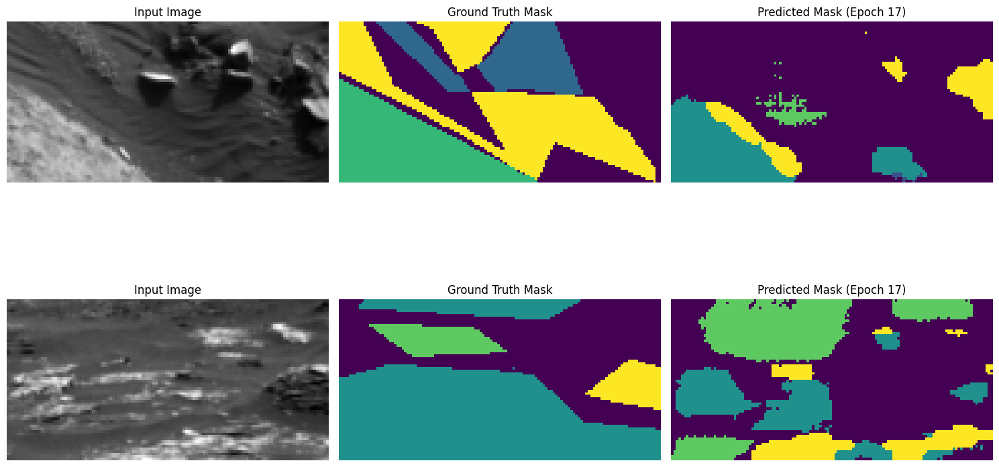

Epoch 17: Per-class IoUs: [None, 0.7003999112011187, 0.4768443051634538, 0.696328176375969, 0.029944728701491004]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.6097 - loss: 0.0051 - mean_io_u: 0.3521 - mean_iou: 0.3521 - val_accuracy: 0.6494 - val_loss: 0.0059 - val_mean_io_u: 0.3807 - val_mean_iou: 0.3807 - learning_rate: 1.0000e-04
Epoch 18/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.6376 - loss: 0.0047 - mean_io_u: 0.3729 - mean_iou: 0.3729Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 18: val_mean_iou improved to 0.4013, saving model.

Epoch 18: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


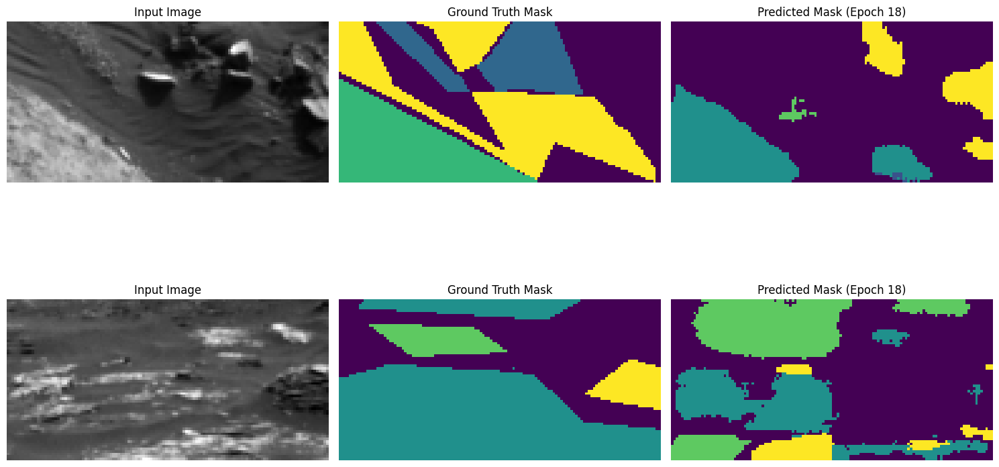

Epoch 18: Per-class IoUs: [None, 0.727695329100961, 0.5228472236572916, 0.7158920103253966, 0.03989611139167448]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 241ms/step - accuracy: 0.6376 - loss: 0.0047 - mean_io_u: 0.3729 - mean_iou: 0.3729 - val_accuracy: 0.6675 - val_loss: 0.0058 - val_mean_io_u: 0.4013 - val_mean_iou: 0.4013 - learning_rate: 1.0000e-04
Epoch 19/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - accuracy: 0.6532 - loss: 0.0045 - mean_io_u: 0.3853 - mean_iou: 0.3853Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 19: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


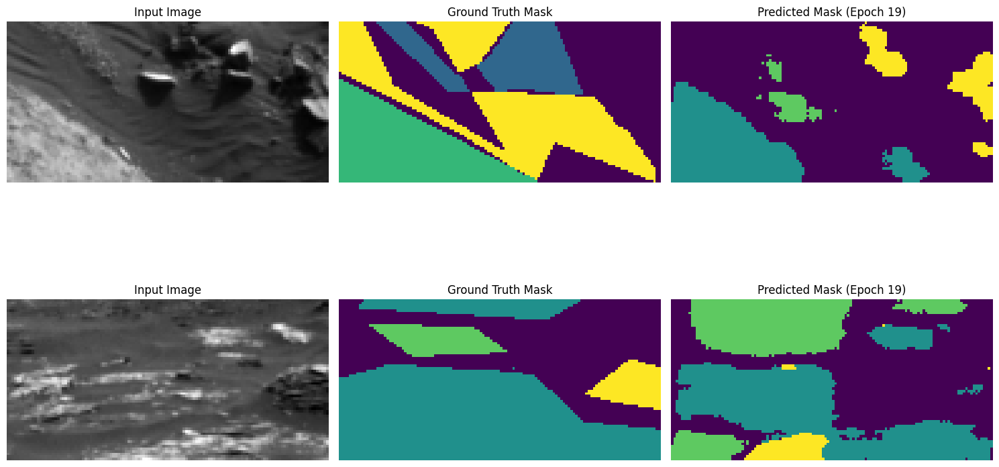

Epoch 19: Per-class IoUs: [None, 0.7022352751348088, 0.562677390488029, 0.69418947034258, 0.0423033359690552]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 239ms/step - accuracy: 0.6533 - loss: 0.0045 - mean_io_u: 0.3853 - mean_iou: 0.3853 - val_accuracy: 0.6572 - val_loss: 0.0061 - val_mean_io_u: 0.4003 - val_mean_iou: 0.4003 - learning_rate: 1.0000e-04
Epoch 20/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - accuracy: 0.6533 - loss: 0.0045 - mean_io_u: 0.3855 - mean_iou: 0.3855Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 20: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


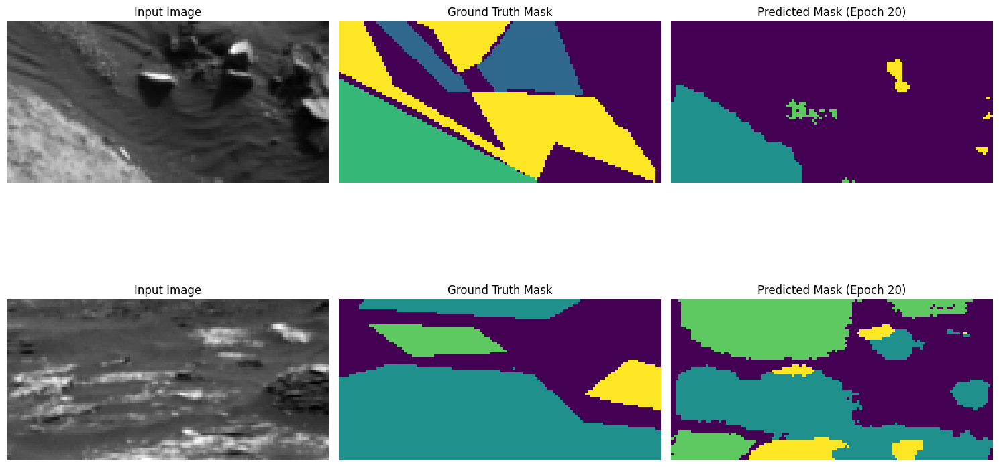

Epoch 20: Per-class IoUs: [None, 0.6816639766600358, 0.5420575721605925, 0.6912893993587008, 0.0419443668435966]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 239ms/step - accuracy: 0.6533 - loss: 0.0045 - mean_io_u: 0.3855 - mean_iou: 0.3855 - val_accuracy: 0.6544 - val_loss: 0.0058 - val_mean_io_u: 0.3914 - val_mean_iou: 0.3914 - learning_rate: 1.0000e-04
Epoch 21/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.6524 - loss: 0.0045 - mean_io_u: 0.3867 - mean_iou: 0.3867Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 21: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


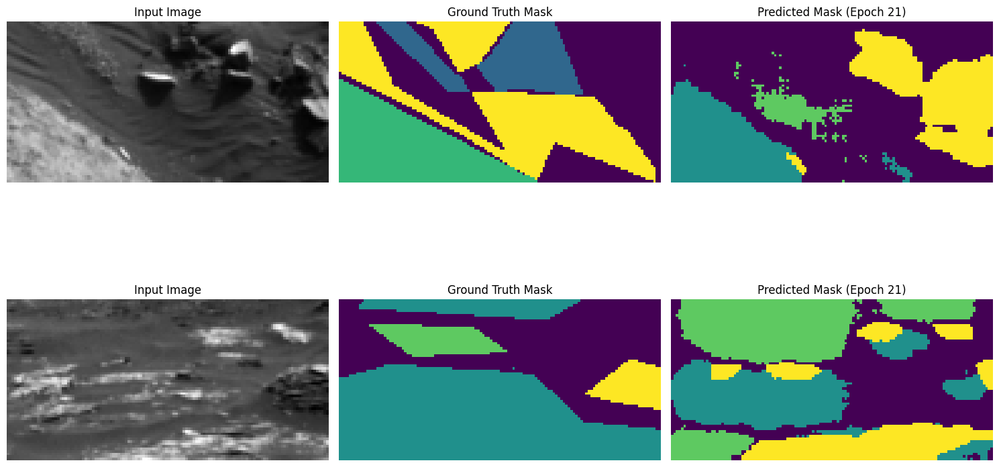

Epoch 21: Per-class IoUs: [None, 0.7238340351006491, 0.5310226681004335, 0.7133095283532008, 0.02518891687657431]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 239ms/step - accuracy: 0.6525 - loss: 0.0045 - mean_io_u: 0.3867 - mean_iou: 0.3867 - val_accuracy: 0.6427 - val_loss: 0.0060 - val_mean_io_u: 0.3987 - val_mean_iou: 0.3987 - learning_rate: 1.0000e-04
Epoch 22/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.6641 - loss: 0.0043 - mean_io_u: 0.3996 - mean_iou: 0.3996Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 22: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


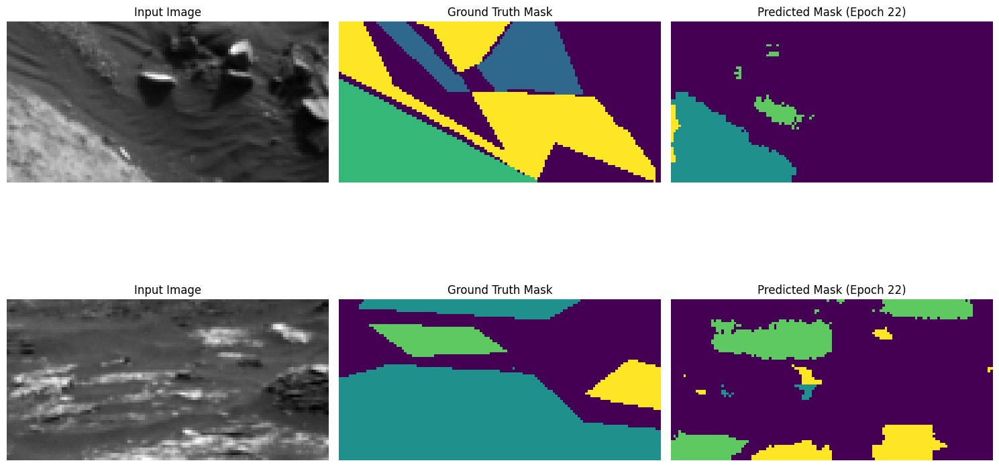

Epoch 22: Per-class IoUs: [None, 0.591799049124567, 0.2749482436771423, 0.66954218590938, 0.01483066651747417]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 240ms/step - accuracy: 0.6641 - loss: 0.0043 - mean_io_u: 0.3996 - mean_iou: 0.3996 - val_accuracy: 0.5922 - val_loss: 0.0086 - val_mean_io_u: 0.3102 - val_mean_iou: 0.3102 - learning_rate: 1.0000e-04
Epoch 23/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - accuracy: 0.5931 - loss: 0.0054 - mean_io_u: 0.3456 - mean_iou: 0.3456Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 23: val_mean_iou improved to 0.4302, saving model.

Epoch 23: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


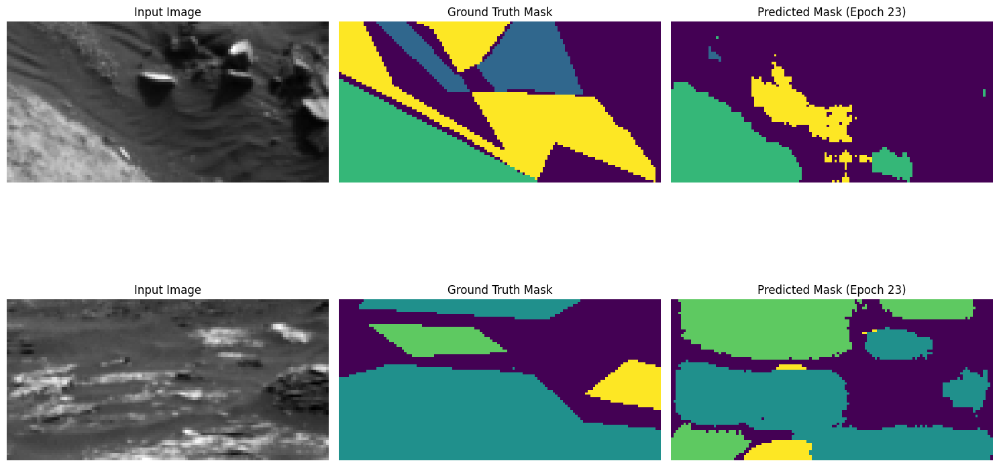

Epoch 23: Per-class IoUs: [None, 0.7398362725270196, 0.6246507959713615, 0.7227245334850609, 0.06374283942058598]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 240ms/step - accuracy: 0.5932 - loss: 0.0054 - mean_io_u: 0.3456 - mean_iou: 0.3456 - val_accuracy: 0.6957 - val_loss: 0.0079 - val_mean_io_u: 0.4302 - val_mean_iou: 0.4302 - learning_rate: 1.0000e-04
Epoch 24/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.6858 - loss: 0.0040 - mean_io_u: 0.4227 - mean_iou: 0.4227Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 24: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


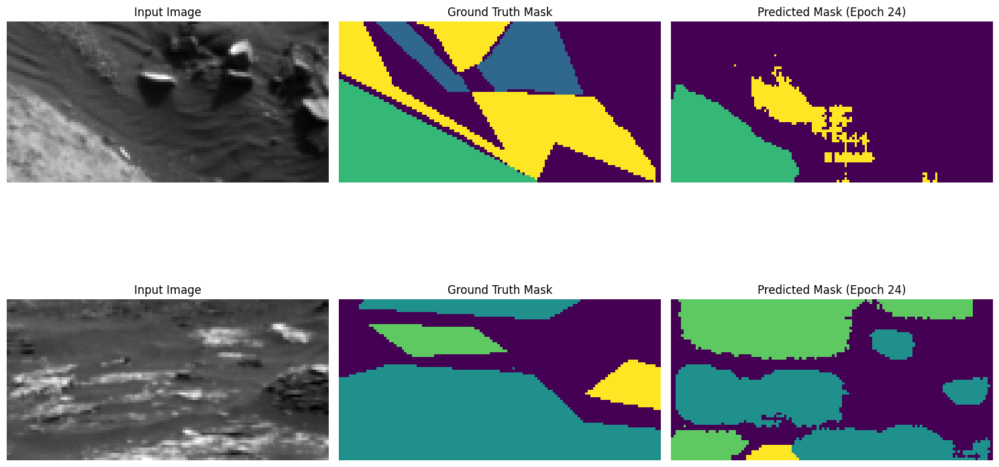

Epoch 24: Per-class IoUs: [None, 0.7461571866185198, 0.6106503250572347, 0.724773366943296, 0.051157720643512254]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 239ms/step - accuracy: 0.6858 - loss: 0.0040 - mean_io_u: 0.4226 - mean_iou: 0.4226 - val_accuracy: 0.7069 - val_loss: 0.0085 - val_mean_io_u: 0.4265 - val_mean_iou: 0.4265 - learning_rate: 1.0000e-04
Epoch 25/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - accuracy: 0.6965 - loss: 0.0038 - mean_io_u: 0.4378 - mean_iou: 0.4378Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 25: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


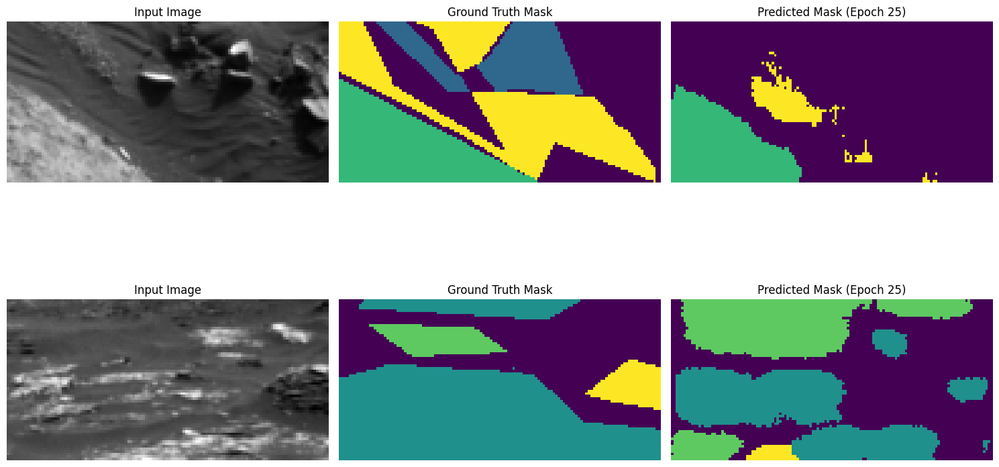

Epoch 25: Per-class IoUs: [None, 0.7419283260447774, 0.6104353426122208, 0.7058321099693047, 0.04972756741844265]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 239ms/step - accuracy: 0.6965 - loss: 0.0038 - mean_io_u: 0.4378 - mean_iou: 0.4378 - val_accuracy: 0.7103 - val_loss: 0.0094 - val_mean_io_u: 0.4216 - val_mean_iou: 0.4216 - learning_rate: 1.0000e-04
Epoch 26/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.7074 - loss: 0.0037 - mean_io_u: 0.4651 - mean_iou: 0.4651Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 26: val_mean_iou improved to 0.4389, saving model.

Epoch 26: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


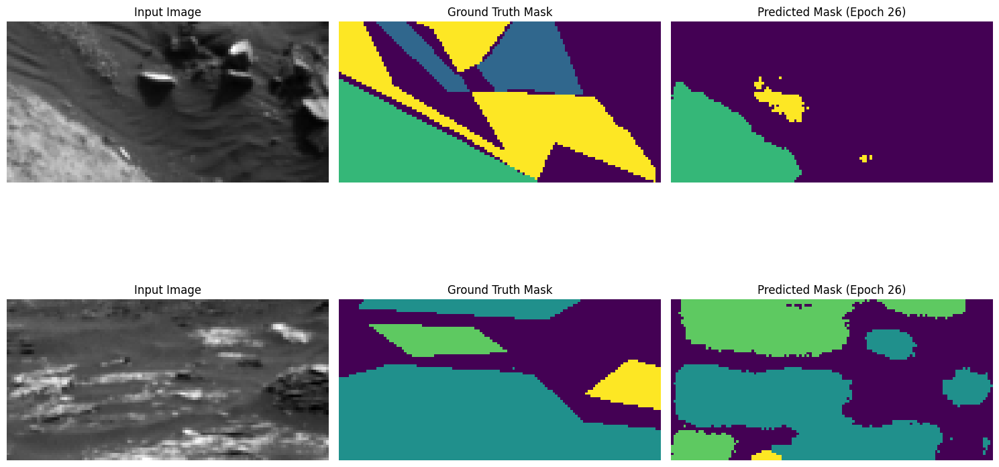

Epoch 26: Per-class IoUs: [None, 0.7559340675475279, 0.6393563174291064, 0.7197664322306156, 0.07959198868289777]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.7074 - loss: 0.0037 - mean_io_u: 0.4651 - mean_iou: 0.4651 - val_accuracy: 0.7217 - val_loss: 0.0101 - val_mean_io_u: 0.4389 - val_mean_iou: 0.4389 - learning_rate: 1.0000e-04
Epoch 27/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.7079 - loss: 0.0037 - mean_io_u: 0.4635 - mean_iou: 0.4635Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 27: val_mean_iou improved to 0.4557, saving model.

Epoch 27: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


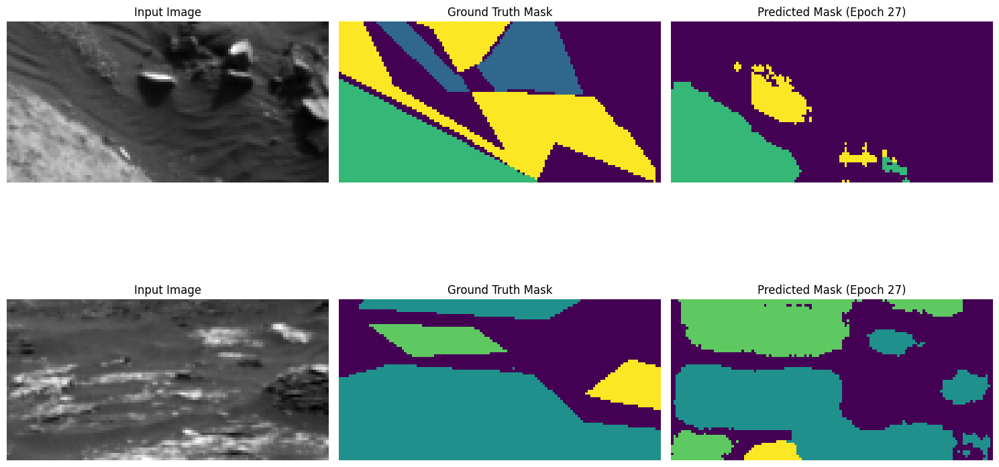

Epoch 27: Per-class IoUs: [None, 0.7723449527834869, 0.6488487729975488, 0.7348087532771623, 0.12239630229905757]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 241ms/step - accuracy: 0.7079 - loss: 0.0037 - mean_io_u: 0.4635 - mean_iou: 0.4635 - val_accuracy: 0.7236 - val_loss: 0.0088 - val_mean_io_u: 0.4557 - val_mean_iou: 0.4557 - learning_rate: 1.0000e-04
Epoch 28/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.7164 - loss: 0.0036 - mean_io_u: 0.4857 - mean_iou: 0.4857Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 28: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


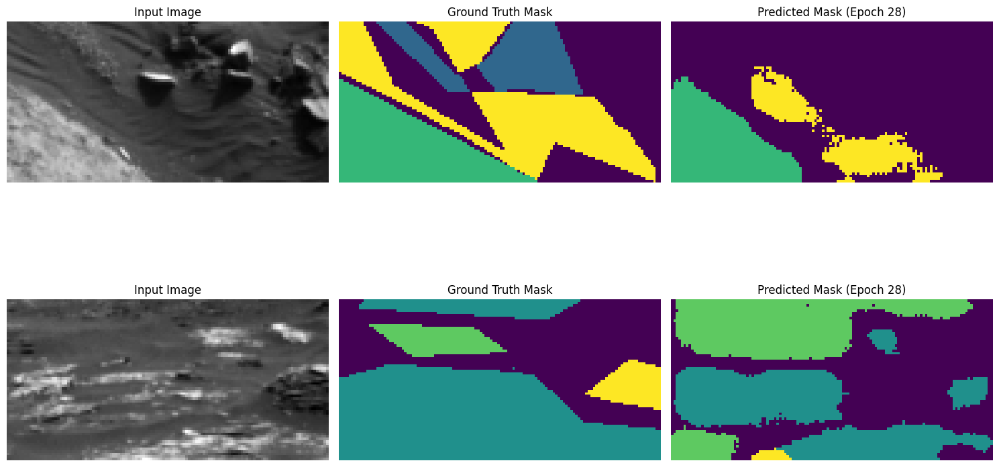

Epoch 28: Per-class IoUs: [None, 0.7619885619587212, 0.620183955348012, 0.7228347025982187, 0.04046709753231492]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 239ms/step - accuracy: 0.7165 - loss: 0.0036 - mean_io_u: 0.4857 - mean_iou: 0.4857 - val_accuracy: 0.7216 - val_loss: 0.0101 - val_mean_io_u: 0.4291 - val_mean_iou: 0.4291 - learning_rate: 1.0000e-04
Epoch 29/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.7281 - loss: 0.0034 - mean_io_u: 0.5144 - mean_iou: 0.5144Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 29: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


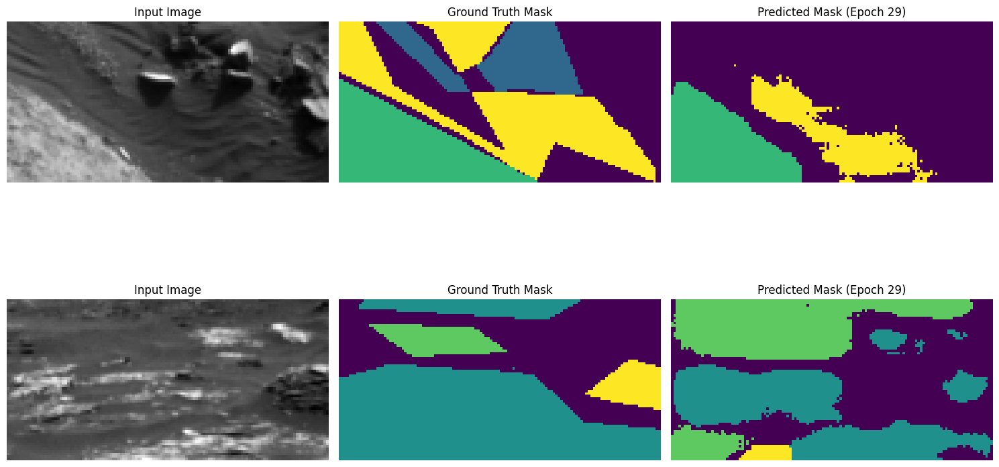

Epoch 29: Per-class IoUs: [None, 0.7748881696208756, 0.6201176383150442, 0.734387877061948, 0.04338296425062354]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 240ms/step - accuracy: 0.7281 - loss: 0.0034 - mean_io_u: 0.5144 - mean_iou: 0.5144 - val_accuracy: 0.7255 - val_loss: 0.0111 - val_mean_io_u: 0.4346 - val_mean_iou: 0.4346 - learning_rate: 1.0000e-04
Epoch 30/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - accuracy: 0.7201 - loss: 0.0036 - mean_io_u: 0.4849 - mean_iou: 0.4849Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 30: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


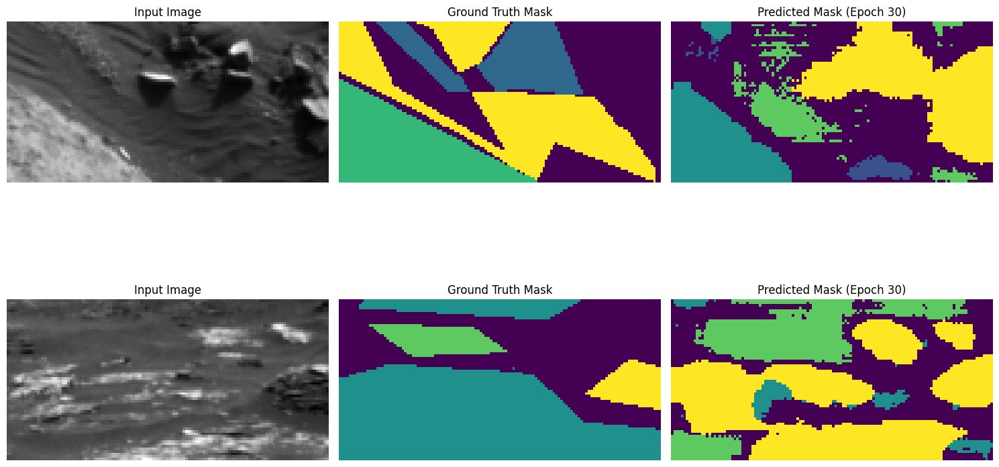

Epoch 30: Per-class IoUs: [None, 0.6793752060982181, 0.29853894810293696, 0.7084874513893837, 0.010596914026827331]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 239ms/step - accuracy: 0.7200 - loss: 0.0036 - mean_io_u: 0.4846 - mean_iou: 0.4846 - val_accuracy: 0.5594 - val_loss: 0.0061 - val_mean_io_u: 0.3394 - val_mean_iou: 0.3394 - learning_rate: 1.0000e-04
Epoch 31/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - accuracy: 0.6409 - loss: 0.0047 - mean_io_u: 0.3801 - mean_iou: 0.3801Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 31: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


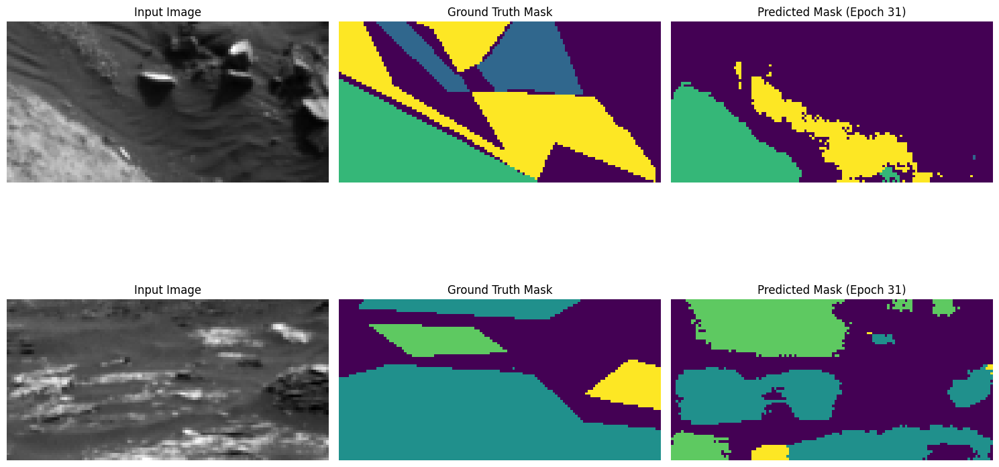

Epoch 31: Per-class IoUs: [None, 0.7675663331214823, 0.5661516565982433, 0.7221967598806617, 0.05756011120955669]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 239ms/step - accuracy: 0.6410 - loss: 0.0047 - mean_io_u: 0.3801 - mean_iou: 0.3801 - val_accuracy: 0.7145 - val_loss: 0.0074 - val_mean_io_u: 0.4227 - val_mean_iou: 0.4227 - learning_rate: 1.0000e-04
Epoch 32/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - accuracy: 0.7183 - loss: 0.0036 - mean_io_u: 0.4572 - mean_iou: 0.4572Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 32: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


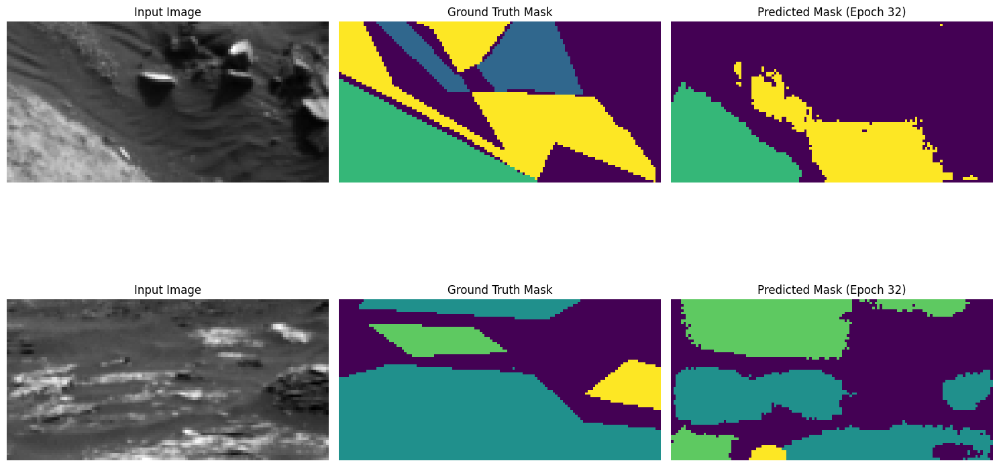

Epoch 32: Per-class IoUs: [None, 0.7774710501551285, 0.6022446274249879, 0.7298437529963501, 0.07256574896648782]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 239ms/step - accuracy: 0.7183 - loss: 0.0036 - mean_io_u: 0.4572 - mean_iou: 0.4572 - val_accuracy: 0.7276 - val_loss: 0.0095 - val_mean_io_u: 0.4364 - val_mean_iou: 0.4364 - learning_rate: 1.0000e-04
Epoch 33/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.7415 - loss: 0.0033 - mean_io_u: 0.5296 - mean_iou: 0.5296Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 33: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


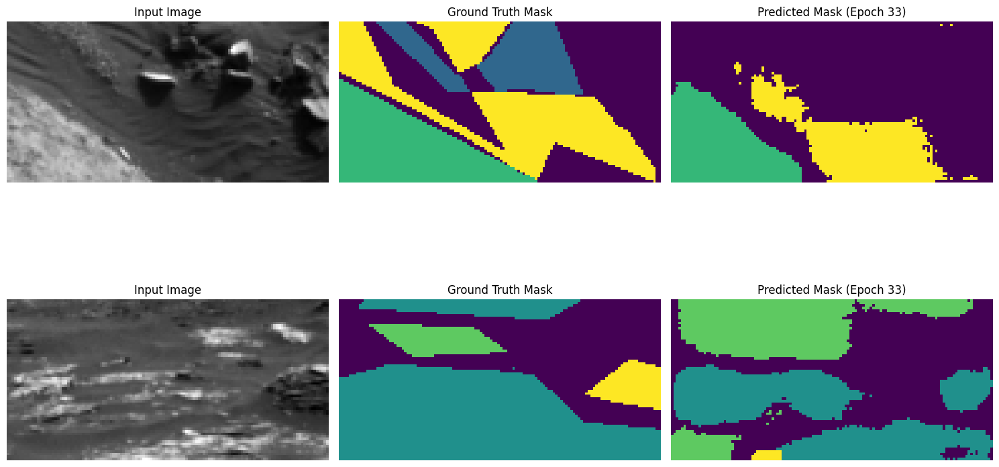

Epoch 33: Per-class IoUs: [None, 0.78528649883567, 0.6094639224285978, 0.739898191270443, 0.06057032590051458]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 240ms/step - accuracy: 0.7415 - loss: 0.0033 - mean_io_u: 0.5296 - mean_iou: 0.5296 - val_accuracy: 0.7326 - val_loss: 0.0106 - val_mean_io_u: 0.4390 - val_mean_iou: 0.4390 - learning_rate: 1.0000e-04
Epoch 34/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.7501 - loss: 0.0031 - mean_io_u: 0.5598 - mean_iou: 0.5598Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 34: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


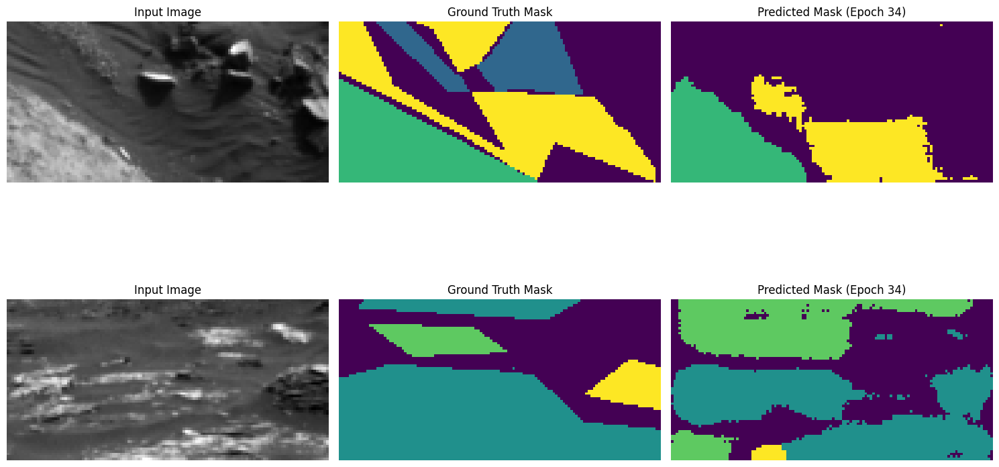

Epoch 34: Per-class IoUs: [None, 0.7919008798584224, 0.6299727940311375, 0.7489071804979552, 0.05533248457545784]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 240ms/step - accuracy: 0.7502 - loss: 0.0031 - mean_io_u: 0.5597 - mean_iou: 0.5597 - val_accuracy: 0.7374 - val_loss: 0.0106 - val_mean_io_u: 0.4452 - val_mean_iou: 0.4452 - learning_rate: 1.0000e-04
Epoch 35/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.7569 - loss: 0.0030 - mean_io_u: 0.5793 - mean_iou: 0.5793Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 35: val_loss did not improve from 0.00530

Epoch 35: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


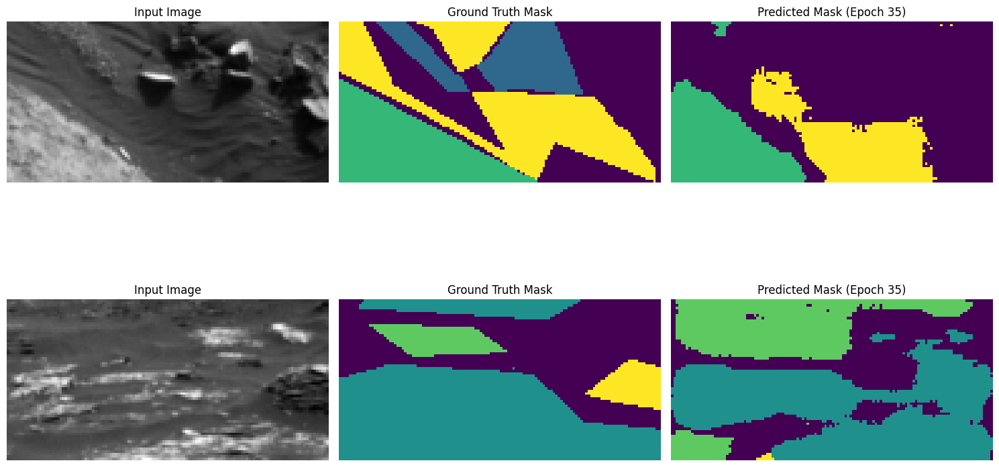

Epoch 35: Per-class IoUs: [None, 0.8044994801394821, 0.6557065135991357, 0.7663690426032724, 0.04762471722824146]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 240ms/step - accuracy: 0.7569 - loss: 0.0030 - mean_io_u: 0.5792 - mean_iou: 0.5792 - val_accuracy: 0.7436 - val_loss: 0.0123 - val_mean_io_u: 0.4548 - val_mean_iou: 0.4548 - learning_rate: 1.0000e-04
Epoch 36/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.7687 - loss: 0.0029 - mean_io_u: 0.5879 - mean_iou: 0.5879Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 36: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


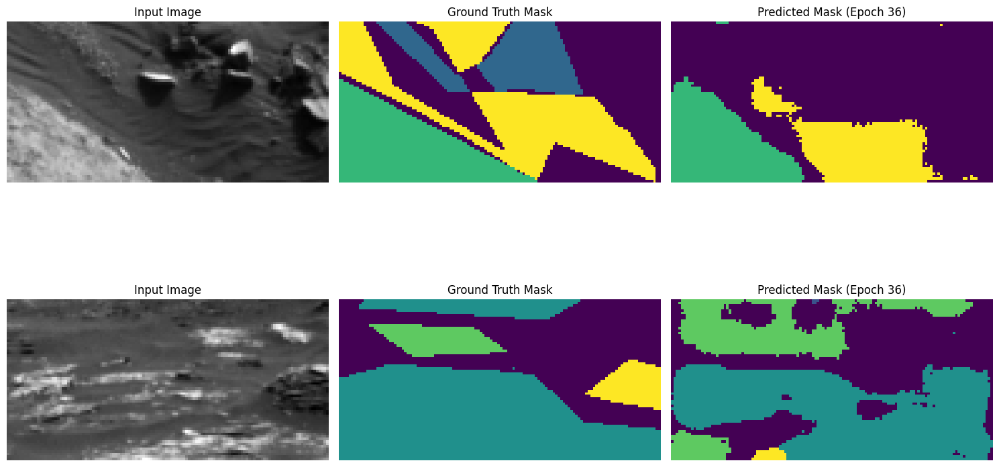

Epoch 36: Per-class IoUs: [None, 0.7970223507240046, 0.5786109798242153, 0.7594307910659596, 0.030876109610189117]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 240ms/step - accuracy: 0.7687 - loss: 0.0029 - mean_io_u: 0.5879 - mean_iou: 0.5879 - val_accuracy: 0.7376 - val_loss: 0.0133 - val_mean_io_u: 0.4332 - val_mean_iou: 0.4332 - learning_rate: 5.0000e-05
Epoch 37/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.7729 - loss: 0.0028 - mean_io_u: 0.6196 - mean_iou: 0.6196Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 37: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


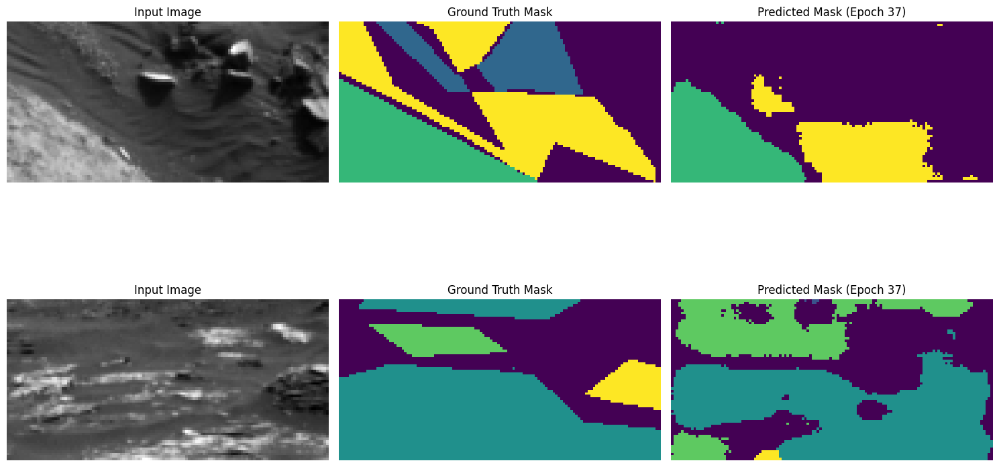

Epoch 37: Per-class IoUs: [None, 0.8033352025839519, 0.5792500555173403, 0.766831493072815, 0.035204933830142615]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 241ms/step - accuracy: 0.7729 - loss: 0.0028 - mean_io_u: 0.6195 - mean_iou: 0.6195 - val_accuracy: 0.7405 - val_loss: 0.0134 - val_mean_io_u: 0.4369 - val_mean_iou: 0.4369 - learning_rate: 5.0000e-05
Epoch 38/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.7790 - loss: 0.0028 - mean_io_u: 0.6330 - mean_iou: 0.6330Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 38: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


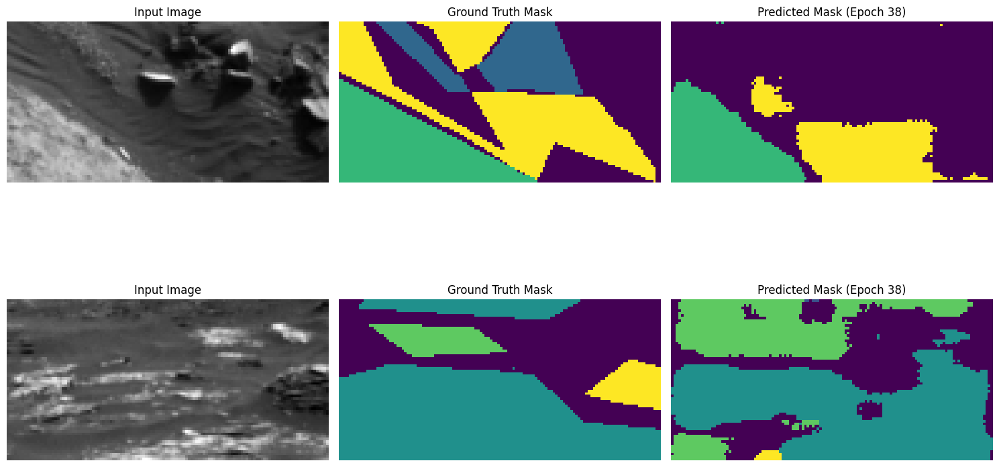

Epoch 38: Per-class IoUs: [None, 0.806231819558111, 0.5885605604350097, 0.7706298698697756, 0.03732403461190753]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 240ms/step - accuracy: 0.7790 - loss: 0.0028 - mean_io_u: 0.6330 - mean_iou: 0.6330 - val_accuracy: 0.7428 - val_loss: 0.0137 - val_mean_io_u: 0.4405 - val_mean_iou: 0.4405 - learning_rate: 5.0000e-05
Epoch 39/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.7851 - loss: 0.0027 - mean_io_u: 0.6482 - mean_iou: 0.6482Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 39: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


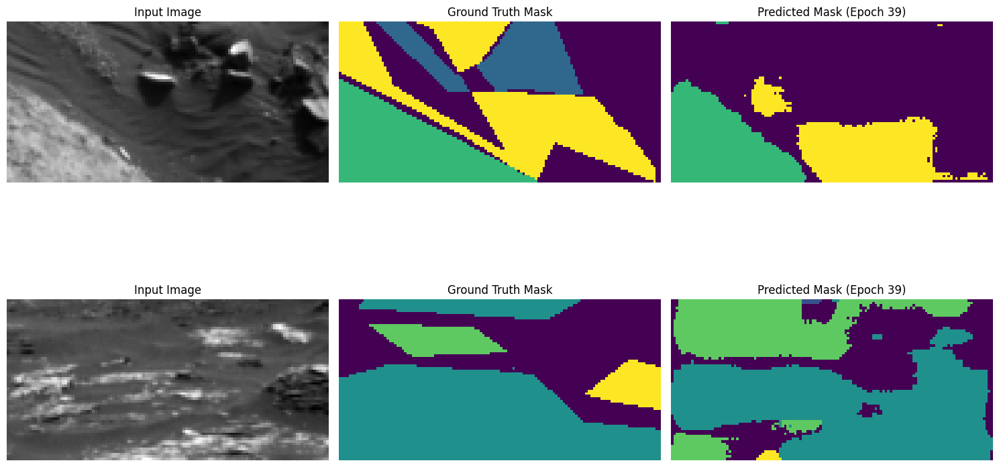

Epoch 39: Per-class IoUs: [None, 0.8117016233513481, 0.6078567371607048, 0.7759620335076259, 0.024696302229341875]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 240ms/step - accuracy: 0.7852 - loss: 0.0027 - mean_io_u: 0.6482 - mean_iou: 0.6482 - val_accuracy: 0.7471 - val_loss: 0.0146 - val_mean_io_u: 0.4440 - val_mean_iou: 0.4440 - learning_rate: 5.0000e-05
Epoch 40/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.7914 - loss: 0.0026 - mean_io_u: 0.6578 - mean_iou: 0.6578Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 40: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


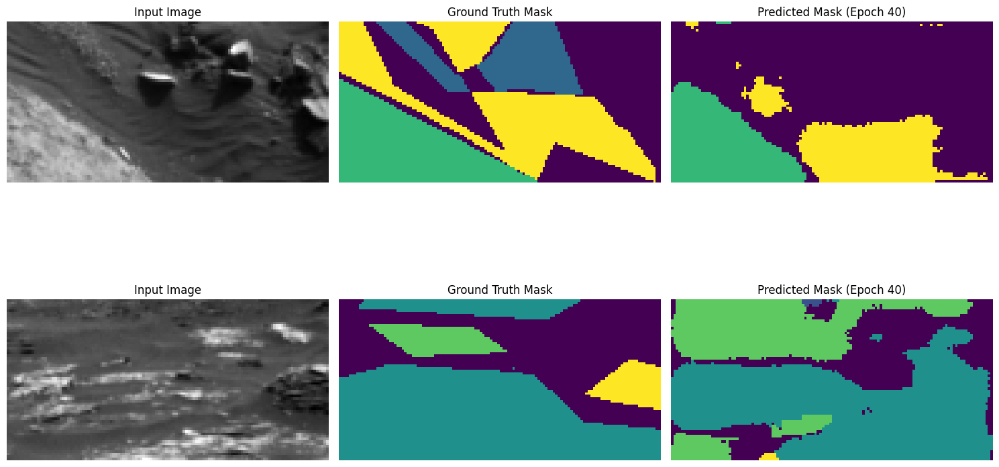

Epoch 40: Per-class IoUs: [None, 0.8147342092145553, 0.62400642724056, 0.7789656834257042, 0.019170632222977567]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 240ms/step - accuracy: 0.7914 - loss: 0.0026 - mean_io_u: 0.6578 - mean_iou: 0.6578 - val_accuracy: 0.7494 - val_loss: 0.0152 - val_mean_io_u: 0.4474 - val_mean_iou: 0.4474 - learning_rate: 5.0000e-05
Epoch 41/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.7972 - loss: 0.0025 - mean_io_u: 0.6664 - mean_iou: 0.6664Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 41: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


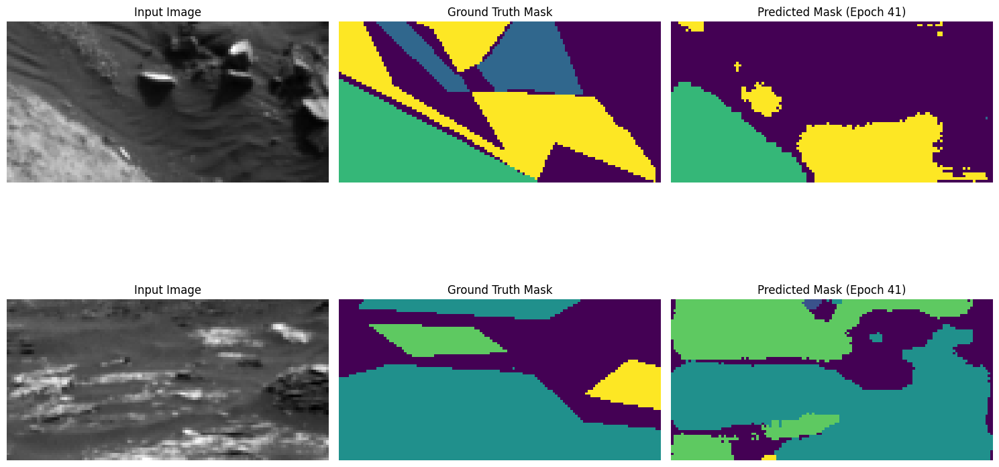

Epoch 41: Per-class IoUs: [None, 0.8165245853914529, 0.6335201702860994, 0.7810773545882953, 0.016070933776669436]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.7972 - loss: 0.0025 - mean_io_u: 0.6663 - mean_iou: 0.6663 - val_accuracy: 0.7503 - val_loss: 0.0156 - val_mean_io_u: 0.4494 - val_mean_iou: 0.4494 - learning_rate: 5.0000e-05
Epoch 42/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.8028 - loss: 0.0025 - mean_io_u: 0.6731 - mean_iou: 0.6731Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 42: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


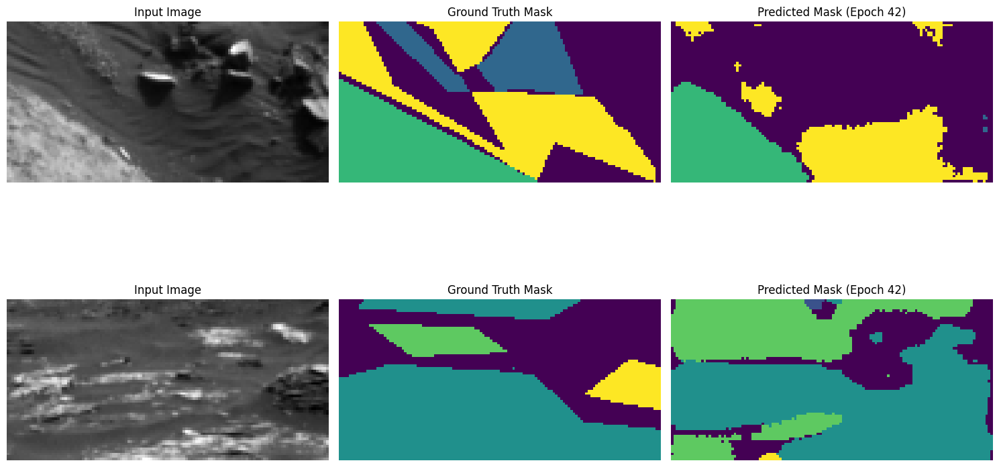

Epoch 42: Per-class IoUs: [None, 0.8178656787458735, 0.6385366865372938, 0.7850938740960458, 0.012428431783270494]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.8028 - loss: 0.0025 - mean_io_u: 0.6731 - mean_iou: 0.6731 - val_accuracy: 0.7500 - val_loss: 0.0164 - val_mean_io_u: 0.4508 - val_mean_iou: 0.4508 - learning_rate: 5.0000e-05
Epoch 43/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.8084 - loss: 0.0024 - mean_io_u: 0.6781 - mean_iou: 0.6781Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 43: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


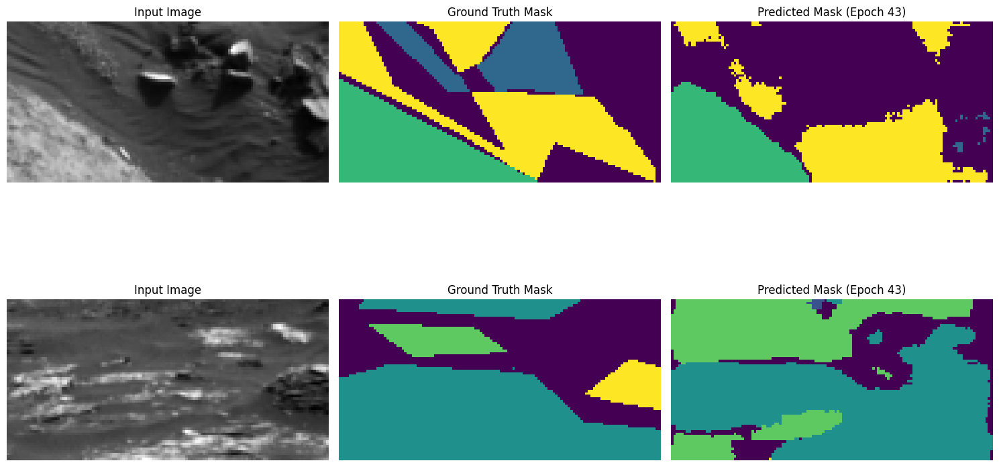

Epoch 43: Per-class IoUs: [None, 0.8194554184647177, 0.6434556291603519, 0.7900932768964942, 0.011047345767575323]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 240ms/step - accuracy: 0.8084 - loss: 0.0024 - mean_io_u: 0.6780 - mean_iou: 0.6780 - val_accuracy: 0.7501 - val_loss: 0.0169 - val_mean_io_u: 0.4528 - val_mean_iou: 0.4528 - learning_rate: 5.0000e-05
Epoch 44/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.8137 - loss: 0.0023 - mean_io_u: 0.6753 - mean_iou: 0.6753Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 44: val_mean_iou improved to 0.4586, saving model.

Epoch 44: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


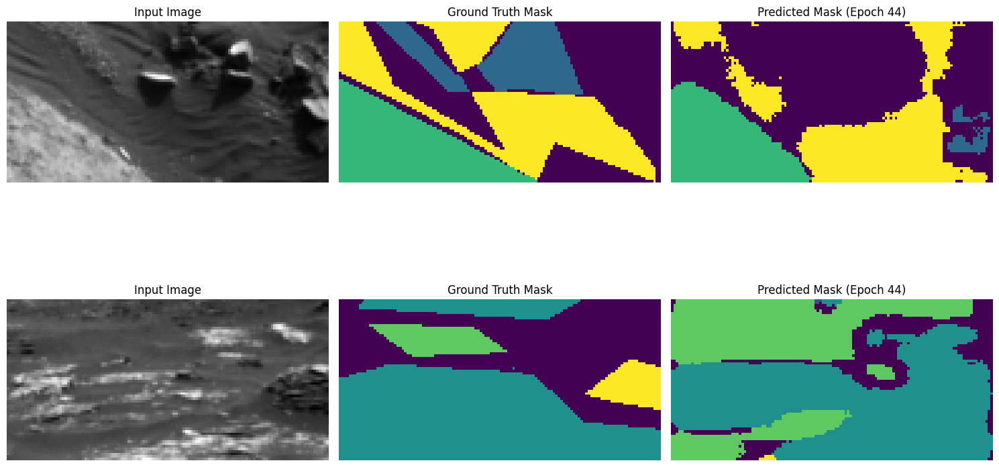

Epoch 44: Per-class IoUs: [None, 0.8266832646512824, 0.6559039285801629, 0.7977083905883348, 0.012734584450402145]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 241ms/step - accuracy: 0.8137 - loss: 0.0023 - mean_io_u: 0.6753 - mean_iou: 0.6753 - val_accuracy: 0.7523 - val_loss: 0.0164 - val_mean_io_u: 0.4586 - val_mean_iou: 0.4586 - learning_rate: 5.0000e-05
Epoch 45/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.8168 - loss: 0.0023 - mean_io_u: 0.6542 - mean_iou: 0.6542Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 45: val_mean_iou improved to 0.4586, saving model.

Epoch 45: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


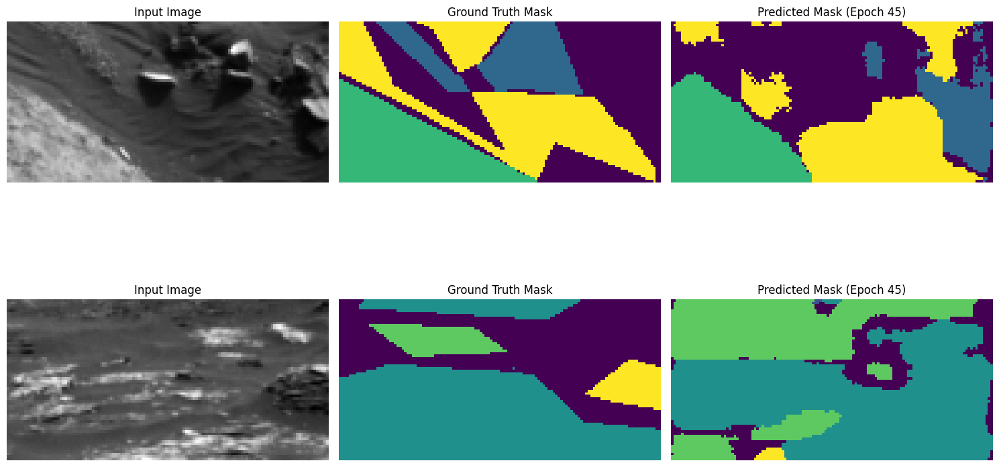

Epoch 45: Per-class IoUs: [None, 0.8264619297498208, 0.6537339053968105, 0.7941772840732986, 0.01872506716600179]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.8168 - loss: 0.0023 - mean_io_u: 0.6541 - mean_iou: 0.6541 - val_accuracy: 0.7407 - val_loss: 0.0136 - val_mean_io_u: 0.4586 - val_mean_iou: 0.4586 - learning_rate: 5.0000e-05
Epoch 46/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.8180 - loss: 0.0023 - mean_io_u: 0.6432 - mean_iou: 0.6432Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 46: val_mean_iou improved to 0.4649, saving model.

Epoch 46: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


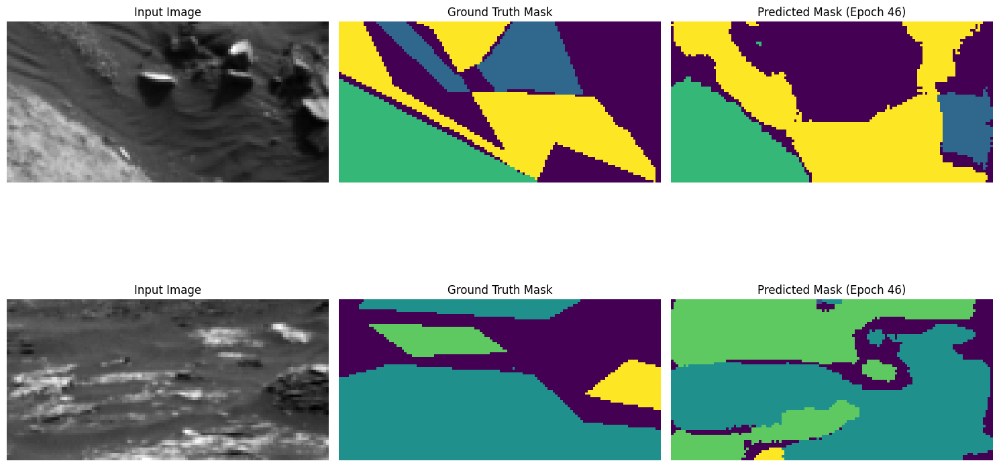

Epoch 46: Per-class IoUs: [None, 0.8247478250880348, 0.6543877177810881, 0.7977560095955779, 0.04737412019491066]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 243ms/step - accuracy: 0.8181 - loss: 0.0023 - mean_io_u: 0.6432 - mean_iou: 0.6432 - val_accuracy: 0.7469 - val_loss: 0.0135 - val_mean_io_u: 0.4649 - val_mean_iou: 0.4649 - learning_rate: 5.0000e-05
Epoch 47/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.8282 - loss: 0.0022 - mean_io_u: 0.6740 - mean_iou: 0.6740Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 47: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


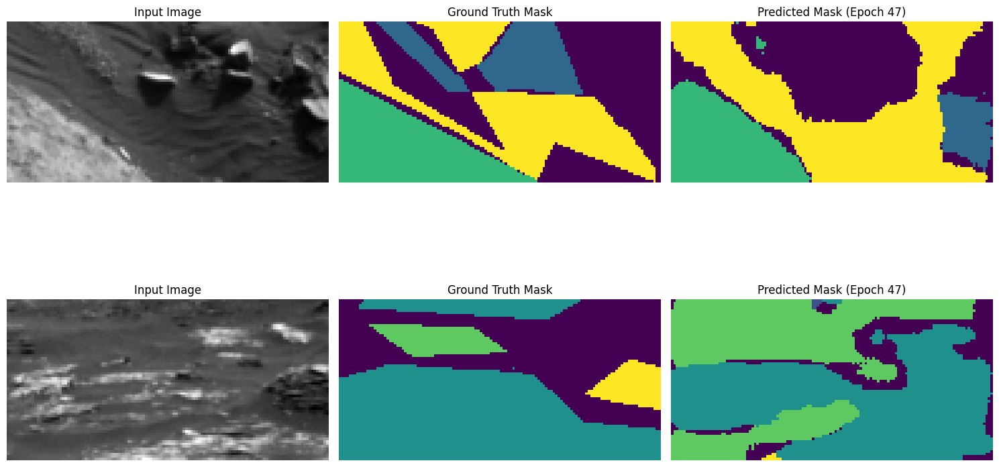

Epoch 47: Per-class IoUs: [None, 0.8242761167096971, 0.6621188673453727, 0.7949068681783171, 0.03156384505021521]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.8282 - loss: 0.0022 - mean_io_u: 0.6740 - mean_iou: 0.6740 - val_accuracy: 0.7485 - val_loss: 0.0159 - val_mean_io_u: 0.4626 - val_mean_iou: 0.4626 - learning_rate: 5.0000e-05
Epoch 48/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.8340 - loss: 0.0021 - mean_io_u: 0.6941 - mean_iou: 0.6941Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 48: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


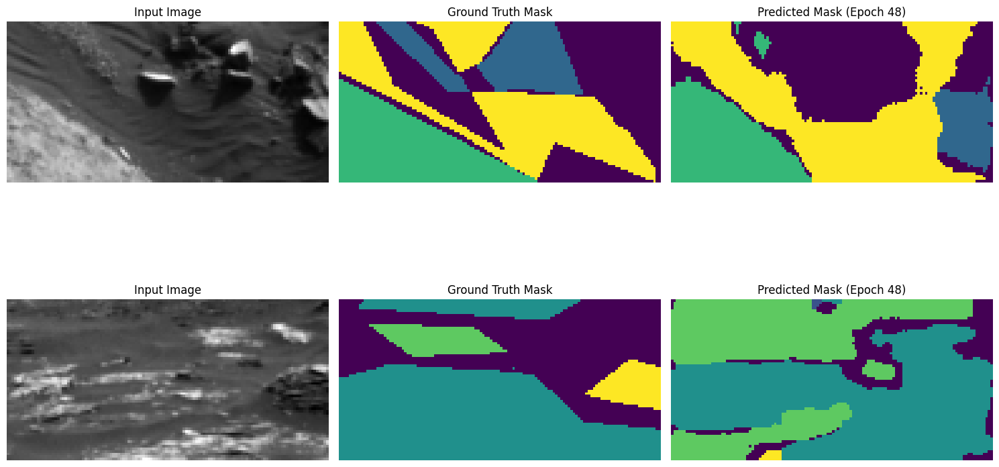

Epoch 48: Per-class IoUs: [None, 0.8183052599138965, 0.6503445214336724, 0.7908603160440489, 0.027816561056814522]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 240ms/step - accuracy: 0.8340 - loss: 0.0021 - mean_io_u: 0.6941 - mean_iou: 0.6941 - val_accuracy: 0.7450 - val_loss: 0.0159 - val_mean_io_u: 0.4575 - val_mean_iou: 0.4575 - learning_rate: 5.0000e-05
Epoch 49/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.8381 - loss: 0.0020 - mean_io_u: 0.6943 - mean_iou: 0.6943Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 49: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


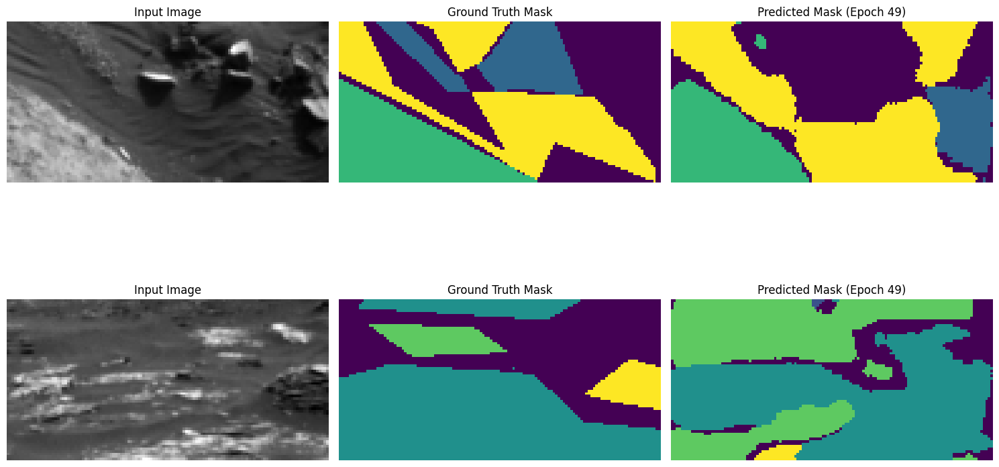

Epoch 49: Per-class IoUs: [None, 0.8117648083981529, 0.6242076831057198, 0.7935461634569816, 0.0460068485584889]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 241ms/step - accuracy: 0.8381 - loss: 0.0020 - mean_io_u: 0.6942 - mean_iou: 0.6942 - val_accuracy: 0.7411 - val_loss: 0.0132 - val_mean_io_u: 0.4551 - val_mean_iou: 0.4551 - learning_rate: 5.0000e-05
Epoch 50/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.8415 - loss: 0.0020 - mean_io_u: 0.6768 - mean_iou: 0.6768Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 50: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


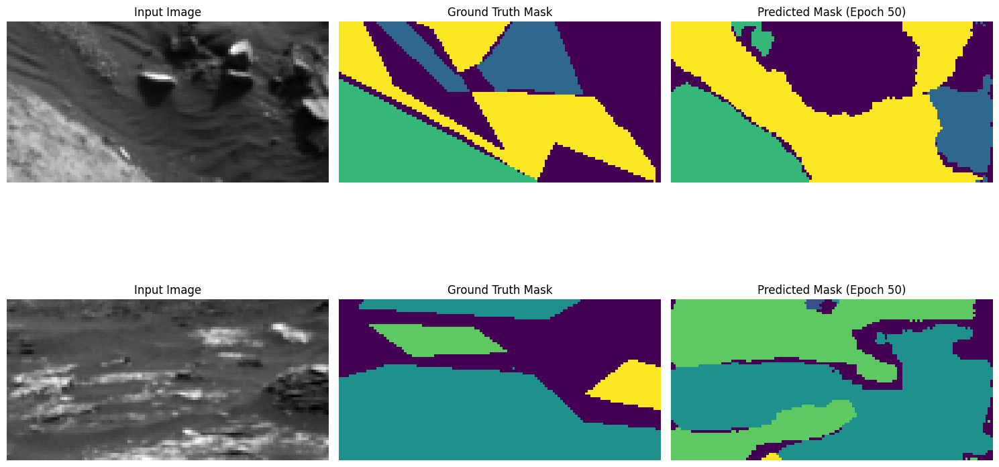

Epoch 50: Per-class IoUs: [None, 0.8172516396006921, 0.6399932400576102, 0.7982302893576632, 0.02424600827912478]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 239ms/step - accuracy: 0.8415 - loss: 0.0020 - mean_io_u: 0.6768 - mean_iou: 0.6768 - val_accuracy: 0.7418 - val_loss: 0.0161 - val_mean_io_u: 0.4559 - val_mean_iou: 0.4559 - learning_rate: 5.0000e-05
Epoch 51/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.8471 - loss: 0.0019 - mean_io_u: 0.6991 - mean_iou: 0.6991Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 51: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


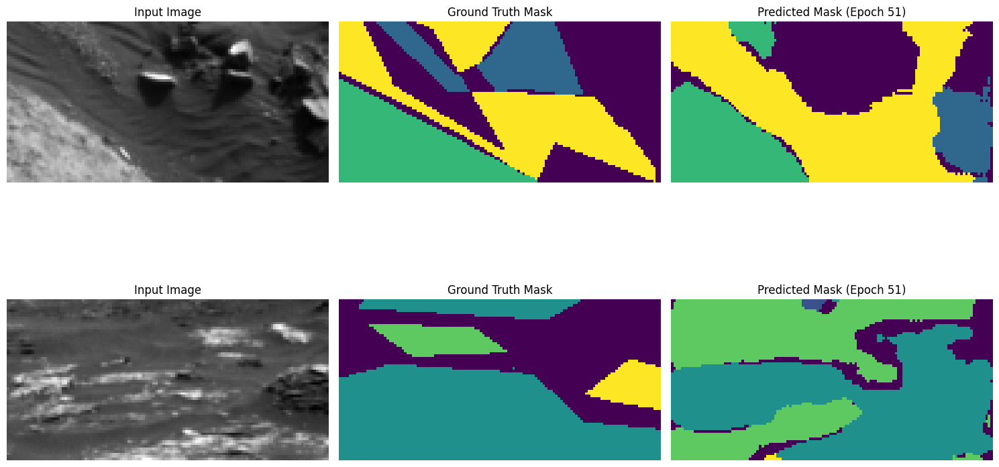

Epoch 51: Per-class IoUs: [None, 0.8145807792643138, 0.6490405176394803, 0.7857557636428226, 0.018883878241262683]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.8471 - loss: 0.0019 - mean_io_u: 0.6991 - mean_iou: 0.6991 - val_accuracy: 0.7405 - val_loss: 0.0173 - val_mean_io_u: 0.4537 - val_mean_iou: 0.4537 - learning_rate: 5.0000e-05
Epoch 52/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.8496 - loss: 0.0019 - mean_io_u: 0.7066 - mean_iou: 0.7066Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 52: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


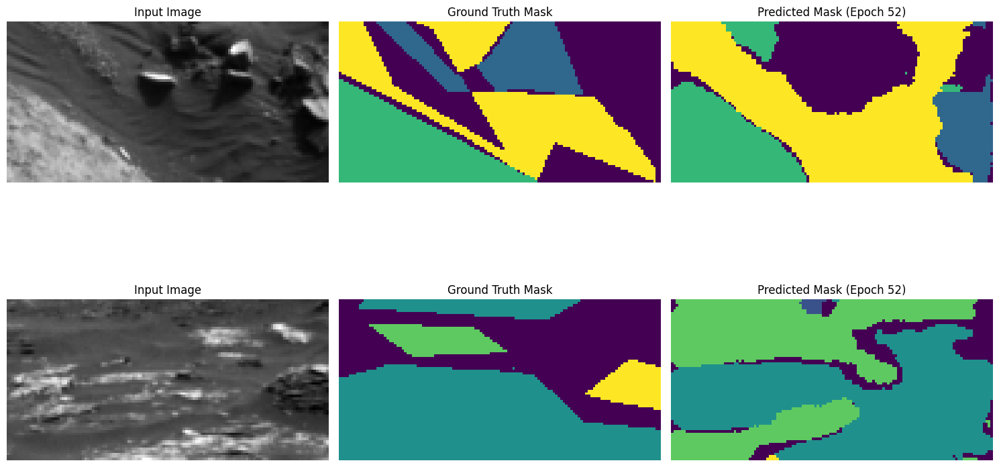

Epoch 52: Per-class IoUs: [None, 0.8139615846644715, 0.67666803614591, 0.7710380223671819, 0.021472814865794908]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.8496 - loss: 0.0019 - mean_io_u: 0.7066 - mean_iou: 0.7066 - val_accuracy: 0.7399 - val_loss: 0.0170 - val_mean_io_u: 0.4566 - val_mean_iou: 0.4566 - learning_rate: 5.0000e-05
Epoch 53/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.8507 - loss: 0.0019 - mean_io_u: 0.7033 - mean_iou: 0.7033Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 53: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


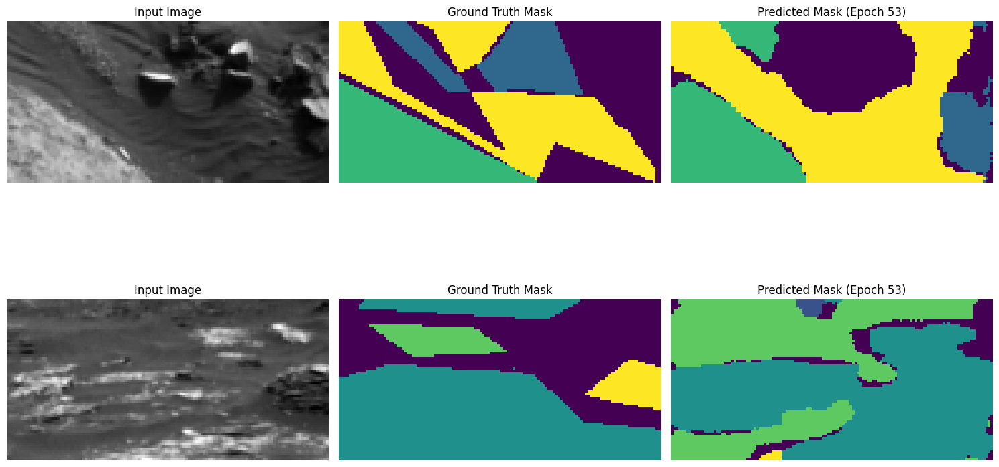

Epoch 53: Per-class IoUs: [None, 0.8146491552216132, 0.6967529957479707, 0.7671806224038261, 0.012385726924211147]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 240ms/step - accuracy: 0.8508 - loss: 0.0019 - mean_io_u: 0.7032 - mean_iou: 0.7032 - val_accuracy: 0.7402 - val_loss: 0.0178 - val_mean_io_u: 0.4582 - val_mean_iou: 0.4582 - learning_rate: 5.0000e-05
Epoch 54/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.8522 - loss: 0.0019 - mean_io_u: 0.7093 - mean_iou: 0.7093Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 54: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


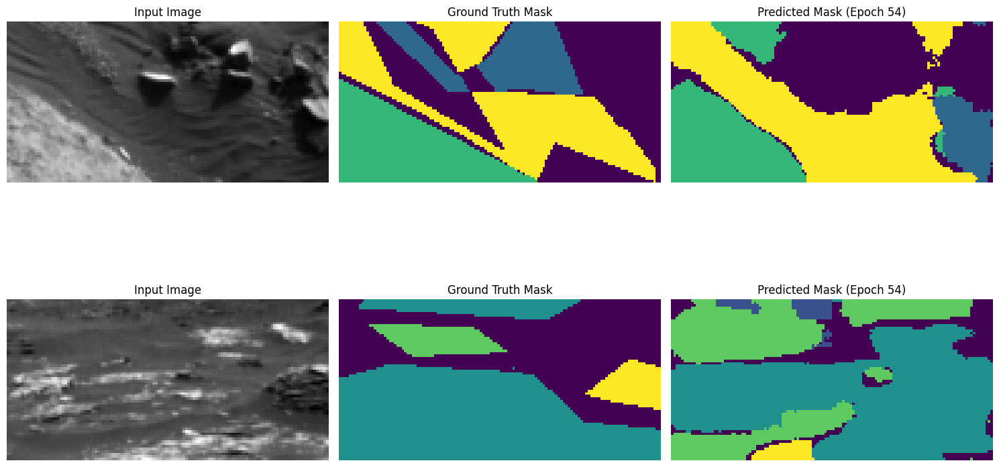

Epoch 54: Per-class IoUs: [None, 0.8078931838016153, 0.6999682331724604, 0.7418438755217007, 0.038792297625724434]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 240ms/step - accuracy: 0.8522 - loss: 0.0019 - mean_io_u: 0.7093 - mean_iou: 0.7093 - val_accuracy: 0.7382 - val_loss: 0.0151 - val_mean_io_u: 0.4577 - val_mean_iou: 0.4577 - learning_rate: 5.0000e-05
Epoch 55/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.8509 - loss: 0.0019 - mean_io_u: 0.6953 - mean_iou: 0.6953Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 55: val_loss did not improve from 0.00530

Epoch 55: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-05.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


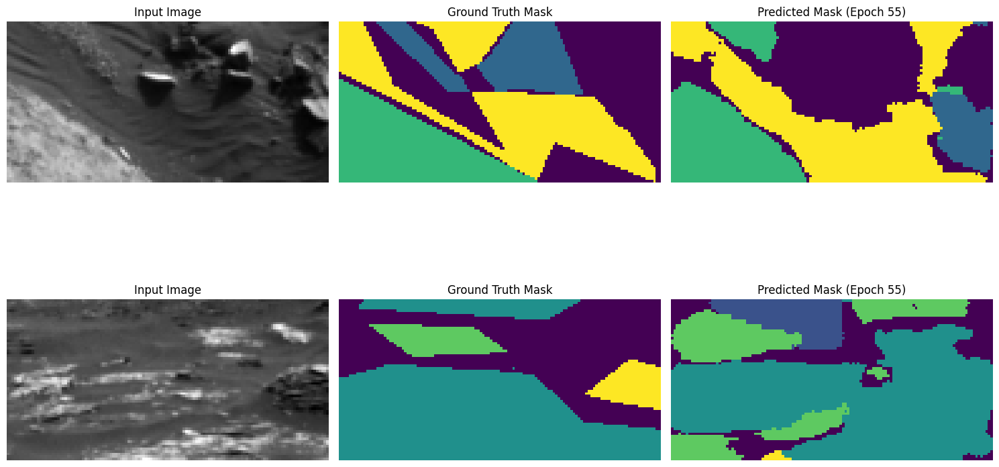

Epoch 55: Per-class IoUs: [None, 0.803705672076176, 0.6887394574880328, 0.6797616694230019, 0.031172686788718457]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 240ms/step - accuracy: 0.8509 - loss: 0.0019 - mean_io_u: 0.6953 - mean_iou: 0.6953 - val_accuracy: 0.7332 - val_loss: 0.0160 - val_mean_io_u: 0.4407 - val_mean_iou: 0.4407 - learning_rate: 5.0000e-05
Epoch 56/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.8543 - loss: 0.0018 - mean_io_u: 0.7048 - mean_iou: 0.7048Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 56: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


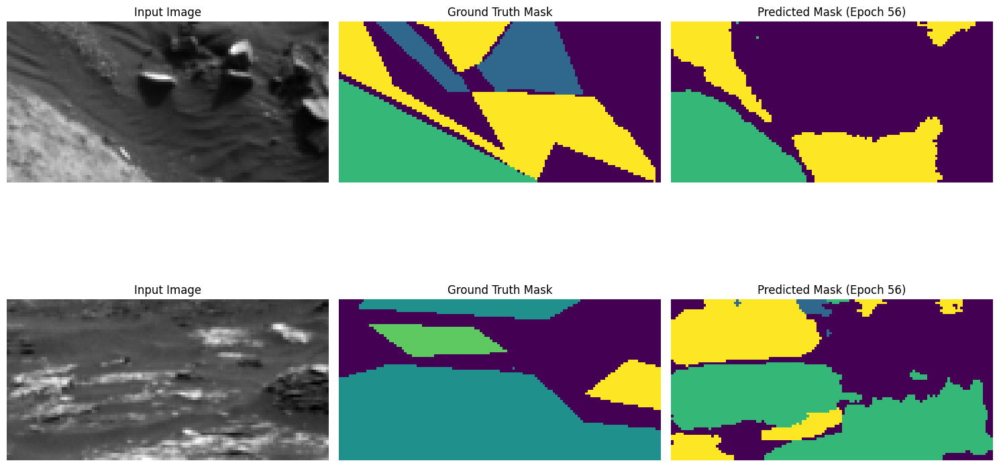

Epoch 56: Per-class IoUs: [None, 0.7878232274320472, 0.5080902283170271, 0.7715823275702381, 0.020344520344520344]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 242ms/step - accuracy: 0.8543 - loss: 0.0018 - mean_io_u: 0.7048 - mean_iou: 0.7048 - val_accuracy: 0.7234 - val_loss: 0.0204 - val_mean_io_u: 0.4176 - val_mean_iou: 0.4176 - learning_rate: 2.5000e-05
Epoch 57/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.8647 - loss: 0.0017 - mean_io_u: 0.7195 - mean_iou: 0.7195Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 57: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


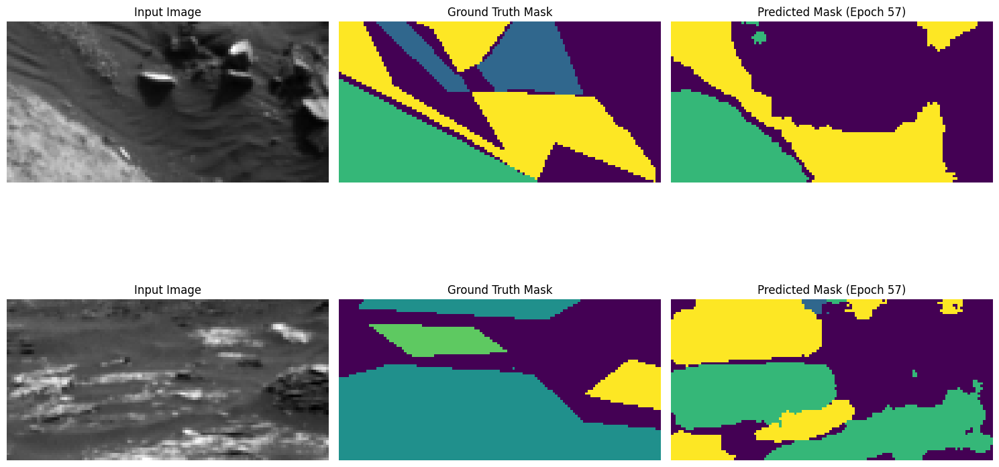

Epoch 57: Per-class IoUs: [None, 0.7845990103460245, 0.4998211431190404, 0.7867177733809079, 0.017109685304002444]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.8647 - loss: 0.0017 - mean_io_u: 0.7195 - mean_iou: 0.7195 - val_accuracy: 0.7213 - val_loss: 0.0211 - val_mean_io_u: 0.4176 - val_mean_iou: 0.4176 - learning_rate: 2.5000e-05
Epoch 58/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.8717 - loss: 0.0016 - mean_io_u: 0.7303 - mean_iou: 0.7303Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 58: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


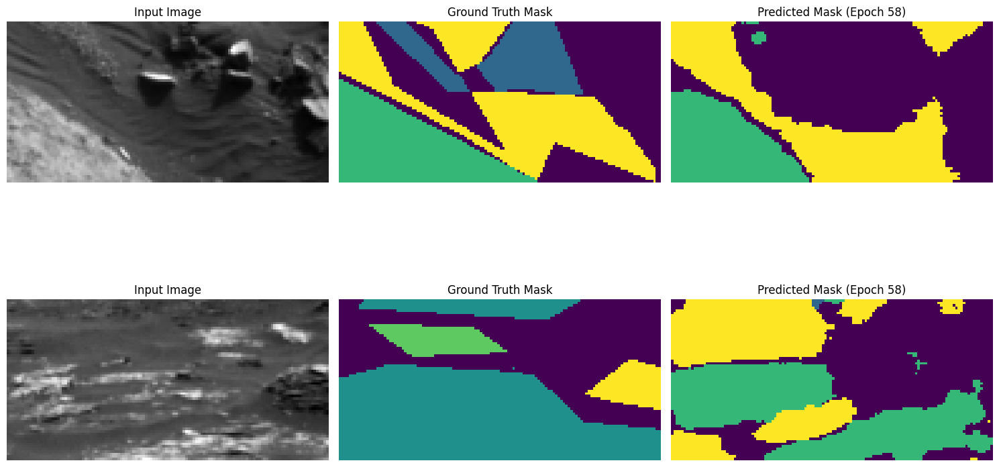

Epoch 58: Per-class IoUs: [None, 0.7828617336984145, 0.4990475977303504, 0.789556493955726, 0.017368582846603135]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 240ms/step - accuracy: 0.8717 - loss: 0.0016 - mean_io_u: 0.7303 - mean_iou: 0.7303 - val_accuracy: 0.7204 - val_loss: 0.0213 - val_mean_io_u: 0.4178 - val_mean_iou: 0.4178 - learning_rate: 2.5000e-05
Epoch 59/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.8767 - loss: 0.0015 - mean_io_u: 0.7347 - mean_iou: 0.7347Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 59: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


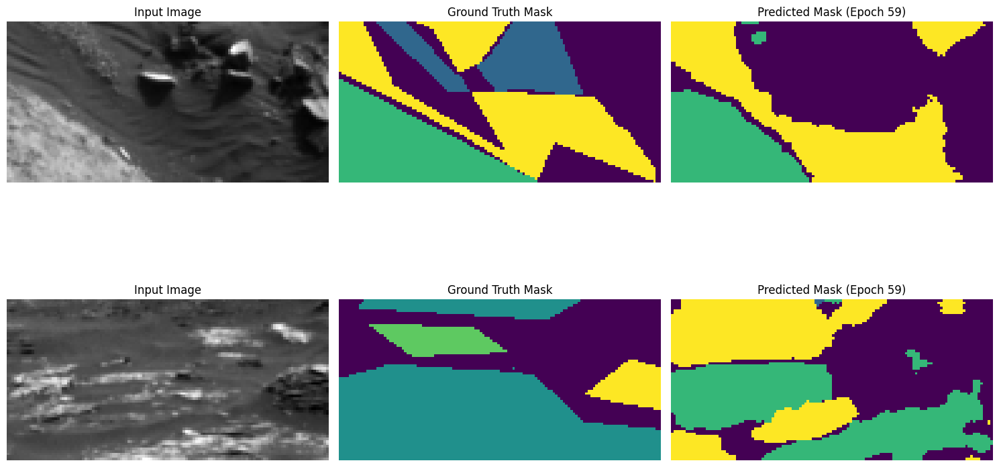

Epoch 59: Per-class IoUs: [None, 0.7825680230858285, 0.4944277739556418, 0.7925671621813605, 0.01703125]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 240ms/step - accuracy: 0.8767 - loss: 0.0015 - mean_io_u: 0.7346 - mean_iou: 0.7346 - val_accuracy: 0.7192 - val_loss: 0.0217 - val_mean_io_u: 0.4173 - val_mean_iou: 0.4173 - learning_rate: 2.5000e-05
Epoch 60/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.8812 - loss: 0.0015 - mean_io_u: 0.7385 - mean_iou: 0.7385Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 60: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


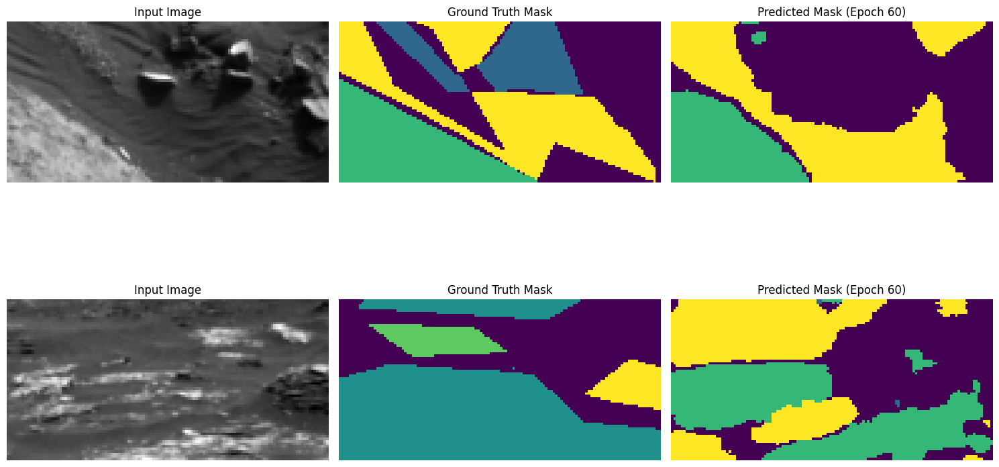

Epoch 60: Per-class IoUs: [None, 0.7851553727525278, 0.488661177352427, 0.795935641808239, 0.01694915254237288]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.8812 - loss: 0.0015 - mean_io_u: 0.7385 - mean_iou: 0.7385 - val_accuracy: 0.7189 - val_loss: 0.0219 - val_mean_io_u: 0.4173 - val_mean_iou: 0.4173 - learning_rate: 2.5000e-05
Epoch 61/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.8851 - loss: 0.0014 - mean_io_u: 0.7416 - mean_iou: 0.7416Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 61: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


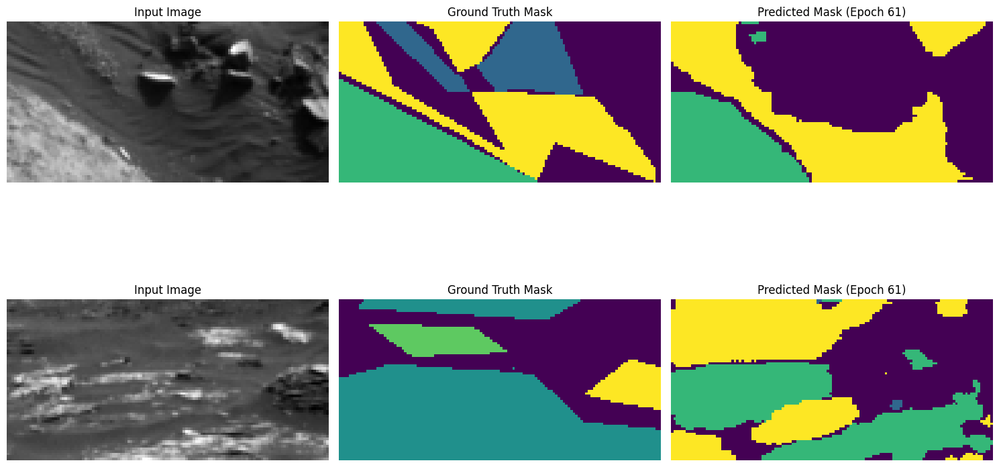

Epoch 61: Per-class IoUs: [None, 0.7857136782080698, 0.4813146254950456, 0.7990618898878995, 0.01584786053882726]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.8851 - loss: 0.0014 - mean_io_u: 0.7416 - mean_iou: 0.7416 - val_accuracy: 0.7176 - val_loss: 0.0222 - val_mean_io_u: 0.4164 - val_mean_iou: 0.4164 - learning_rate: 2.5000e-05
Epoch 62/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.8887 - loss: 0.0014 - mean_io_u: 0.7443 - mean_iou: 0.7443Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 62: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


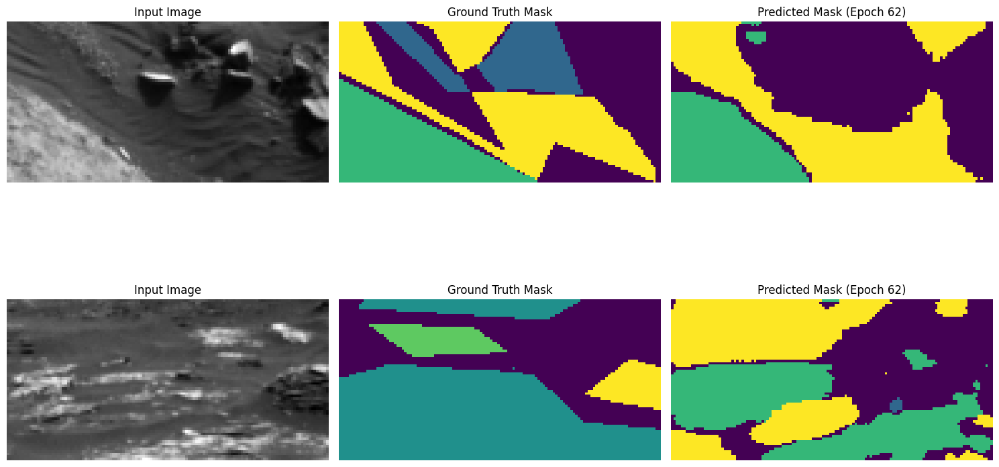

Epoch 62: Per-class IoUs: [None, 0.7845725461162742, 0.4748134485630566, 0.8010508720223556, 0.014209591474245116]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.8887 - loss: 0.0014 - mean_io_u: 0.7442 - mean_iou: 0.7442 - val_accuracy: 0.7158 - val_loss: 0.0226 - val_mean_io_u: 0.4149 - val_mean_iou: 0.4149 - learning_rate: 2.5000e-05
Epoch 63/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.8921 - loss: 0.0014 - mean_io_u: 0.7465 - mean_iou: 0.7465Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 63: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


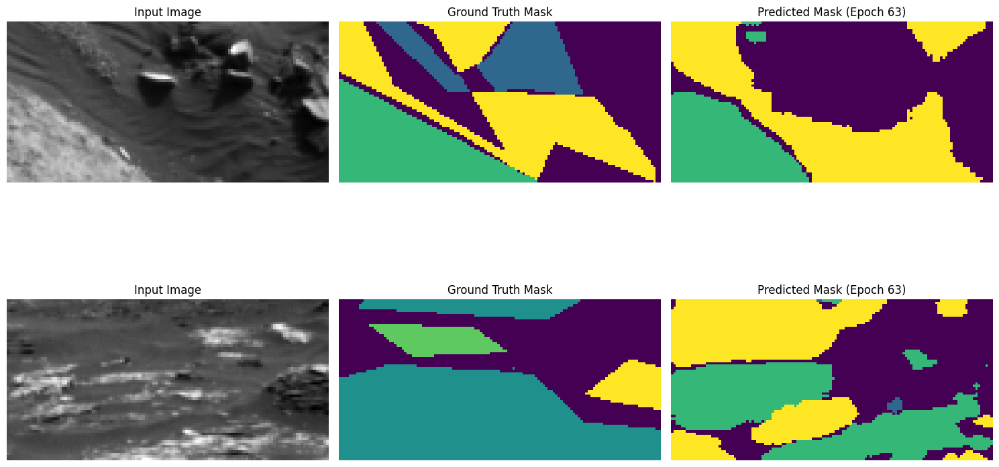

Epoch 63: Per-class IoUs: [None, 0.7810920187461823, 0.46989981969343386, 0.7995949244378279, 0.013736263736263736]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.8921 - loss: 0.0014 - mean_io_u: 0.7465 - mean_iou: 0.7465 - val_accuracy: 0.7133 - val_loss: 0.0229 - val_mean_io_u: 0.4129 - val_mean_iou: 0.4129 - learning_rate: 2.5000e-05
Epoch 64/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.8956 - loss: 0.0013 - mean_io_u: 0.7487 - mean_iou: 0.7487Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 64: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


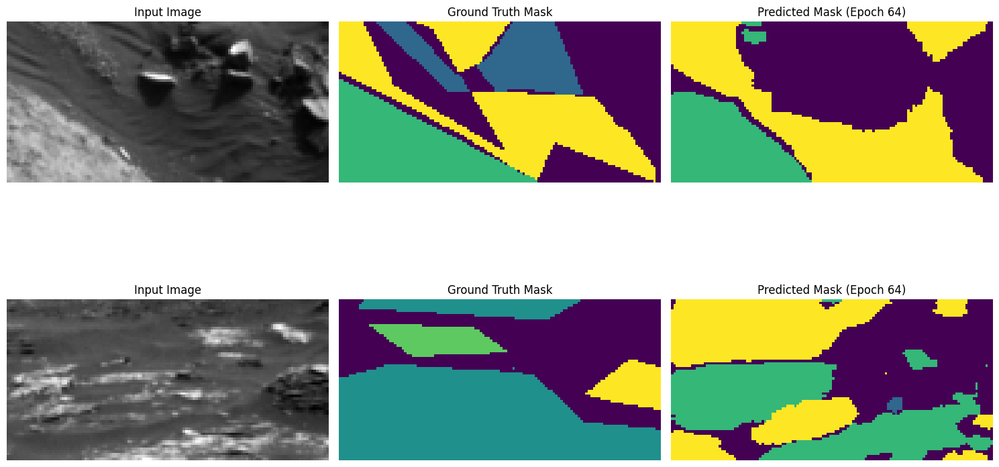

Epoch 64: Per-class IoUs: [None, 0.781951521693957, 0.4687013583966716, 0.800198419565092, 0.013069759843162882]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 241ms/step - accuracy: 0.8956 - loss: 0.0013 - mean_io_u: 0.7487 - mean_iou: 0.7487 - val_accuracy: 0.7132 - val_loss: 0.0233 - val_mean_io_u: 0.4128 - val_mean_iou: 0.4128 - learning_rate: 2.5000e-05
Epoch 65/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.8991 - loss: 0.0013 - mean_io_u: 0.7509 - mean_iou: 0.7509Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 65: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


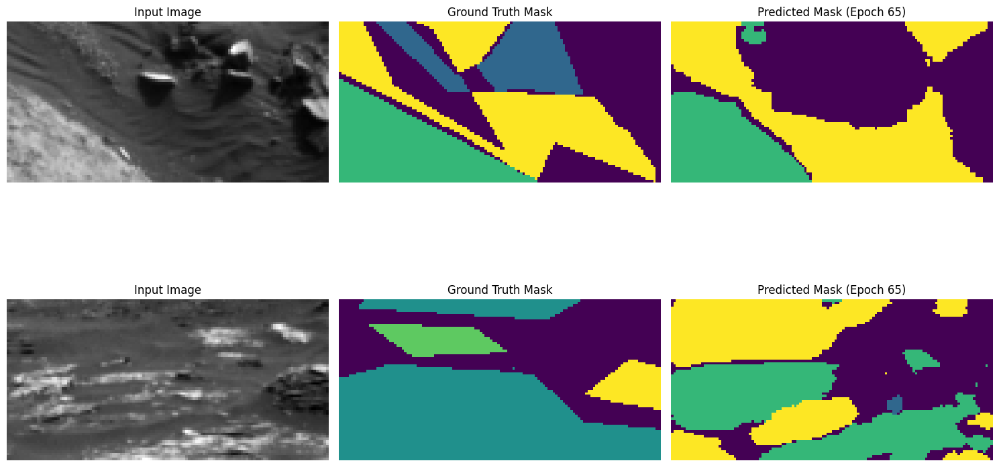

Epoch 65: Per-class IoUs: [None, 0.7817732835141467, 0.46356827728020267, 0.7997239609298546, 0.014412955465587044]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 242ms/step - accuracy: 0.8991 - loss: 0.0013 - mean_io_u: 0.7509 - mean_iou: 0.7509 - val_accuracy: 0.7126 - val_loss: 0.0234 - val_mean_io_u: 0.4119 - val_mean_iou: 0.4119 - learning_rate: 2.5000e-05
Epoch 66/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9021 - loss: 0.0012 - mean_io_u: 0.7527 - mean_iou: 0.7527Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 66: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


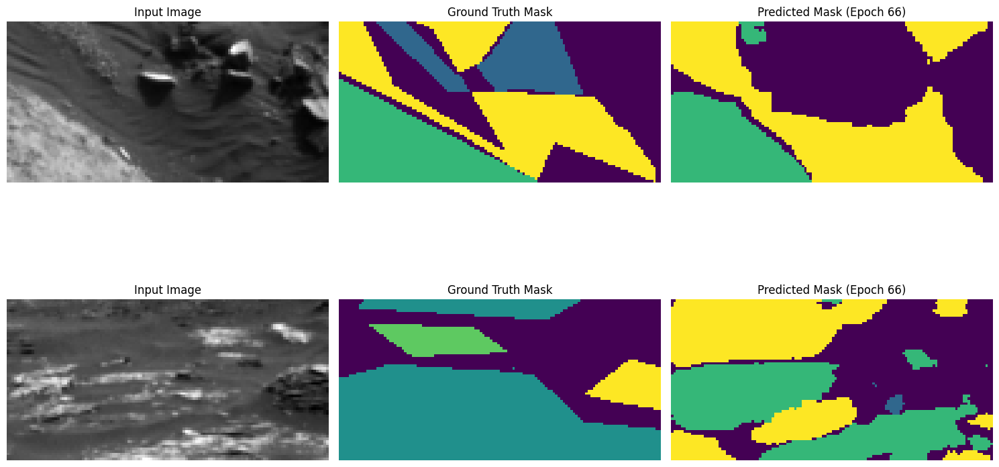

Epoch 66: Per-class IoUs: [None, 0.7789771399552746, 0.45266910729372006, 0.7995233578837827, 0.01293174005565559]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9021 - loss: 0.0012 - mean_io_u: 0.7527 - mean_iou: 0.7527 - val_accuracy: 0.7100 - val_loss: 0.0239 - val_mean_io_u: 0.4088 - val_mean_iou: 0.4088 - learning_rate: 2.5000e-05
Epoch 67/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9042 - loss: 0.0012 - mean_io_u: 0.7538 - mean_iou: 0.7538Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 67: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


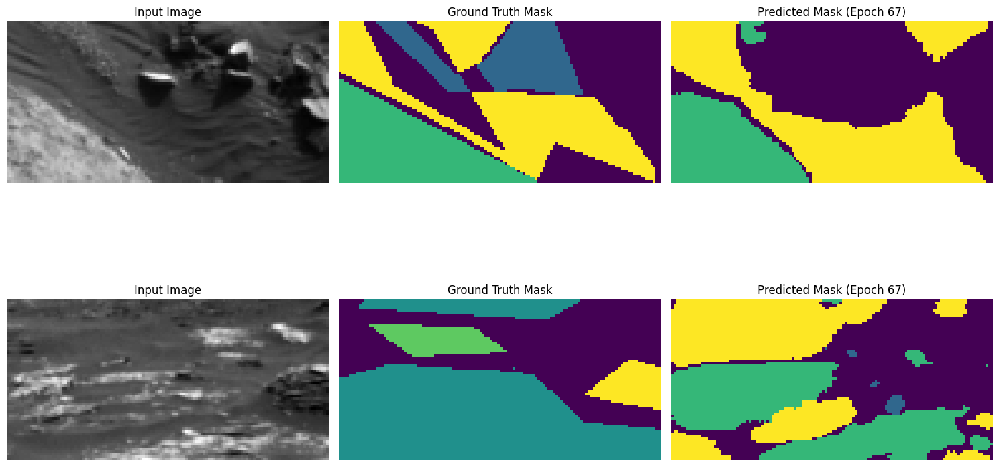

Epoch 67: Per-class IoUs: [None, 0.7701040564167255, 0.4390970635257562, 0.7899563879641238, 0.013246116107931317]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9042 - loss: 0.0012 - mean_io_u: 0.7538 - mean_iou: 0.7538 - val_accuracy: 0.7043 - val_loss: 0.0242 - val_mean_io_u: 0.4025 - val_mean_iou: 0.4025 - learning_rate: 2.5000e-05
Epoch 68/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9068 - loss: 0.0012 - mean_io_u: 0.7551 - mean_iou: 0.7551Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 68: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


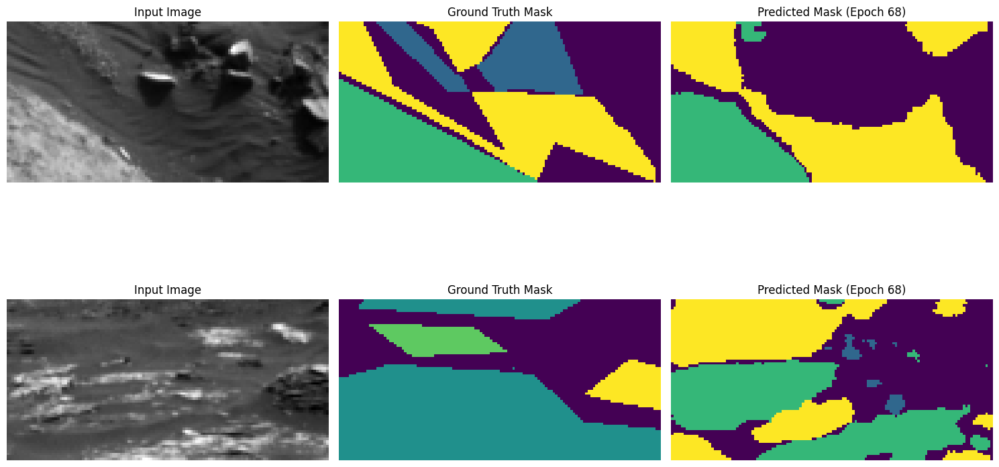

Epoch 68: Per-class IoUs: [None, 0.7691433800495499, 0.44040857022977564, 0.7847399868440287, 0.01110748121528912]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 241ms/step - accuracy: 0.9068 - loss: 0.0012 - mean_io_u: 0.7551 - mean_iou: 0.7551 - val_accuracy: 0.7041 - val_loss: 0.0249 - val_mean_io_u: 0.4011 - val_mean_iou: 0.4011 - learning_rate: 2.5000e-05
Epoch 69/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9091 - loss: 0.0012 - mean_io_u: 0.7552 - mean_iou: 0.7552Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 69: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


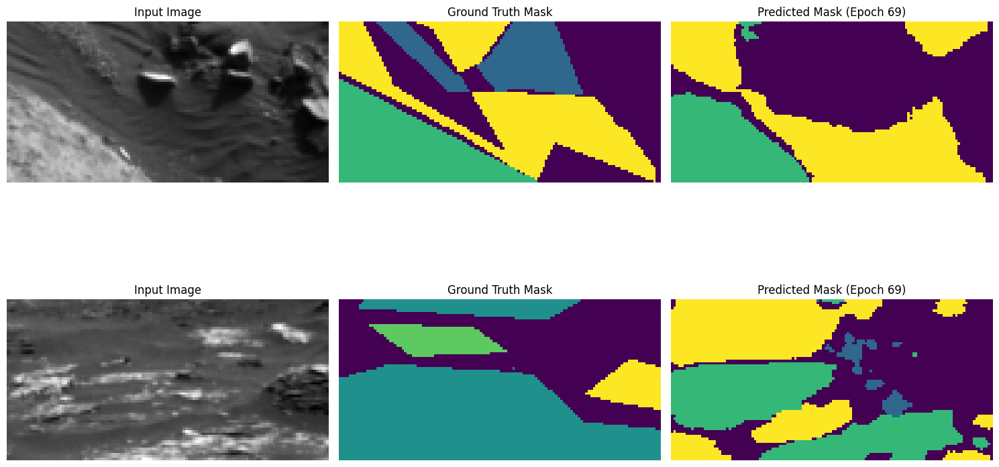

Epoch 69: Per-class IoUs: [None, 0.7660821249597065, 0.42727804630728855, 0.7834287306744406, 0.021137952956134774]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 240ms/step - accuracy: 0.9091 - loss: 0.0012 - mean_io_u: 0.7552 - mean_iou: 0.7552 - val_accuracy: 0.7022 - val_loss: 0.0241 - val_mean_io_u: 0.3996 - val_mean_iou: 0.3996 - learning_rate: 2.5000e-05
Epoch 70/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9112 - loss: 0.0011 - mean_io_u: 0.7563 - mean_iou: 0.7563Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 70: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


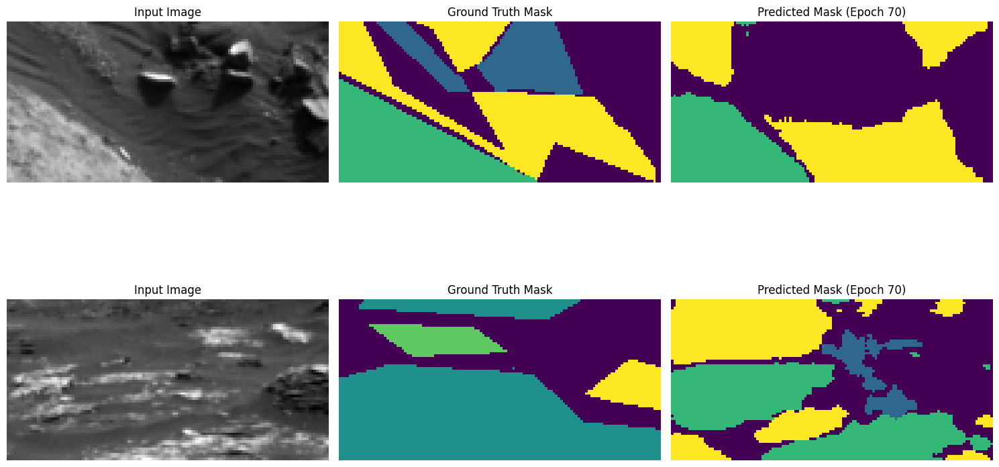

Epoch 70: Per-class IoUs: [None, 0.7646318265362518, 0.41990829440509764, 0.7796122020844398, 0.061101106251607924]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 241ms/step - accuracy: 0.9112 - loss: 0.0011 - mean_io_u: 0.7562 - mean_iou: 0.7562 - val_accuracy: 0.7004 - val_loss: 0.0217 - val_mean_io_u: 0.4051 - val_mean_iou: 0.4051 - learning_rate: 2.5000e-05
Epoch 71/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9116 - loss: 0.0011 - mean_io_u: 0.7555 - mean_iou: 0.7555Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 71: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


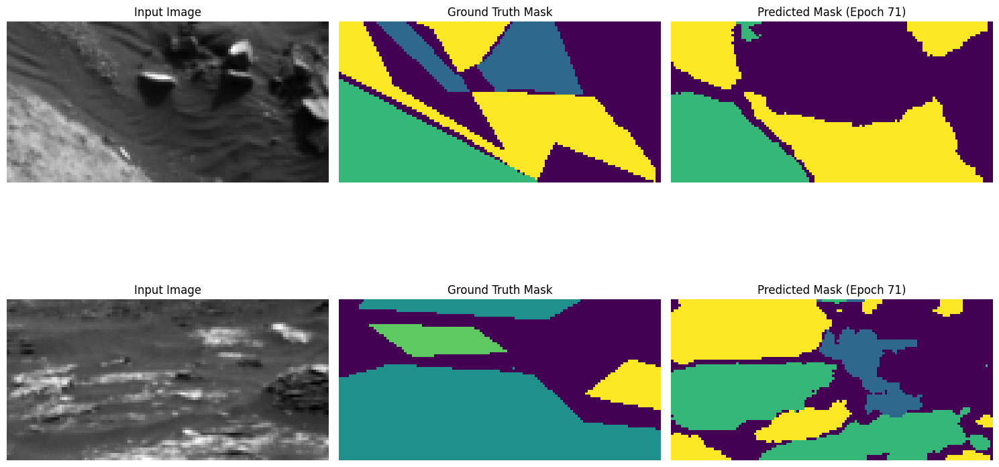

Epoch 71: Per-class IoUs: [None, 0.7745256538310643, 0.44637496650449376, 0.7765921482020189, 0.021370783086551673]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9116 - loss: 0.0011 - mean_io_u: 0.7555 - mean_iou: 0.7555 - val_accuracy: 0.7081 - val_loss: 0.0241 - val_mean_io_u: 0.4038 - val_mean_iou: 0.4038 - learning_rate: 2.5000e-05
Epoch 72/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9054 - loss: 0.0012 - mean_io_u: 0.7432 - mean_iou: 0.7432Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 72: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


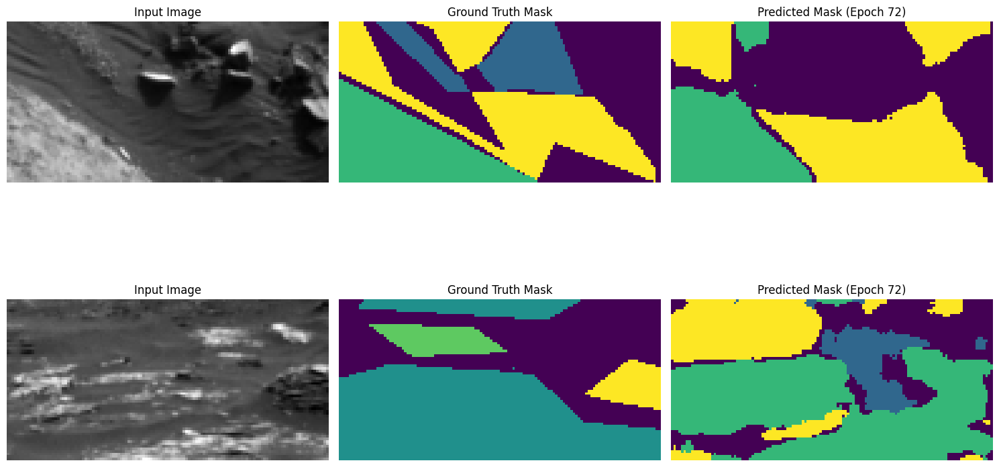

Epoch 72: Per-class IoUs: [None, 0.8032607127585317, 0.6140849462365592, 0.778909293073996, 0.013494429624980386]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9054 - loss: 0.0012 - mean_io_u: 0.7432 - mean_iou: 0.7432 - val_accuracy: 0.7394 - val_loss: 0.0224 - val_mean_io_u: 0.4419 - val_mean_iou: 0.4419 - learning_rate: 2.5000e-05
Epoch 73/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.8996 - loss: 0.0013 - mean_io_u: 0.7357 - mean_iou: 0.7357Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 73: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


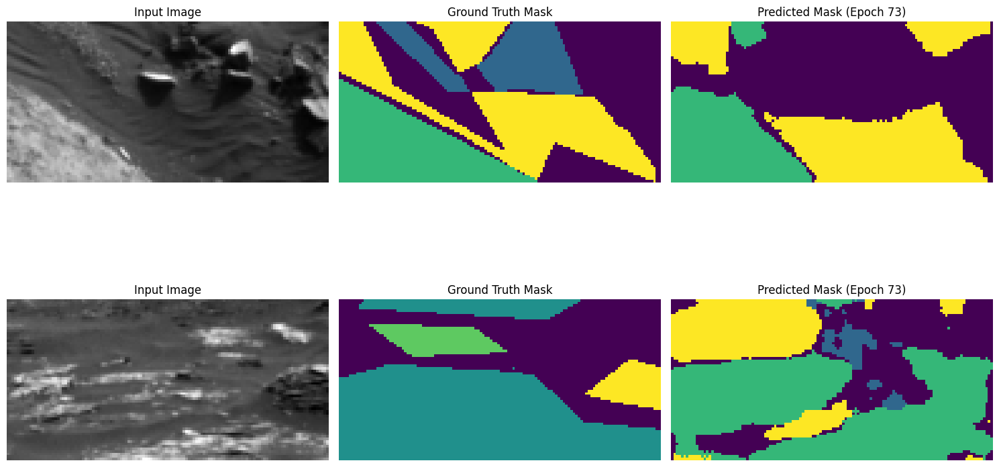

Epoch 73: Per-class IoUs: [None, 0.7953904452546996, 0.6228584541425515, 0.7584384078765968, 0.020565950208752126]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.8996 - loss: 0.0013 - mean_io_u: 0.7357 - mean_iou: 0.7357 - val_accuracy: 0.7397 - val_loss: 0.0211 - val_mean_io_u: 0.4395 - val_mean_iou: 0.4395 - learning_rate: 2.5000e-05
Epoch 74/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9013 - loss: 0.0013 - mean_io_u: 0.7445 - mean_iou: 0.7445Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 74: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


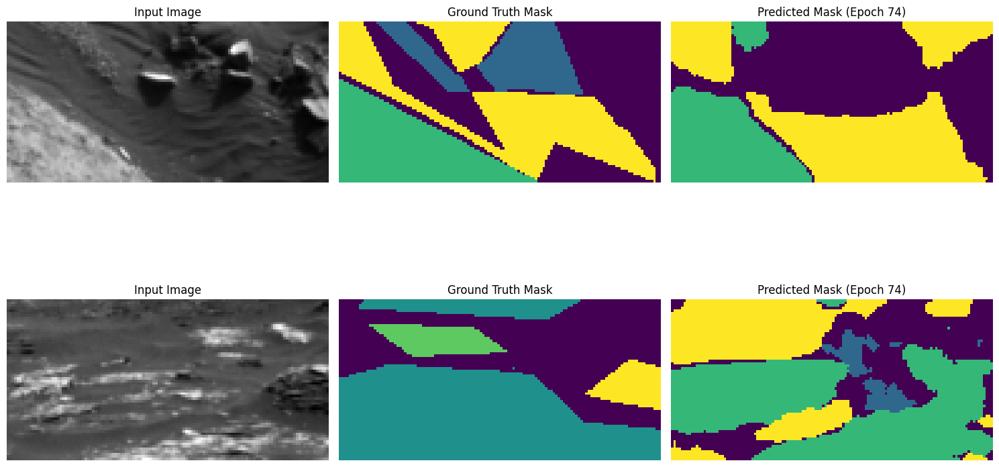

Epoch 74: Per-class IoUs: [None, 0.8007582711994083, 0.6229830829623084, 0.779769694864925, 0.007206026858827383]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9013 - loss: 0.0013 - mean_io_u: 0.7445 - mean_iou: 0.7445 - val_accuracy: 0.7435 - val_loss: 0.0224 - val_mean_io_u: 0.4421 - val_mean_iou: 0.4421 - learning_rate: 2.5000e-05
Epoch 75/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9063 - loss: 0.0012 - mean_io_u: 0.7497 - mean_iou: 0.7497Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 75: val_loss did not improve from 0.00530

Epoch 75: ReduceLROnPlateau reducing learning rate to 1.249999968422344e-05.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


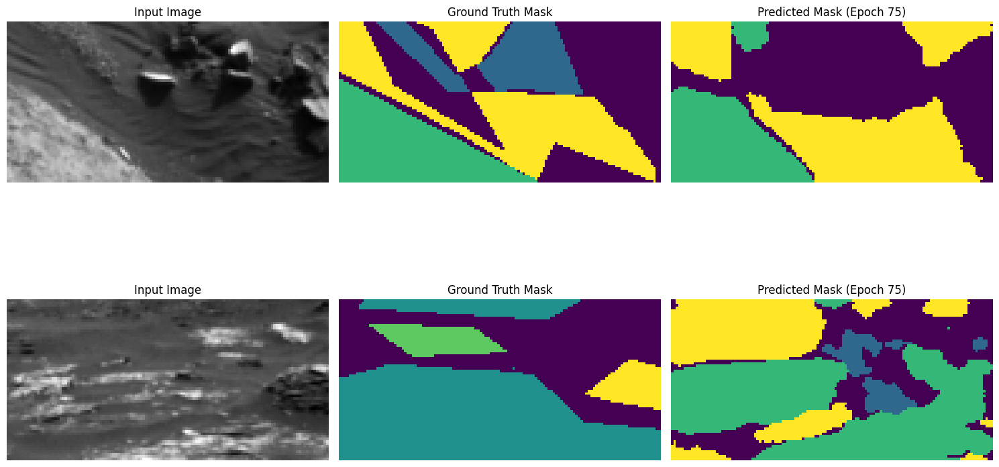

Epoch 75: Per-class IoUs: [None, 0.805672741324536, 0.6141962426180523, 0.7827725031503592, 0.006765676567656765]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 241ms/step - accuracy: 0.9063 - loss: 0.0012 - mean_io_u: 0.7496 - mean_iou: 0.7496 - val_accuracy: 0.7435 - val_loss: 0.0231 - val_mean_io_u: 0.4419 - val_mean_iou: 0.4419 - learning_rate: 2.5000e-05
Epoch 76/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9091 - loss: 0.0012 - mean_io_u: 0.7524 - mean_iou: 0.7524Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 76: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


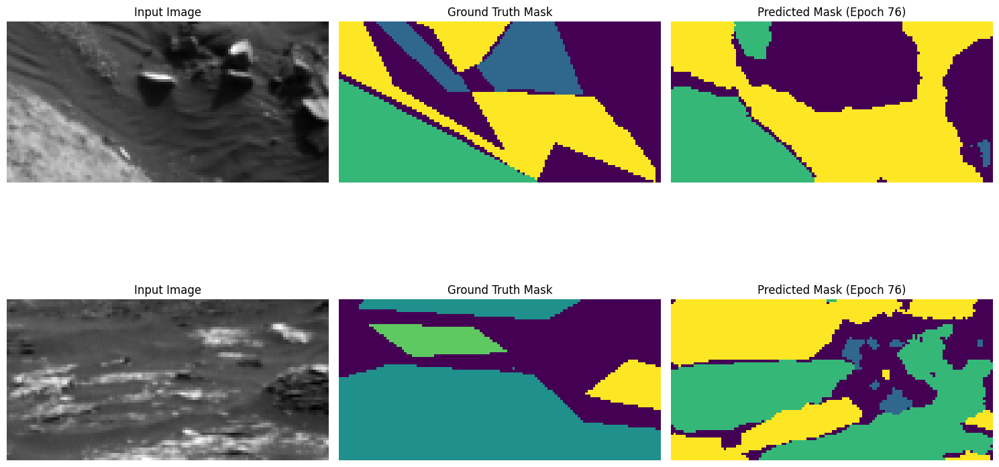

Epoch 76: Per-class IoUs: [None, 0.8212283459993479, 0.6507630027708188, 0.8072006100435994, 0.015135621159898097]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9091 - loss: 0.0012 - mean_io_u: 0.7523 - mean_iou: 0.7523 - val_accuracy: 0.7491 - val_loss: 0.0213 - val_mean_io_u: 0.4589 - val_mean_iou: 0.4589 - learning_rate: 1.2500e-05
Epoch 77/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9113 - loss: 0.0011 - mean_io_u: 0.7538 - mean_iou: 0.7538Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 77: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


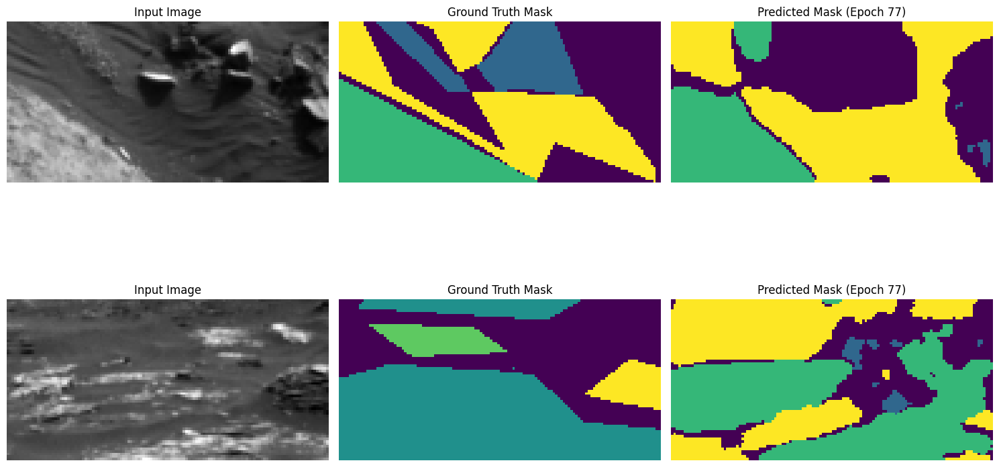

Epoch 77: Per-class IoUs: [None, 0.8210309812536847, 0.6547683071991108, 0.807037513147131, 0.011888002502737369]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 240ms/step - accuracy: 0.9113 - loss: 0.0011 - mean_io_u: 0.7537 - mean_iou: 0.7537 - val_accuracy: 0.7493 - val_loss: 0.0220 - val_mean_io_u: 0.4589 - val_mean_iou: 0.4589 - learning_rate: 1.2500e-05
Epoch 78/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9147 - loss: 0.0011 - mean_io_u: 0.7565 - mean_iou: 0.7565Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 78: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


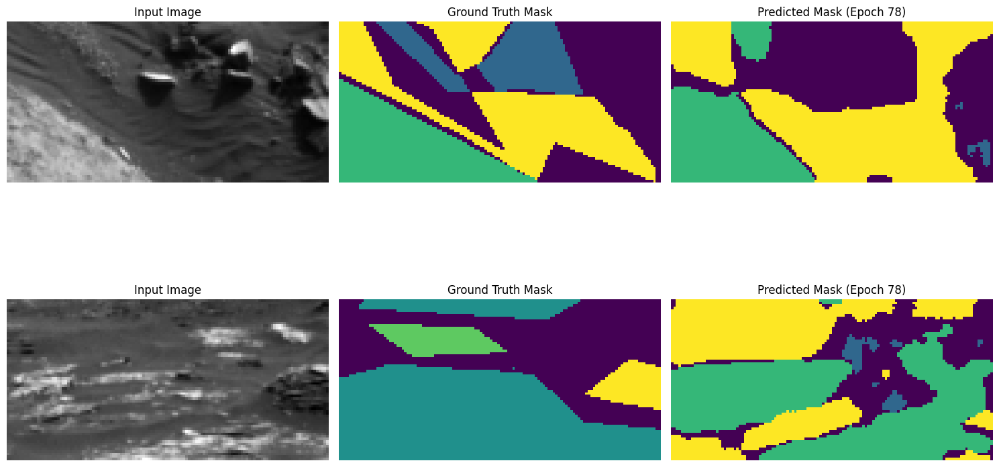

Epoch 78: Per-class IoUs: [None, 0.8201860992675013, 0.6559903045273194, 0.80596932738158, 0.011053213327017211]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 240ms/step - accuracy: 0.9147 - loss: 0.0011 - mean_io_u: 0.7565 - mean_iou: 0.7565 - val_accuracy: 0.7494 - val_loss: 0.0225 - val_mean_io_u: 0.4586 - val_mean_iou: 0.4586 - learning_rate: 1.2500e-05
Epoch 79/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9173 - loss: 0.0011 - mean_io_u: 0.7586 - mean_iou: 0.7586Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 79: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


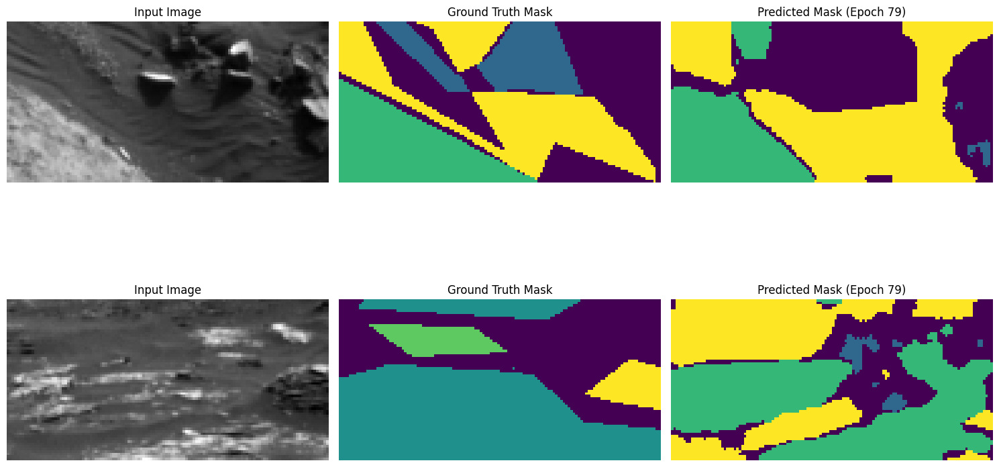

Epoch 79: Per-class IoUs: [None, 0.8194621159686185, 0.6559215695324572, 0.8050552192163577, 0.010928096293949953]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 241ms/step - accuracy: 0.9173 - loss: 0.0011 - mean_io_u: 0.7586 - mean_iou: 0.7586 - val_accuracy: 0.7491 - val_loss: 0.0229 - val_mean_io_u: 0.4583 - val_mean_iou: 0.4583 - learning_rate: 1.2500e-05
Epoch 80/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9196 - loss: 0.0010 - mean_io_u: 0.7602 - mean_iou: 0.7602Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 80: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


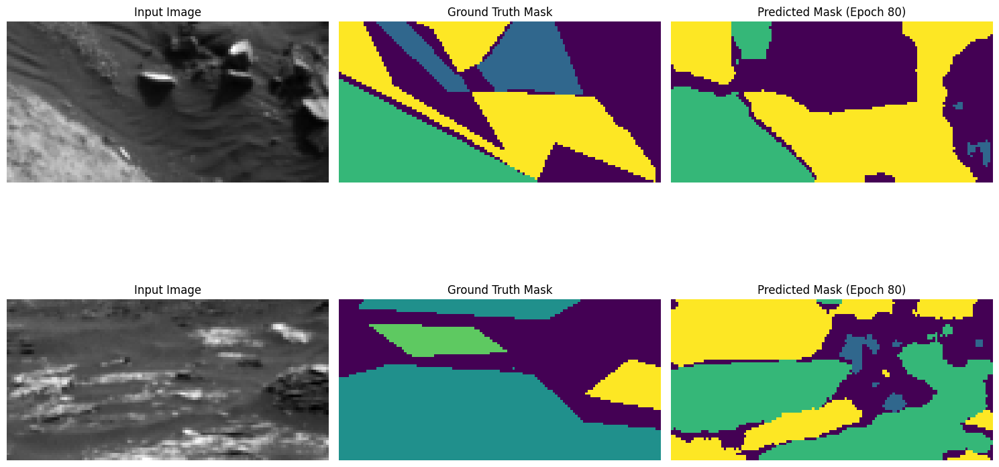

Epoch 80: Per-class IoUs: [None, 0.8188791608554777, 0.6555967067838743, 0.8043670841459689, 0.010943695479777953]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9196 - loss: 0.0010 - mean_io_u: 0.7602 - mean_iou: 0.7602 - val_accuracy: 0.7489 - val_loss: 0.0232 - val_mean_io_u: 0.4580 - val_mean_iou: 0.4580 - learning_rate: 1.2500e-05
Epoch 81/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9218 - loss: 0.0010 - mean_io_u: 0.7616 - mean_iou: 0.7616Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 81: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


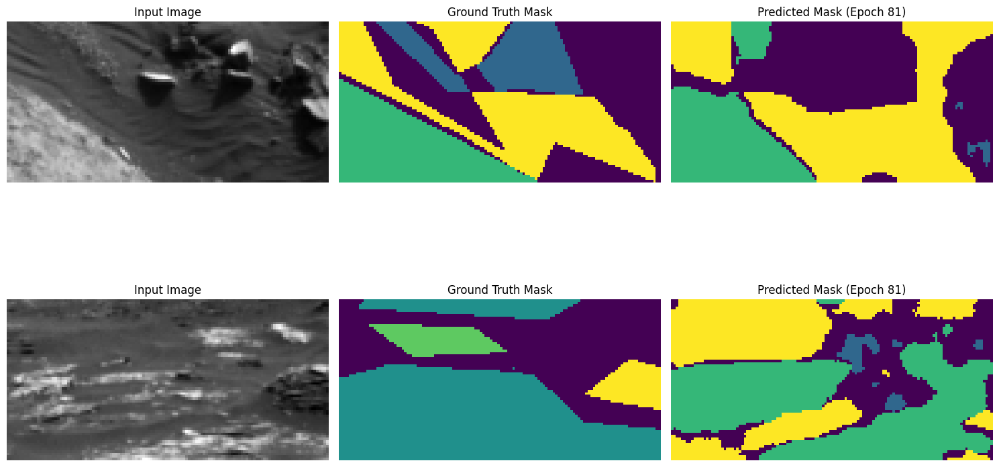

Epoch 81: Per-class IoUs: [None, 0.8183238290570171, 0.6551451096138196, 0.8038177093743754, 0.010653522022579106]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9218 - loss: 0.0010 - mean_io_u: 0.7616 - mean_iou: 0.7616 - val_accuracy: 0.7486 - val_loss: 0.0236 - val_mean_io_u: 0.4576 - val_mean_iou: 0.4576 - learning_rate: 1.2500e-05
Epoch 82/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9238 - loss: 9.8229e-04 - mean_io_u: 0.7629 - mean_iou: 0.7629Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 82: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


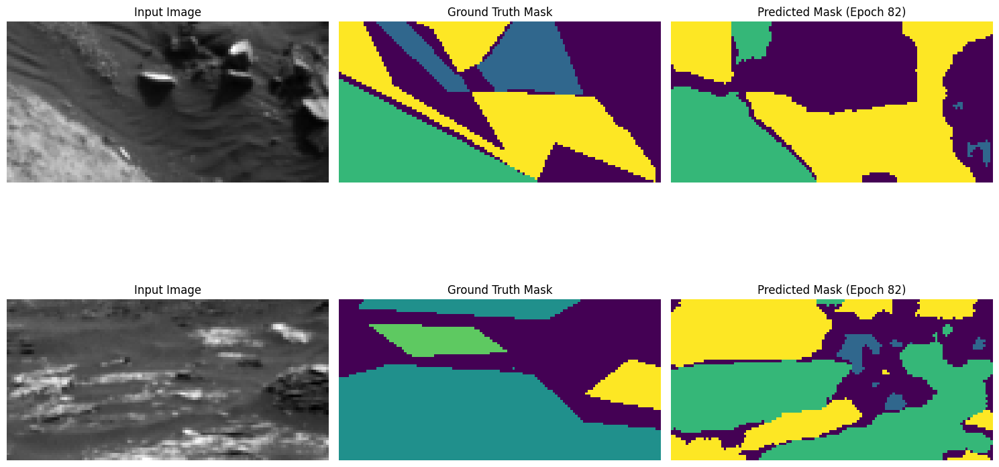

Epoch 82: Per-class IoUs: [None, 0.8177051704513402, 0.6545280000670008, 0.8030580406515161, 0.010665393186883159]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9238 - loss: 9.8220e-04 - mean_io_u: 0.7629 - mean_iou: 0.7629 - val_accuracy: 0.7482 - val_loss: 0.0239 - val_mean_io_u: 0.4572 - val_mean_iou: 0.4572 - learning_rate: 1.2500e-05
Epoch 83/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9257 - loss: 9.5889e-04 - mean_io_u: 0.7641 - mean_iou: 0.7641Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 83: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


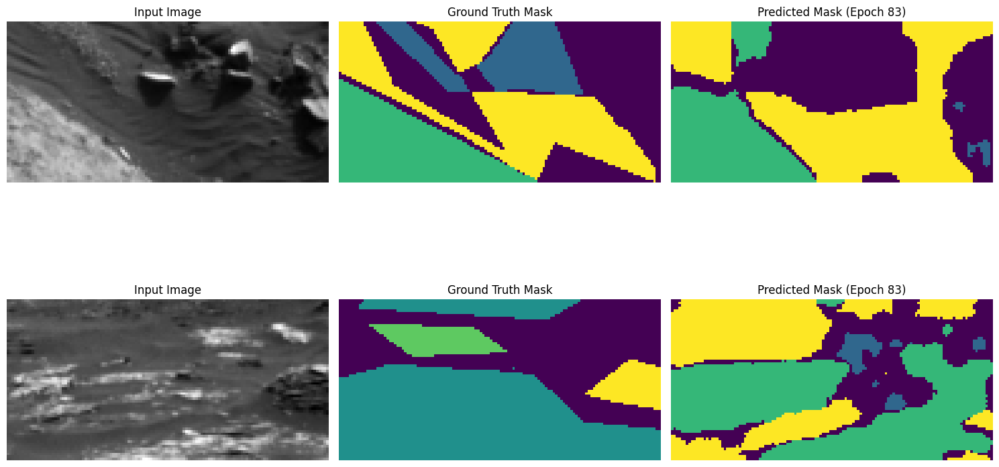

Epoch 83: Per-class IoUs: [None, 0.8171282968724164, 0.6540189198266851, 0.8024404744385908, 0.010208964747168607]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9257 - loss: 9.5880e-04 - mean_io_u: 0.7641 - mean_iou: 0.7641 - val_accuracy: 0.7479 - val_loss: 0.0242 - val_mean_io_u: 0.4568 - val_mean_iou: 0.4568 - learning_rate: 1.2500e-05
Epoch 84/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9276 - loss: 9.3666e-04 - mean_io_u: 0.7652 - mean_iou: 0.7652Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 84: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


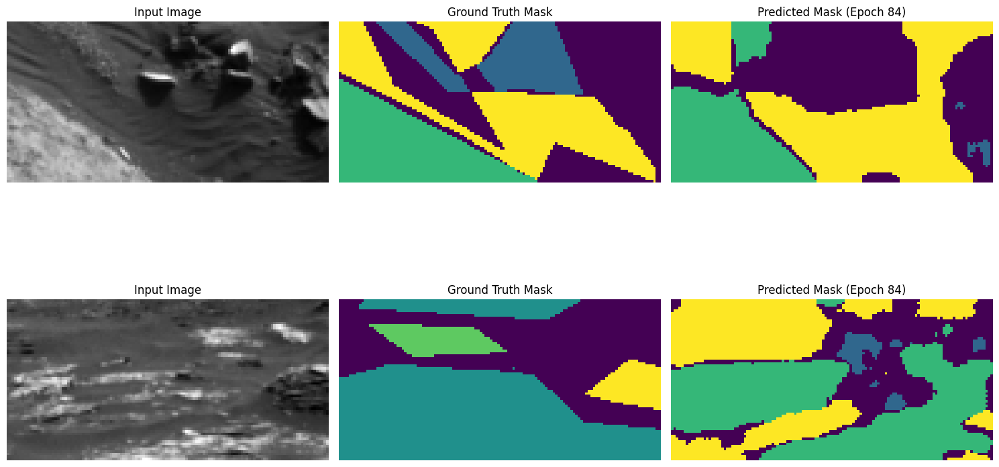

Epoch 84: Per-class IoUs: [None, 0.8164384835930778, 0.6537893556672998, 0.8018429814653634, 0.009580073447229762]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 241ms/step - accuracy: 0.9276 - loss: 9.3658e-04 - mean_io_u: 0.7652 - mean_iou: 0.7652 - val_accuracy: 0.7476 - val_loss: 0.0244 - val_mean_io_u: 0.4563 - val_mean_iou: 0.4563 - learning_rate: 1.2500e-05
Epoch 85/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9294 - loss: 9.1546e-04 - mean_io_u: 0.7663 - mean_iou: 0.7663Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 85: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


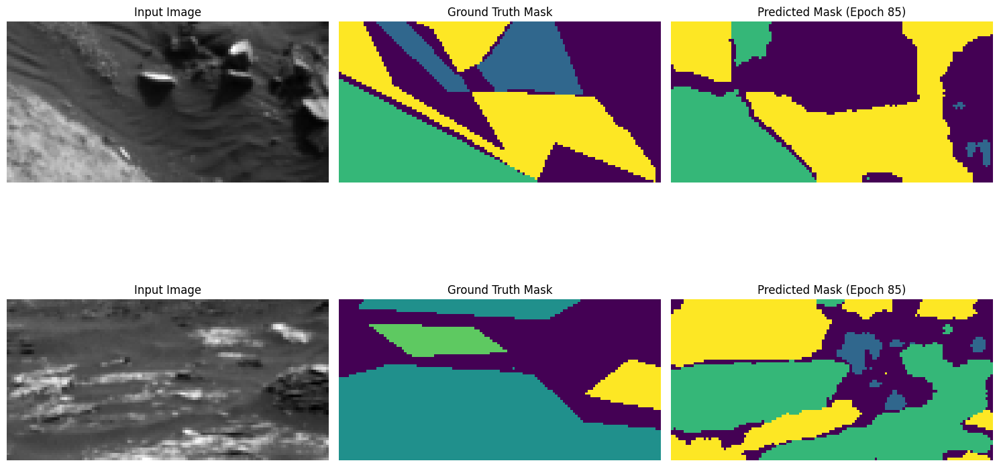

Epoch 85: Per-class IoUs: [None, 0.8157689891613958, 0.6531976744186047, 0.8011021861084959, 0.009114166933162776]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9294 - loss: 9.1538e-04 - mean_io_u: 0.7662 - mean_iou: 0.7662 - val_accuracy: 0.7472 - val_loss: 0.0247 - val_mean_io_u: 0.4558 - val_mean_iou: 0.4558 - learning_rate: 1.2500e-05
Epoch 86/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9311 - loss: 8.9523e-04 - mean_io_u: 0.7672 - mean_iou: 0.7672Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 86: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


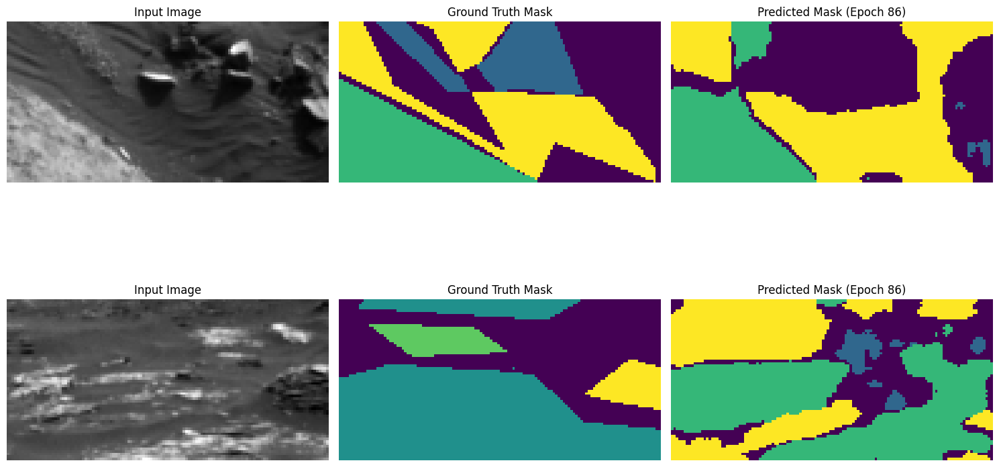

Epoch 86: Per-class IoUs: [None, 0.8150949670142583, 0.6528938059757657, 0.8004104820275596, 0.00864]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9311 - loss: 8.9515e-04 - mean_io_u: 0.7672 - mean_iou: 0.7672 - val_accuracy: 0.7469 - val_loss: 0.0249 - val_mean_io_u: 0.4554 - val_mean_iou: 0.4554 - learning_rate: 1.2500e-05
Epoch 87/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step - accuracy: 0.9327 - loss: 8.7607e-04 - mean_io_u: 0.7681 - mean_iou: 0.7681Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 87: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


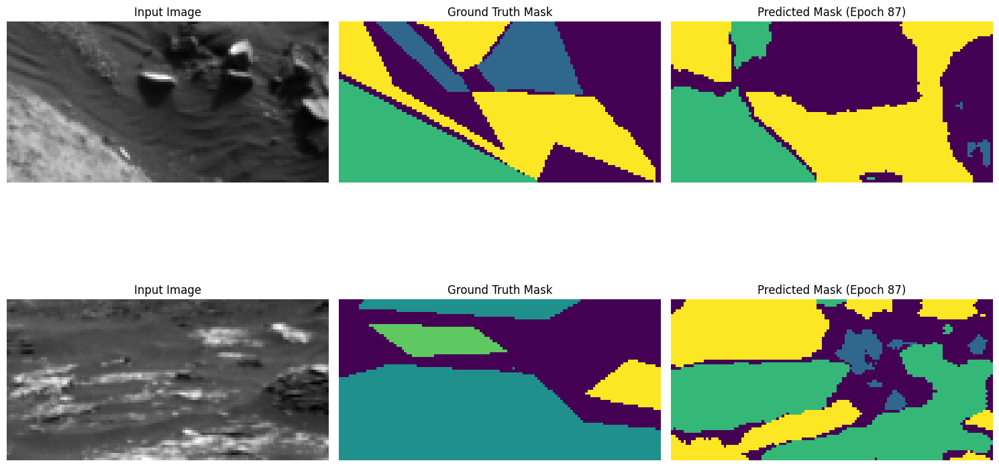

Epoch 87: Per-class IoUs: [None, 0.8144264939050152, 0.6523321992442891, 0.7999702835094704, 0.008333333333333333]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 242ms/step - accuracy: 0.9327 - loss: 8.7600e-04 - mean_io_u: 0.7681 - mean_iou: 0.7681 - val_accuracy: 0.7466 - val_loss: 0.0251 - val_mean_io_u: 0.4550 - val_mean_iou: 0.4550 - learning_rate: 1.2500e-05
Epoch 88/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9342 - loss: 8.5748e-04 - mean_io_u: 0.7689 - mean_iou: 0.7689Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 88: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


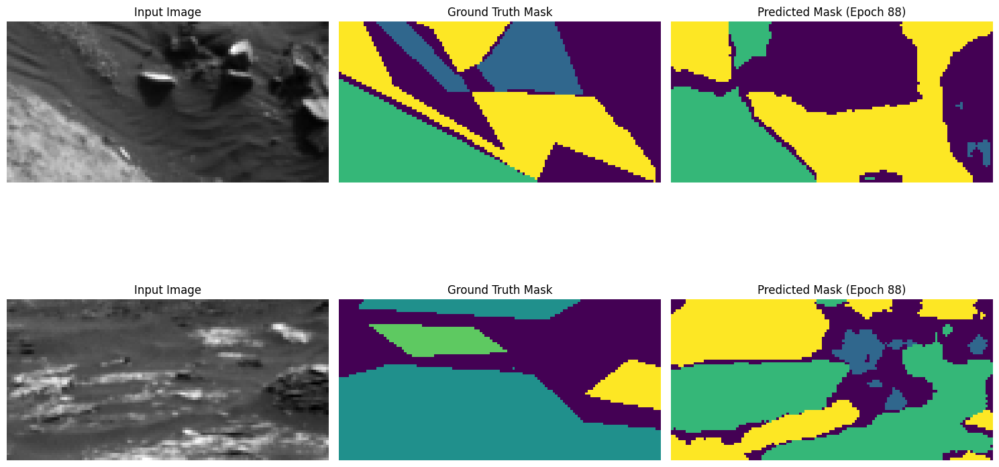

Epoch 88: Per-class IoUs: [None, 0.8136271184635782, 0.6519443622744695, 0.7994884753592824, 0.00833600512984931]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9342 - loss: 8.5741e-04 - mean_io_u: 0.7689 - mean_iou: 0.7689 - val_accuracy: 0.7463 - val_loss: 0.0253 - val_mean_io_u: 0.4547 - val_mean_iou: 0.4547 - learning_rate: 1.2500e-05
Epoch 89/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9357 - loss: 8.3968e-04 - mean_io_u: 0.7698 - mean_iou: 0.7698Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 89: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


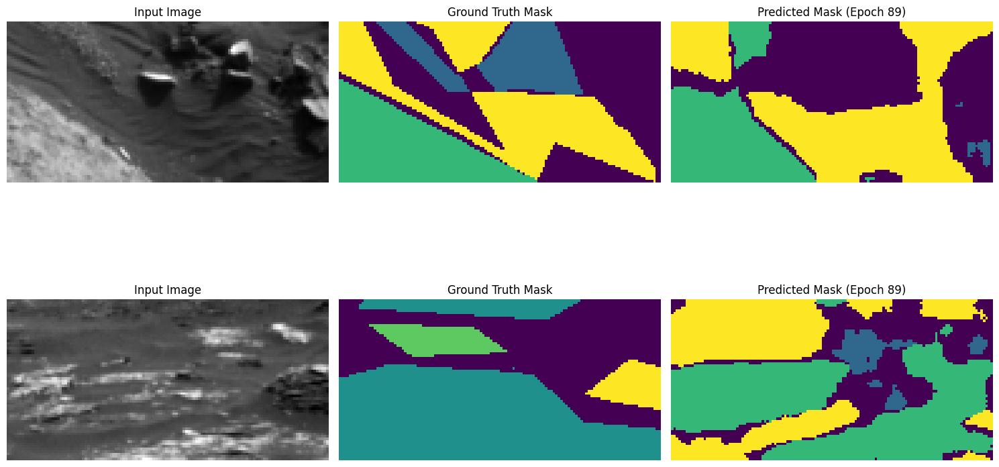

Epoch 89: Per-class IoUs: [None, 0.8131628768330145, 0.6518996934275594, 0.7991458992425431, 0.008025682182985553]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9357 - loss: 8.3962e-04 - mean_io_u: 0.7698 - mean_iou: 0.7698 - val_accuracy: 0.7461 - val_loss: 0.0255 - val_mean_io_u: 0.4544 - val_mean_iou: 0.4544 - learning_rate: 1.2500e-05
Epoch 90/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9371 - loss: 8.2235e-04 - mean_io_u: 0.7705 - mean_iou: 0.7705Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 90: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


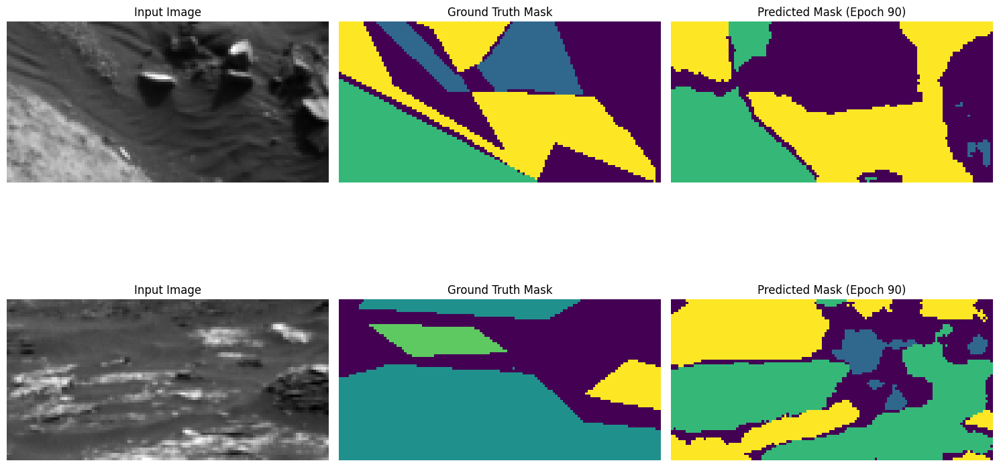

Epoch 90: Per-class IoUs: [None, 0.8124643475942956, 0.652002098670981, 0.7988525147419161, 0.008021819348628268]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9371 - loss: 8.2230e-04 - mean_io_u: 0.7705 - mean_iou: 0.7705 - val_accuracy: 0.7459 - val_loss: 0.0257 - val_mean_io_u: 0.4543 - val_mean_iou: 0.4543 - learning_rate: 1.2500e-05
Epoch 91/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9385 - loss: 8.0555e-04 - mean_io_u: 0.7713 - mean_iou: 0.7713Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 91: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


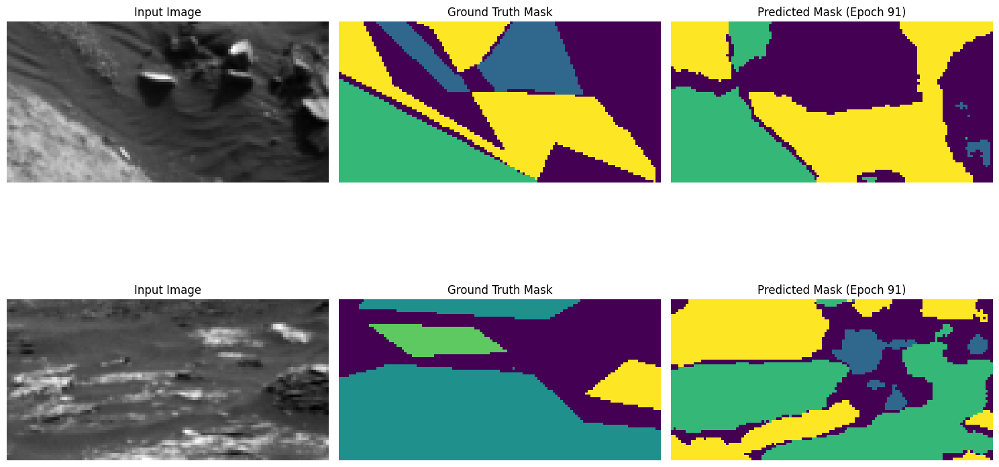

Epoch 91: Per-class IoUs: [None, 0.8120764912907739, 0.6527434841532979, 0.798410119695578, 0.007863906275076231]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9385 - loss: 8.0549e-04 - mean_io_u: 0.7713 - mean_iou: 0.7713 - val_accuracy: 0.7458 - val_loss: 0.0258 - val_mean_io_u: 0.4542 - val_mean_iou: 0.4542 - learning_rate: 1.2500e-05
Epoch 92/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9398 - loss: 7.8933e-04 - mean_io_u: 0.7720 - mean_iou: 0.7720Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 92: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


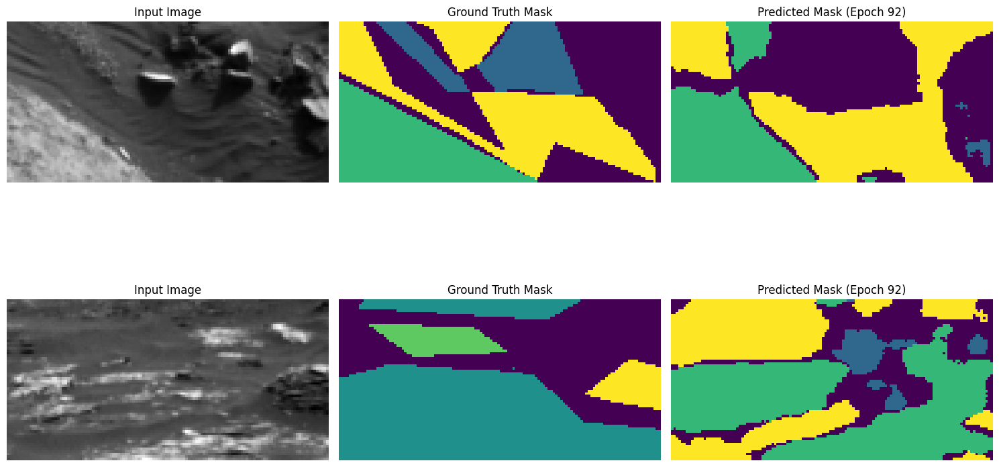

Epoch 92: Per-class IoUs: [None, 0.8112237375230091, 0.6528895914940658, 0.7978373667690869, 0.007712082262210797]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9398 - loss: 7.8928e-04 - mean_io_u: 0.7720 - mean_iou: 0.7720 - val_accuracy: 0.7455 - val_loss: 0.0259 - val_mean_io_u: 0.4539 - val_mean_iou: 0.4539 - learning_rate: 1.2500e-05
Epoch 93/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9411 - loss: 7.7376e-04 - mean_io_u: 0.7727 - mean_iou: 0.7727Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 93: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


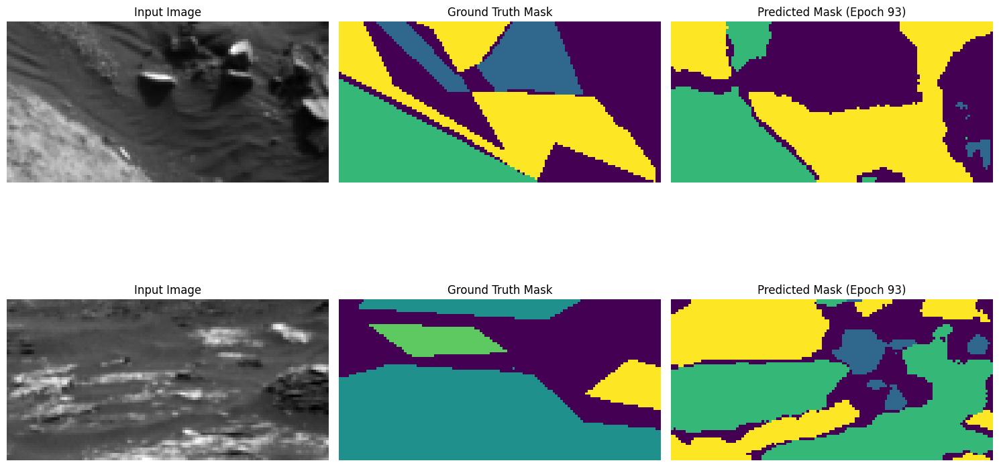

Epoch 93: Per-class IoUs: [None, 0.811059080574369, 0.6537601558059447, 0.7971579172389847, 0.007885420019311232]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 241ms/step - accuracy: 0.9411 - loss: 7.7371e-04 - mean_io_u: 0.7727 - mean_iou: 0.7727 - val_accuracy: 0.7454 - val_loss: 0.0261 - val_mean_io_u: 0.4540 - val_mean_iou: 0.4540 - learning_rate: 1.2500e-05
Epoch 94/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9423 - loss: 7.5867e-04 - mean_io_u: 0.7733 - mean_iou: 0.7733Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 94: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


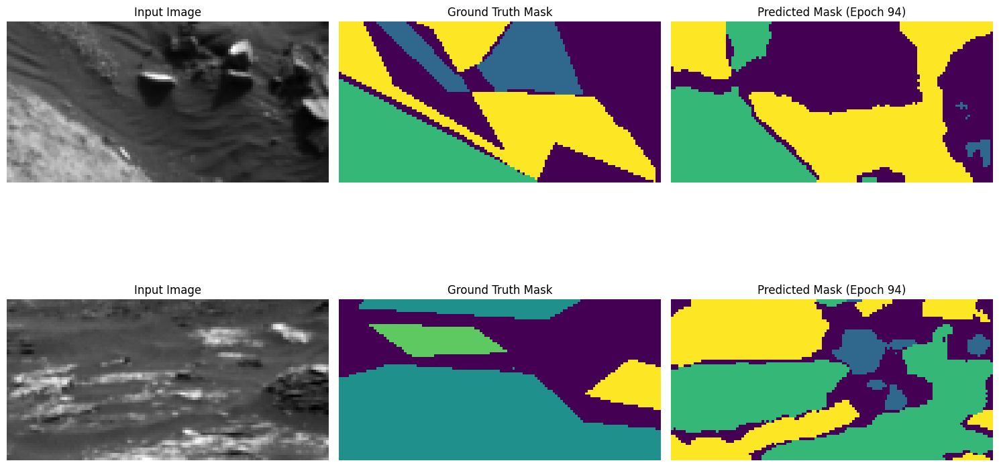

Epoch 94: Per-class IoUs: [None, 0.8101980524640697, 0.654525669864304, 0.7964562464562465, 0.0077544426494345715]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9423 - loss: 7.5862e-04 - mean_io_u: 0.7733 - mean_iou: 0.7733 - val_accuracy: 0.7452 - val_loss: 0.0263 - val_mean_io_u: 0.4538 - val_mean_iou: 0.4538 - learning_rate: 1.2500e-05
Epoch 95/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9435 - loss: 7.4425e-04 - mean_io_u: 0.7739 - mean_iou: 0.7739Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 95: val_loss did not improve from 0.00530

Epoch 95: ReduceLROnPlateau reducing learning rate to 6.24999984211172e-06.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


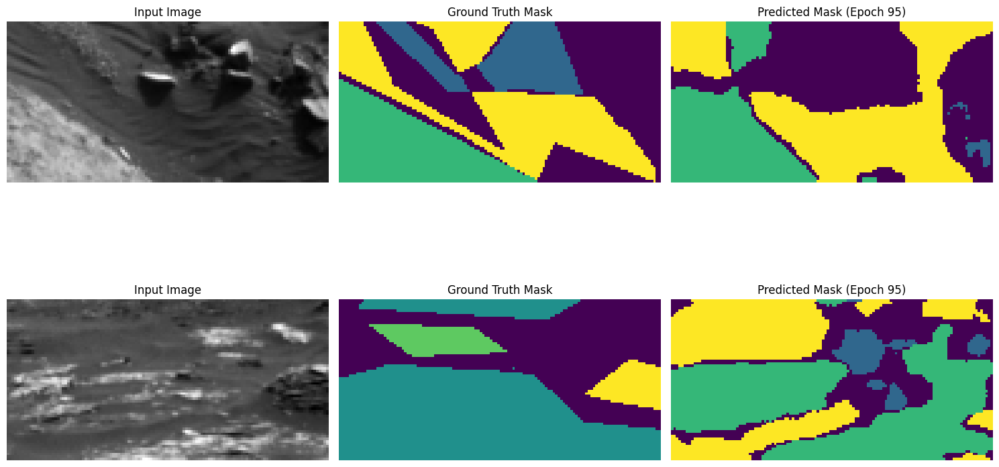

Epoch 95: Per-class IoUs: [None, 0.8093139158100277, 0.6550812524275494, 0.7956813593996757, 0.007862644415917844]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9435 - loss: 7.4421e-04 - mean_io_u: 0.7739 - mean_iou: 0.7739 - val_accuracy: 0.7448 - val_loss: 0.0263 - val_mean_io_u: 0.4536 - val_mean_iou: 0.4536 - learning_rate: 1.2500e-05
Epoch 96/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9344 - loss: 8.5054e-04 - mean_io_u: 0.7671 - mean_iou: 0.7671Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 96: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


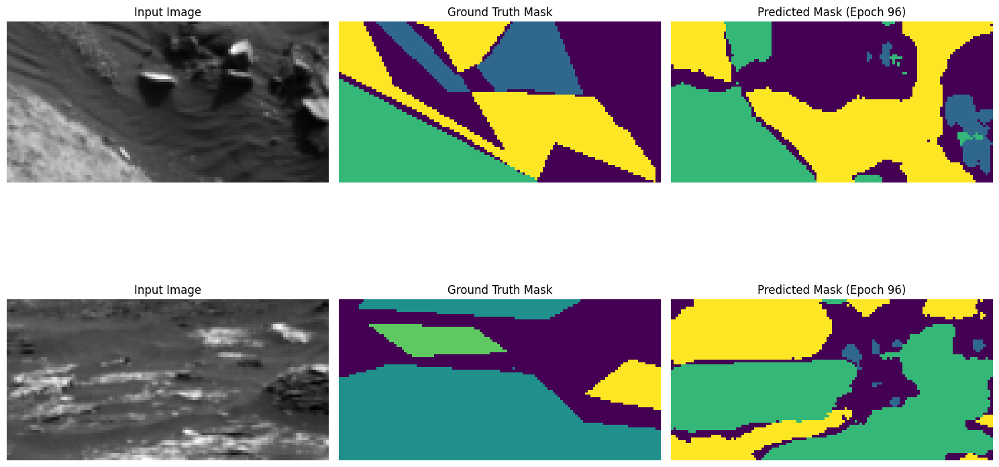

Epoch 96: Per-class IoUs: [None, 0.8079712845644369, 0.6946434202820201, 0.8050301676839422, 0.007903225806451614]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 242ms/step - accuracy: 0.9344 - loss: 8.5055e-04 - mean_io_u: 0.7671 - mean_iou: 0.7671 - val_accuracy: 0.7500 - val_loss: 0.0247 - val_mean_io_u: 0.4631 - val_mean_iou: 0.4631 - learning_rate: 6.2500e-06
Epoch 97/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9350 - loss: 8.4686e-04 - mean_io_u: 0.7684 - mean_iou: 0.7684Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 97: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


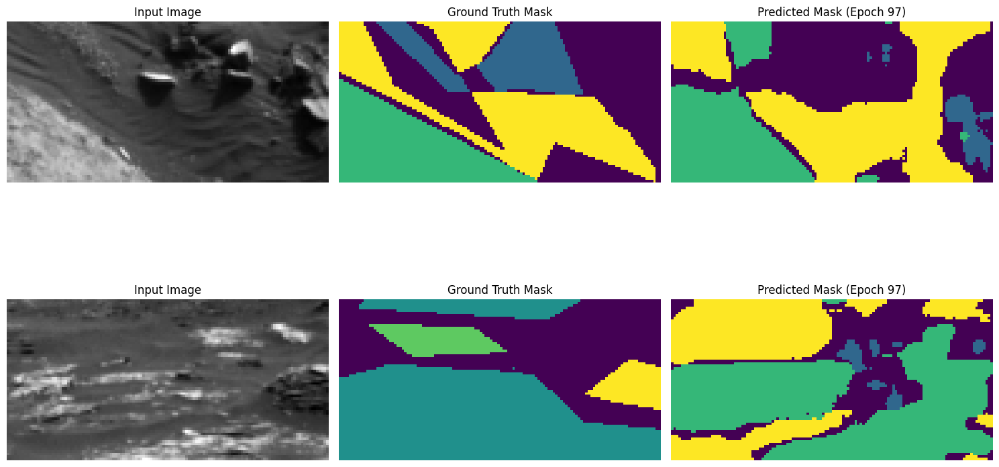

Epoch 97: Per-class IoUs: [None, 0.8062891417244369, 0.6759648532310902, 0.8029939945022557, 0.0068270481144343306]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9350 - loss: 8.4682e-04 - mean_io_u: 0.7684 - mean_iou: 0.7684 - val_accuracy: 0.7482 - val_loss: 0.0245 - val_mean_io_u: 0.4584 - val_mean_iou: 0.4584 - learning_rate: 6.2500e-06
Epoch 98/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9389 - loss: 7.9762e-04 - mean_io_u: 0.7715 - mean_iou: 0.7715Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 98: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


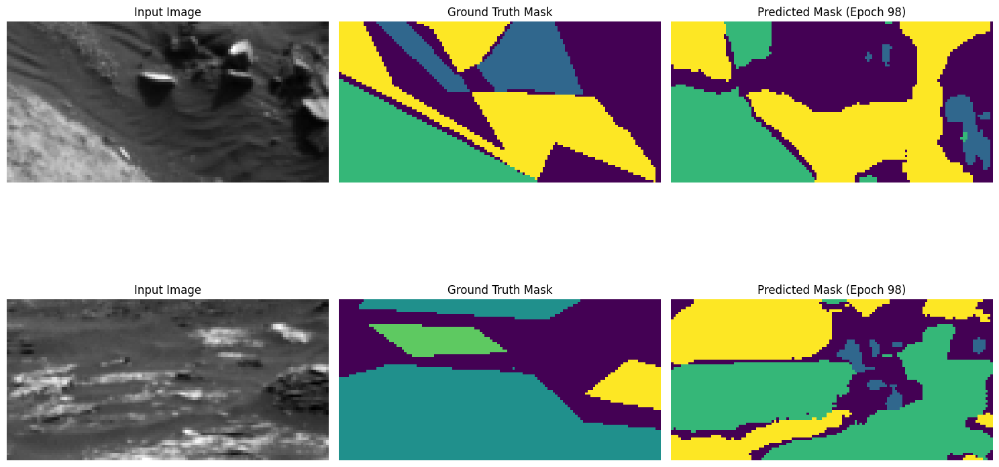

Epoch 98: Per-class IoUs: [None, 0.8057675481646533, 0.6721538206655887, 0.8011652131669789, 0.006997558991049634]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9389 - loss: 7.9760e-04 - mean_io_u: 0.7715 - mean_iou: 0.7715 - val_accuracy: 0.7475 - val_loss: 0.0247 - val_mean_io_u: 0.4572 - val_mean_iou: 0.4572 - learning_rate: 6.2500e-06
Epoch 99/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9406 - loss: 7.7454e-04 - mean_io_u: 0.7727 - mean_iou: 0.7727Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 99: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


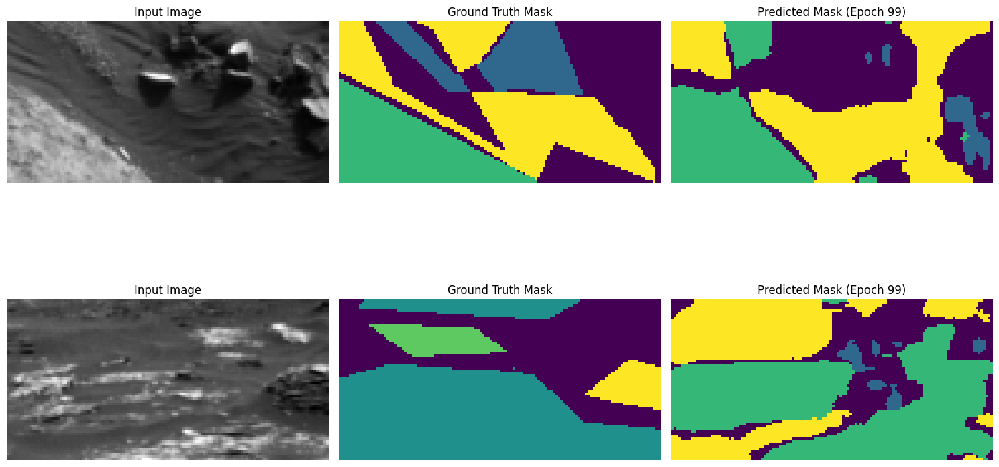

Epoch 99: Per-class IoUs: [None, 0.8062919902652379, 0.6709643648753122, 0.8009037282592294, 0.006995282251504799]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9406 - loss: 7.7452e-04 - mean_io_u: 0.7727 - mean_iou: 0.7727 - val_accuracy: 0.7475 - val_loss: 0.0249 - val_mean_io_u: 0.4570 - val_mean_iou: 0.4570 - learning_rate: 6.2500e-06
Epoch 100/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9419 - loss: 7.5683e-04 - mean_io_u: 0.7735 - mean_iou: 0.7735Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 100: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


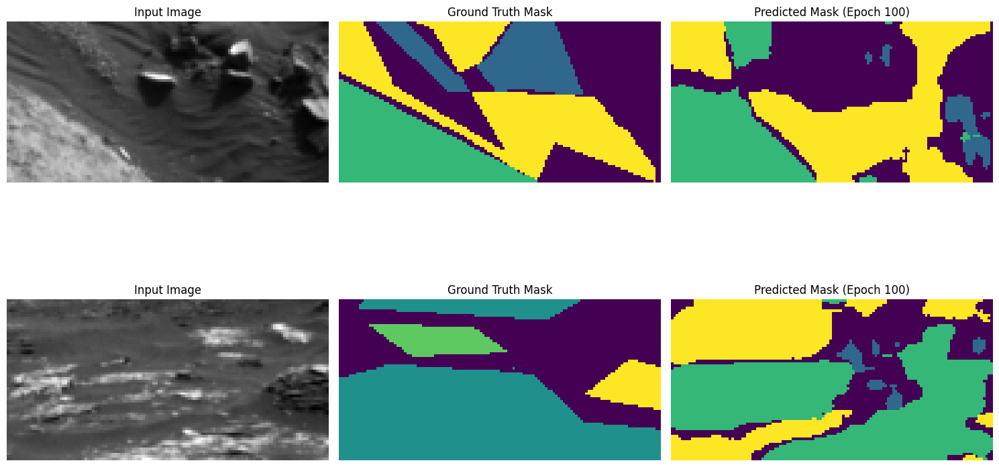

Epoch 100: Per-class IoUs: [None, 0.8066208740076983, 0.6709086713932122, 0.8004235100768007, 0.00700439811044144]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9419 - loss: 7.5681e-04 - mean_io_u: 0.7735 - mean_iou: 0.7735 - val_accuracy: 0.7475 - val_loss: 0.0251 - val_mean_io_u: 0.4570 - val_mean_iou: 0.4570 - learning_rate: 6.2500e-06
Epoch 101/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9431 - loss: 7.4200e-04 - mean_io_u: 0.7742 - mean_iou: 0.7742Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 101: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


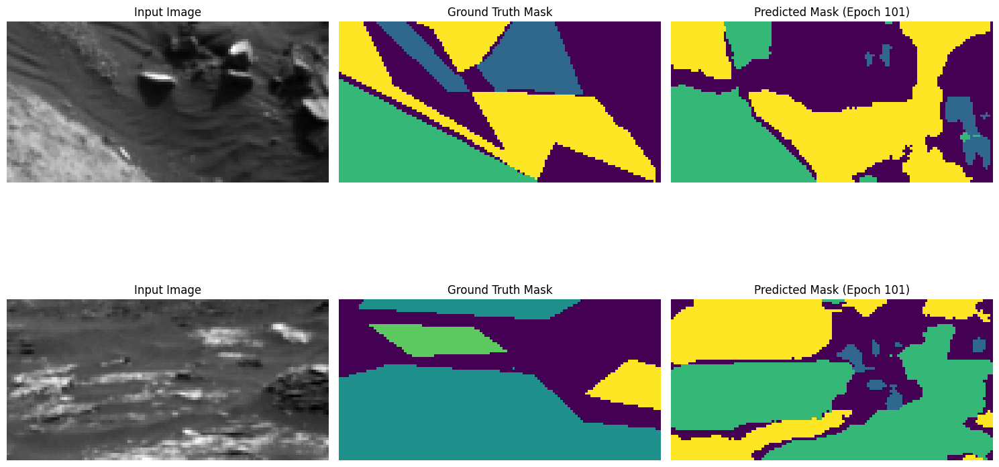

Epoch 101: Per-class IoUs: [None, 0.8068156377868226, 0.6710964778493718, 0.8000606675302225, 0.007013537758930028]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 241ms/step - accuracy: 0.9431 - loss: 7.4198e-04 - mean_io_u: 0.7742 - mean_iou: 0.7742 - val_accuracy: 0.7475 - val_loss: 0.0253 - val_mean_io_u: 0.4570 - val_mean_iou: 0.4570 - learning_rate: 6.2500e-06
Epoch 102/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9441 - loss: 7.2878e-04 - mean_io_u: 0.7748 - mean_iou: 0.7748Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 102: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


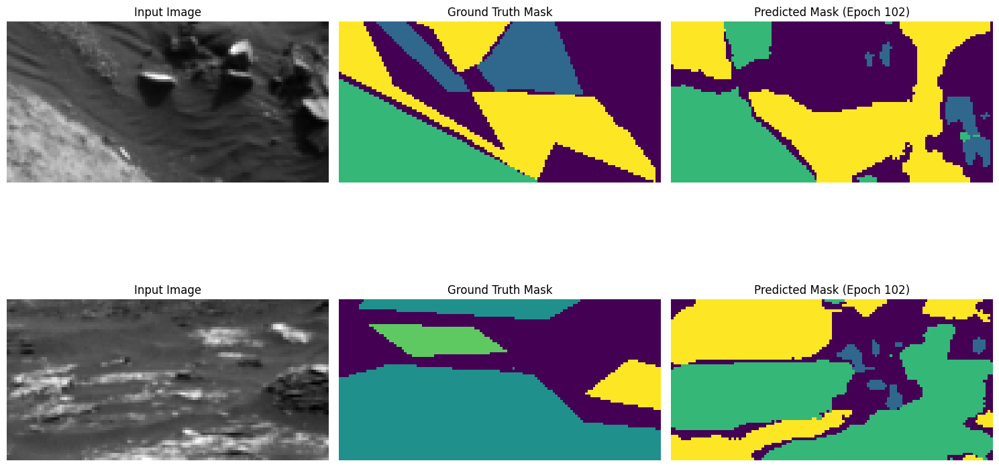

Epoch 102: Per-class IoUs: [None, 0.8070130251913863, 0.6714322682845825, 0.7997729192762006, 0.0070238484155504734]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9441 - loss: 7.2876e-04 - mean_io_u: 0.7748 - mean_iou: 0.7748 - val_accuracy: 0.7475 - val_loss: 0.0254 - val_mean_io_u: 0.4570 - val_mean_iou: 0.4570 - learning_rate: 6.2500e-06
Epoch 103/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9451 - loss: 7.1667e-04 - mean_io_u: 0.7753 - mean_iou: 0.7753Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 103: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


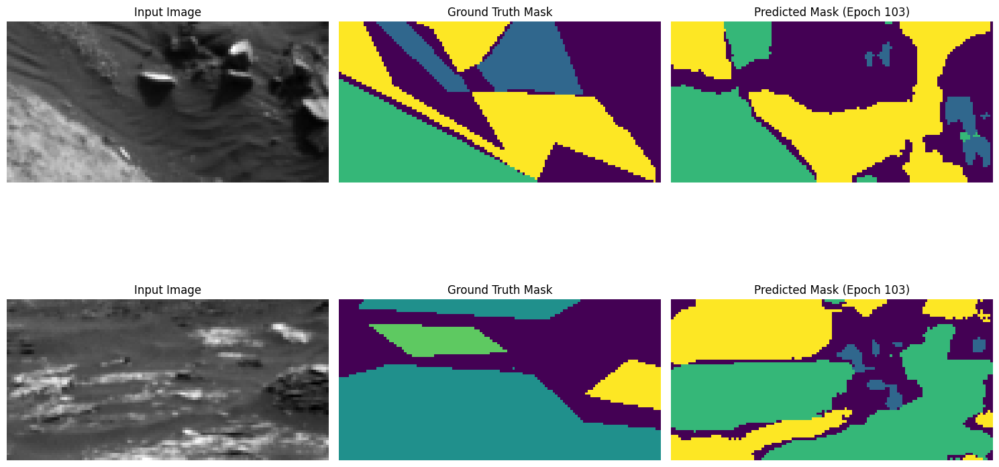

Epoch 103: Per-class IoUs: [None, 0.8072812660538831, 0.6716835262612754, 0.7994823384329719, 0.007039947609692207]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9451 - loss: 7.1665e-04 - mean_io_u: 0.7753 - mean_iou: 0.7753 - val_accuracy: 0.7475 - val_loss: 0.0256 - val_mean_io_u: 0.4571 - val_mean_iou: 0.4571 - learning_rate: 6.2500e-06
Epoch 104/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step - accuracy: 0.9461 - loss: 7.0522e-04 - mean_io_u: 0.7758 - mean_iou: 0.7758Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 104: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


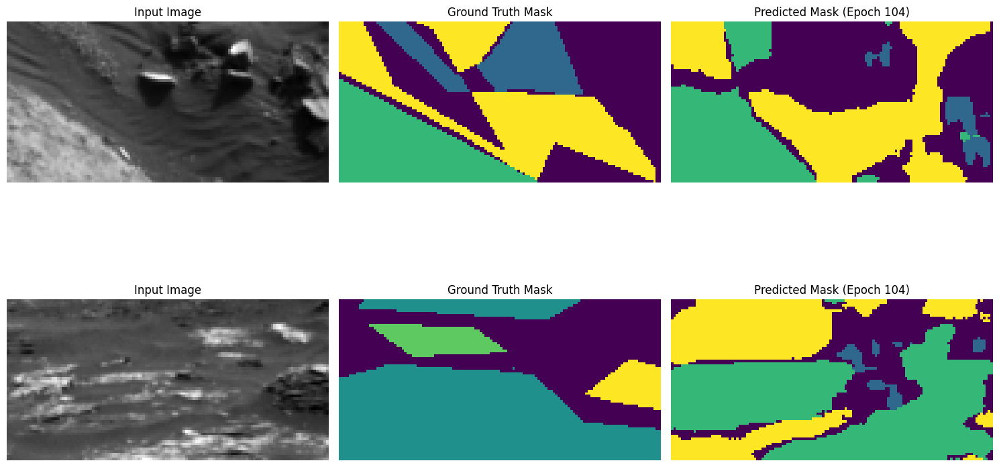

Epoch 104: Per-class IoUs: [None, 0.8075102432631753, 0.672054160381141, 0.79916343505247, 0.0067191084890199934]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9461 - loss: 7.0520e-04 - mean_io_u: 0.7758 - mean_iou: 0.7758 - val_accuracy: 0.7475 - val_loss: 0.0257 - val_mean_io_u: 0.4571 - val_mean_iou: 0.4571 - learning_rate: 6.2500e-06
Epoch 105/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9470 - loss: 6.9425e-04 - mean_io_u: 0.7763 - mean_iou: 0.7763Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 105: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


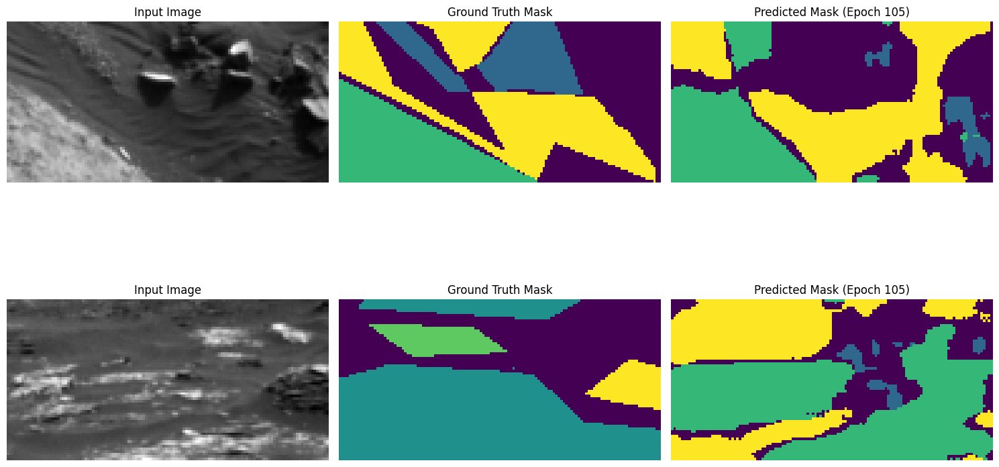

Epoch 105: Per-class IoUs: [None, 0.8075642118815152, 0.6722336871891901, 0.798883107499437, 0.006734559789750329]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9470 - loss: 6.9423e-04 - mean_io_u: 0.7763 - mean_iou: 0.7763 - val_accuracy: 0.7475 - val_loss: 0.0259 - val_mean_io_u: 0.4571 - val_mean_iou: 0.4571 - learning_rate: 6.2500e-06
Epoch 106/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9478 - loss: 6.8373e-04 - mean_io_u: 0.7767 - mean_iou: 0.7767Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 106: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


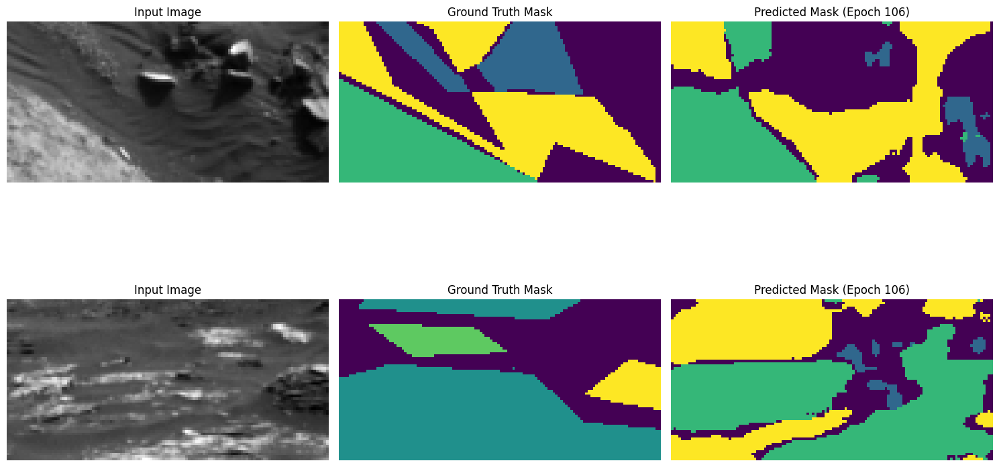

Epoch 106: Per-class IoUs: [None, 0.8076158868980541, 0.67235580217543, 0.7985781184181655, 0.00675008231807705]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 242ms/step - accuracy: 0.9478 - loss: 6.8371e-04 - mean_io_u: 0.7767 - mean_iou: 0.7767 - val_accuracy: 0.7474 - val_loss: 0.0260 - val_mean_io_u: 0.4571 - val_mean_iou: 0.4571 - learning_rate: 6.2500e-06
Epoch 107/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9487 - loss: 6.7359e-04 - mean_io_u: 0.7772 - mean_iou: 0.7772Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 107: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


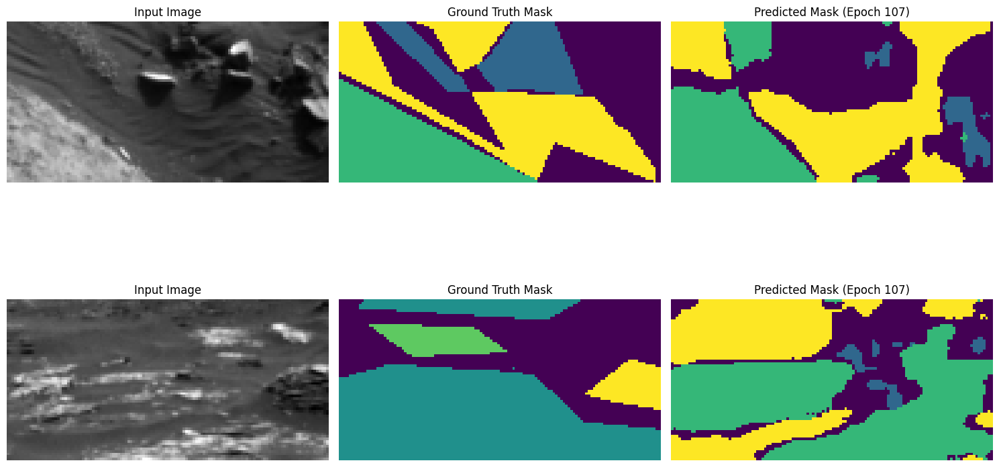

Epoch 107: Per-class IoUs: [None, 0.8078173964026498, 0.6724594022122853, 0.7983833574561944, 0.0067600989282769995]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9487 - loss: 6.7357e-04 - mean_io_u: 0.7772 - mean_iou: 0.7772 - val_accuracy: 0.7474 - val_loss: 0.0261 - val_mean_io_u: 0.4571 - val_mean_iou: 0.4571 - learning_rate: 6.2500e-06
Epoch 108/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step - accuracy: 0.9495 - loss: 6.6375e-04 - mean_io_u: 0.7776 - mean_iou: 0.7776Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 108: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


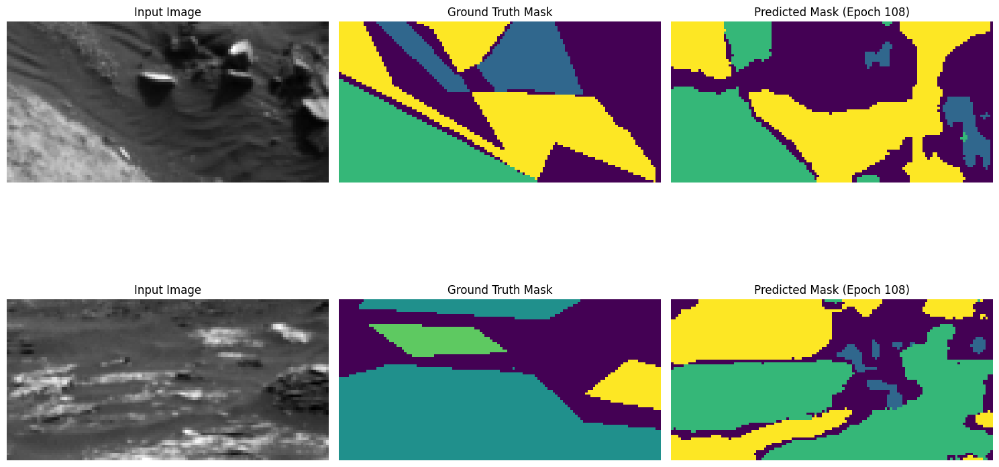

Epoch 108: Per-class IoUs: [None, 0.8078880372831696, 0.6724461066696787, 0.7981146454333344, 0.006767910201386596]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9495 - loss: 6.6373e-04 - mean_io_u: 0.7776 - mean_iou: 0.7776 - val_accuracy: 0.7474 - val_loss: 0.0262 - val_mean_io_u: 0.4570 - val_mean_iou: 0.4570 - learning_rate: 6.2500e-06
Epoch 109/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9502 - loss: 6.5430e-04 - mean_io_u: 0.7780 - mean_iou: 0.7780Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 109: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


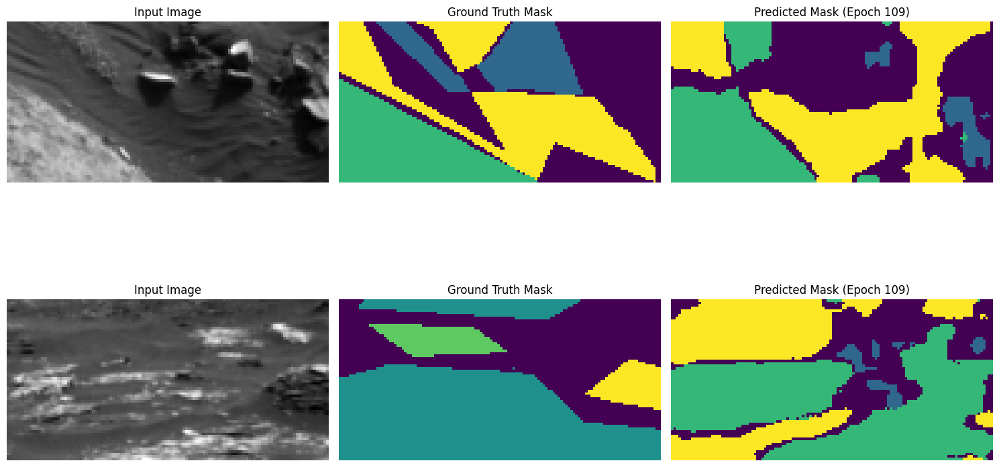

Epoch 109: Per-class IoUs: [None, 0.8080298221276899, 0.6722811501864755, 0.7977760890222144, 0.0067813430367184915]
376/376 ━━━━━━━━━━━━━━━━━━━━ 90s 241ms/step - accuracy: 0.9502 - loss: 6.5429e-04 - mean_io_u: 0.7780 - mean_iou: 0.7780 - val_accuracy: 0.7473 - val_loss: 0.0263 - val_mean_io_u: 0.4570 - val_mean_iou: 0.4570 - learning_rate: 6.2500e-06
Epoch 110/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9510 - loss: 6.4514e-04 - mean_io_u: 0.7784 - mean_iou: 0.7784Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 110: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


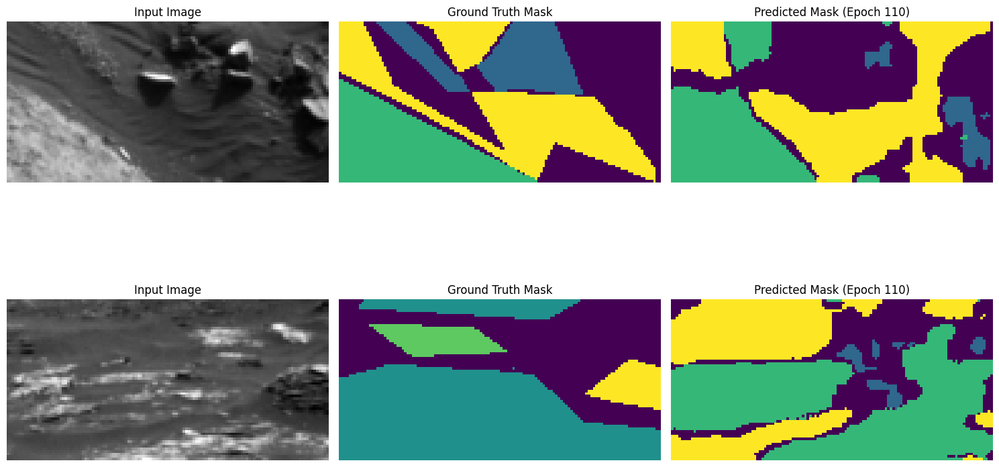

Epoch 110: Per-class IoUs: [None, 0.8080025866946892, 0.6719383795340391, 0.7974139247674389, 0.006790327923153362]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9510 - loss: 6.4513e-04 - mean_io_u: 0.7784 - mean_iou: 0.7784 - val_accuracy: 0.7472 - val_loss: 0.0264 - val_mean_io_u: 0.4568 - val_mean_iou: 0.4568 - learning_rate: 6.2500e-06
Epoch 111/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9517 - loss: 6.3615e-04 - mean_io_u: 0.7788 - mean_iou: 0.7788Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 111: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


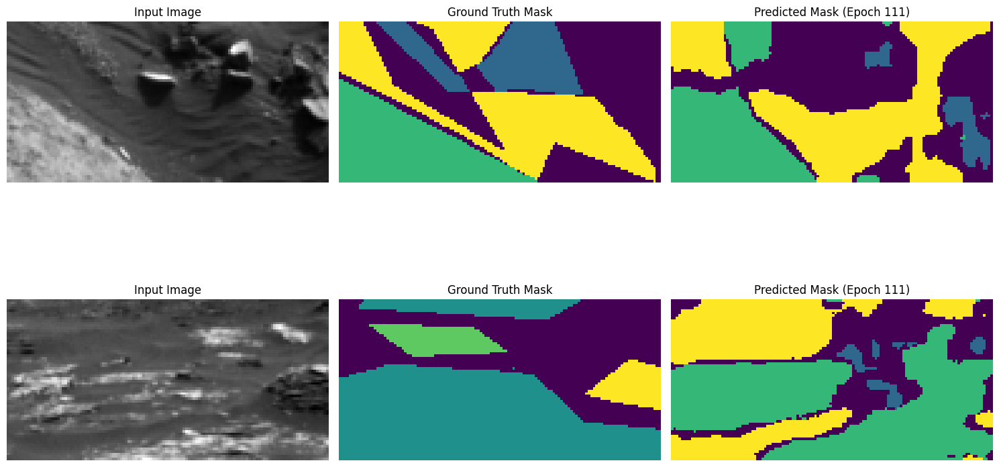

Epoch 111: Per-class IoUs: [None, 0.8080772023314803, 0.6717197762712361, 0.7971772392883164, 0.006807238917482982]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9517 - loss: 6.3613e-04 - mean_io_u: 0.7787 - mean_iou: 0.7787 - val_accuracy: 0.7472 - val_loss: 0.0265 - val_mean_io_u: 0.4568 - val_mean_iou: 0.4568 - learning_rate: 6.2500e-06
Epoch 112/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step - accuracy: 0.9524 - loss: 6.2740e-04 - mean_io_u: 0.7791 - mean_iou: 0.7791Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 112: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


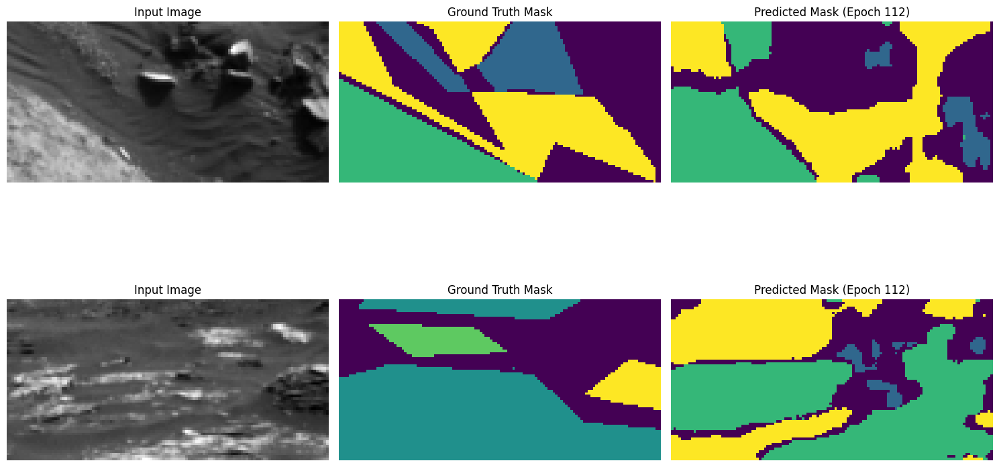

Epoch 112: Per-class IoUs: [None, 0.8080852909365921, 0.67119040942819, 0.7969223066363277, 0.006320691949434464]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 242ms/step - accuracy: 0.9524 - loss: 6.2739e-04 - mean_io_u: 0.7791 - mean_iou: 0.7791 - val_accuracy: 0.7471 - val_loss: 0.0266 - val_mean_io_u: 0.4565 - val_mean_iou: 0.4565 - learning_rate: 6.2500e-06
Epoch 113/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9531 - loss: 6.1894e-04 - mean_io_u: 0.7795 - mean_iou: 0.7795Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 113: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


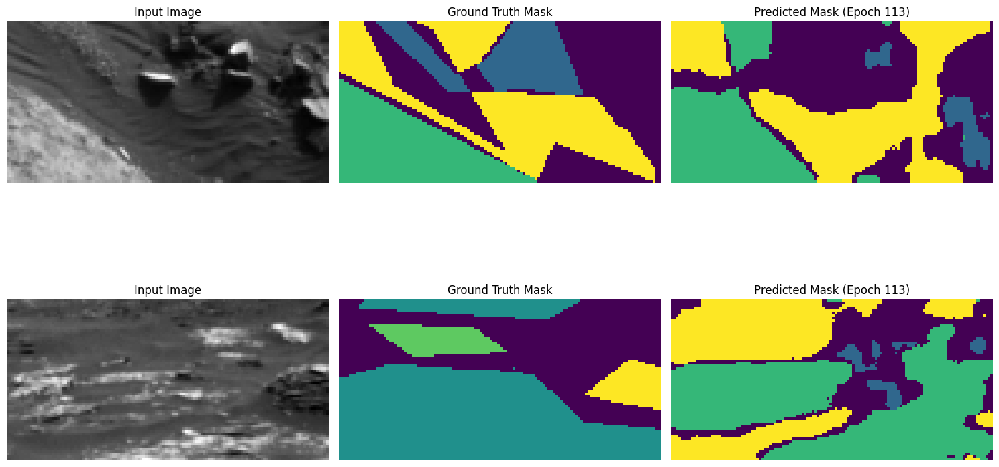

Epoch 113: Per-class IoUs: [None, 0.8080473321783535, 0.6707229268701076, 0.7964213627317174, 0.006329113924050633]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9531 - loss: 6.1892e-04 - mean_io_u: 0.7794 - mean_iou: 0.7794 - val_accuracy: 0.7469 - val_loss: 0.0267 - val_mean_io_u: 0.4563 - val_mean_iou: 0.4563 - learning_rate: 6.2500e-06
Epoch 114/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9538 - loss: 6.1064e-04 - mean_io_u: 0.7798 - mean_iou: 0.7798Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 114: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


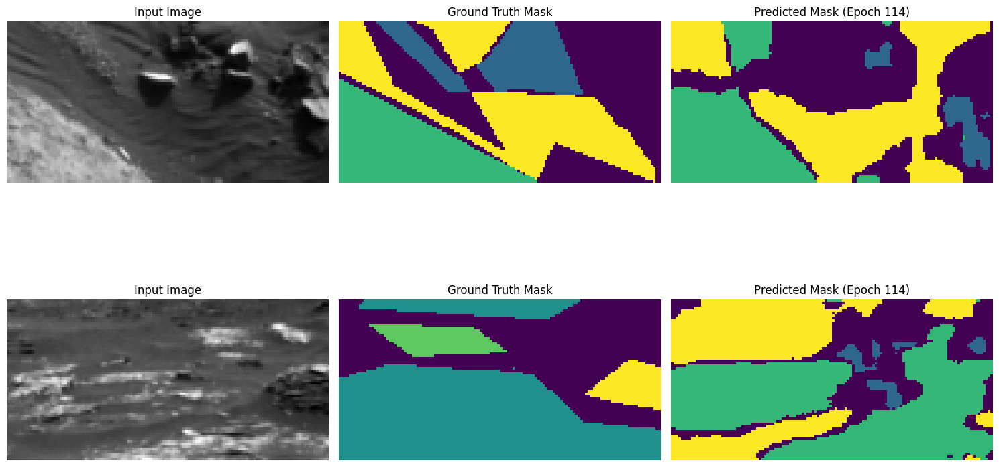

Epoch 114: Per-class IoUs: [None, 0.808035506918073, 0.6701211475995021, 0.7960084754930319, 0.006173869514433506]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9538 - loss: 6.1063e-04 - mean_io_u: 0.7798 - mean_iou: 0.7798 - val_accuracy: 0.7468 - val_loss: 0.0268 - val_mean_io_u: 0.4561 - val_mean_iou: 0.4561 - learning_rate: 6.2500e-06
Epoch 115/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step - accuracy: 0.9545 - loss: 6.0257e-04 - mean_io_u: 0.7801 - mean_iou: 0.7801Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 115: val_loss did not improve from 0.00530

Epoch 115: ReduceLROnPlateau reducing learning rate to 3.12499992105586e-06.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


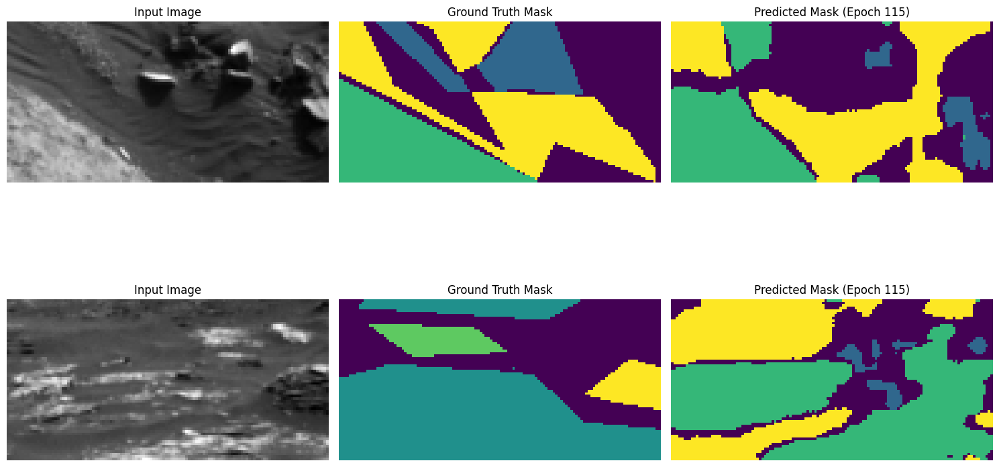

Epoch 115: Per-class IoUs: [None, 0.8080209573643906, 0.6695167913007145, 0.795643793958651, 0.006015037593984963]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 242ms/step - accuracy: 0.9545 - loss: 6.0255e-04 - mean_io_u: 0.7801 - mean_iou: 0.7801 - val_accuracy: 0.7467 - val_loss: 0.0269 - val_mean_io_u: 0.4558 - val_mean_iou: 0.4558 - learning_rate: 6.2500e-06
Epoch 116/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9515 - loss: 6.3676e-04 - mean_io_u: 0.7781 - mean_iou: 0.7781Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 116: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


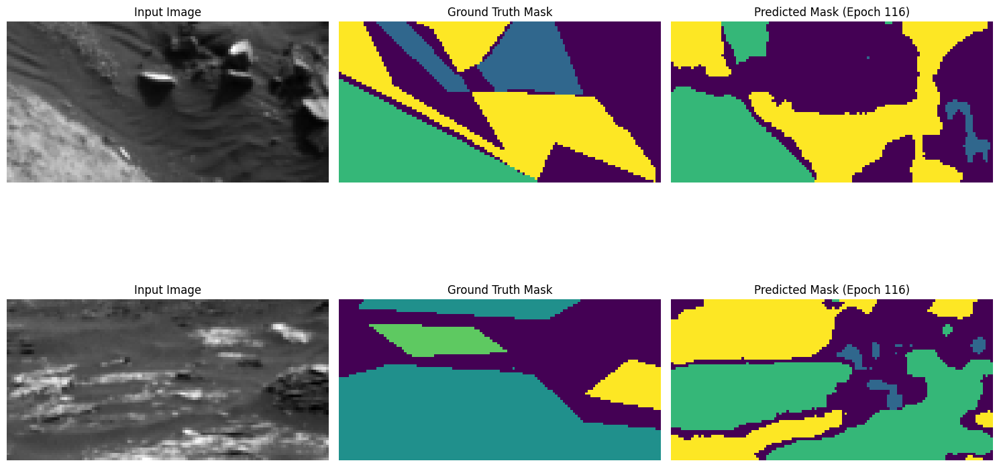

Epoch 116: Per-class IoUs: [None, 0.797397659281664, 0.6387973327823909, 0.787111035137254, 0.005409974640743872]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 242ms/step - accuracy: 0.9515 - loss: 6.3675e-04 - mean_io_u: 0.7781 - mean_iou: 0.7781 - val_accuracy: 0.7414 - val_loss: 0.0267 - val_mean_io_u: 0.4457 - val_mean_iou: 0.4457 - learning_rate: 3.1250e-06
Epoch 117/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9520 - loss: 6.2876e-04 - mean_io_u: 0.7784 - mean_iou: 0.7784Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 117: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


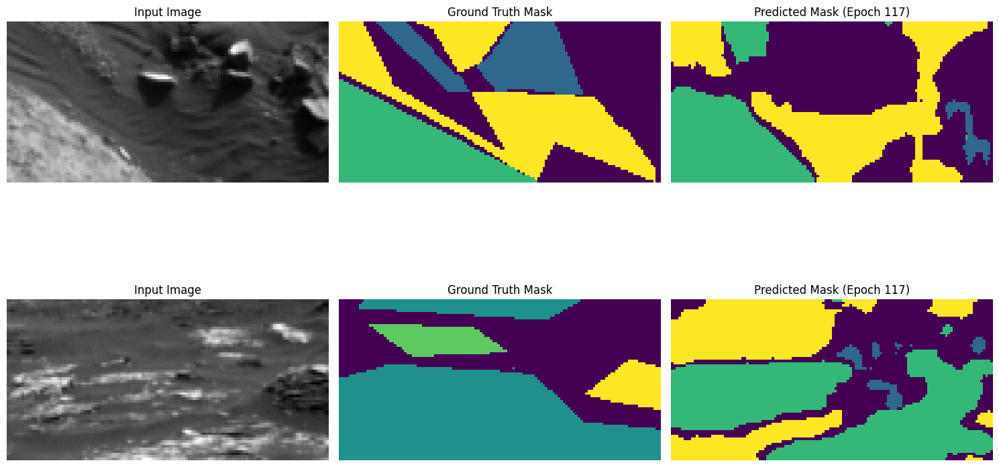

Epoch 117: Per-class IoUs: [None, 0.7990067176791196, 0.6401664415624445, 0.7866543749645886, 0.005398110661268556]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9520 - loss: 6.2874e-04 - mean_io_u: 0.7783 - mean_iou: 0.7783 - val_accuracy: 0.7421 - val_loss: 0.0268 - val_mean_io_u: 0.4462 - val_mean_iou: 0.4462 - learning_rate: 3.1250e-06
Epoch 118/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9529 - loss: 6.1770e-04 - mean_io_u: 0.7789 - mean_iou: 0.7789Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 118: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


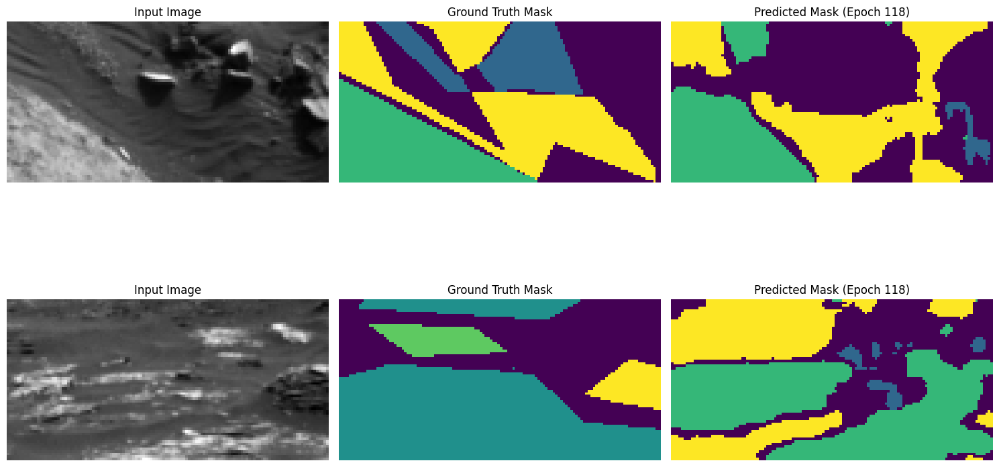

Epoch 118: Per-class IoUs: [None, 0.7994586253334822, 0.6407048967210747, 0.786510127499994, 0.0053990214273662894]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9529 - loss: 6.1769e-04 - mean_io_u: 0.7789 - mean_iou: 0.7789 - val_accuracy: 0.7424 - val_loss: 0.0268 - val_mean_io_u: 0.4464 - val_mean_iou: 0.4464 - learning_rate: 3.1250e-06
Epoch 119/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9536 - loss: 6.0927e-04 - mean_io_u: 0.7793 - mean_iou: 0.7793Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 119: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


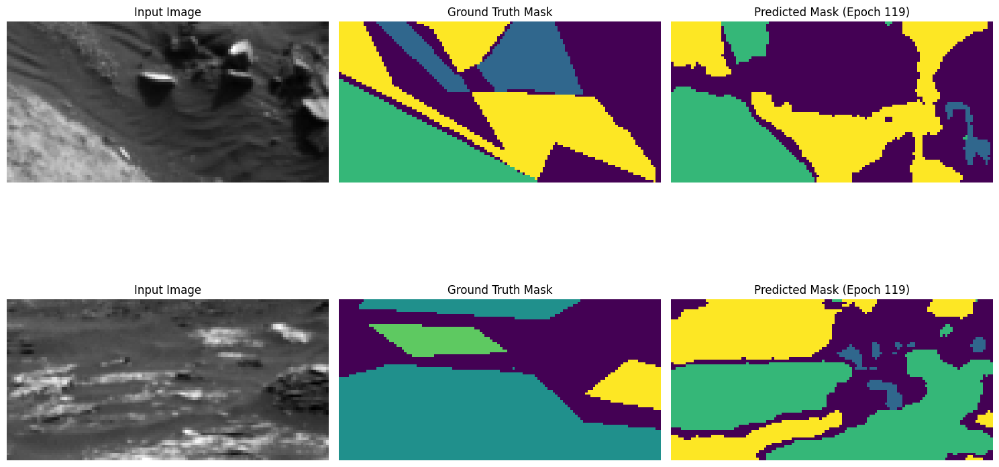

Epoch 119: Per-class IoUs: [None, 0.7995502024021935, 0.640986144049258, 0.7864046254788684, 0.005398110661268556]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9536 - loss: 6.0926e-04 - mean_io_u: 0.7793 - mean_iou: 0.7793 - val_accuracy: 0.7425 - val_loss: 0.0269 - val_mean_io_u: 0.4465 - val_mean_iou: 0.4465 - learning_rate: 3.1250e-06
Epoch 120/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9542 - loss: 6.0205e-04 - mean_io_u: 0.7797 - mean_iou: 0.7797Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 120: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


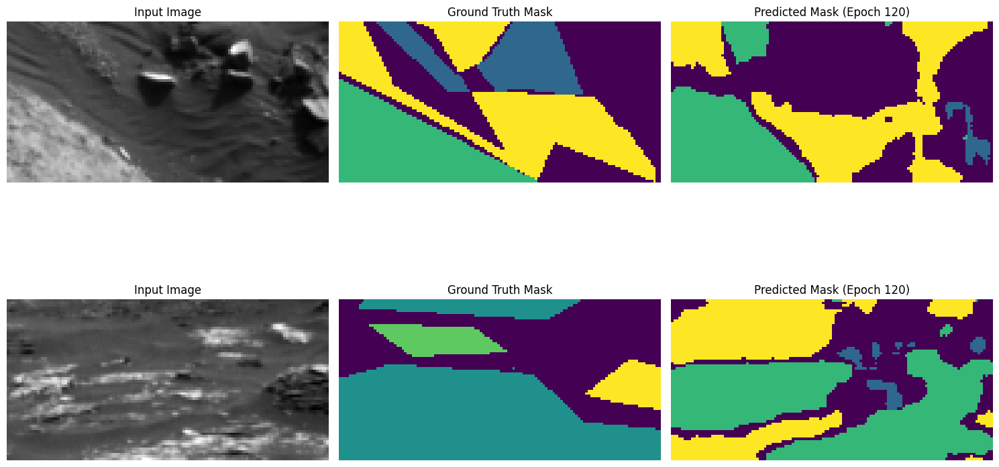

Epoch 120: Per-class IoUs: [None, 0.7996304221230286, 0.6412333755795485, 0.7863464089109039, 0.005398110661268556]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9542 - loss: 6.0204e-04 - mean_io_u: 0.7796 - mean_iou: 0.7796 - val_accuracy: 0.7426 - val_loss: 0.0269 - val_mean_io_u: 0.4465 - val_mean_iou: 0.4465 - learning_rate: 3.1250e-06
Epoch 121/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9547 - loss: 5.9554e-04 - mean_io_u: 0.7799 - mean_iou: 0.7799Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 121: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


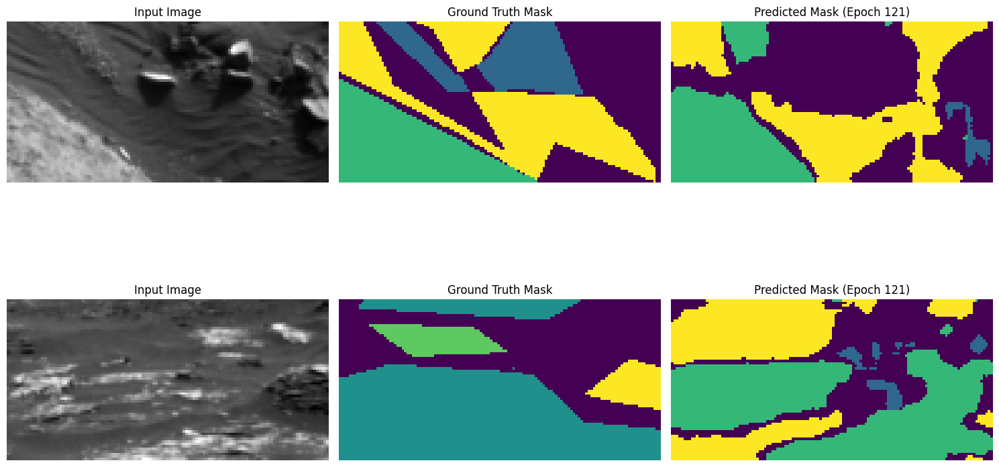

Epoch 121: Per-class IoUs: [None, 0.7995925297113752, 0.6413178070766369, 0.7862796117009403, 0.005398110661268556]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 241ms/step - accuracy: 0.9547 - loss: 5.9553e-04 - mean_io_u: 0.7799 - mean_iou: 0.7799 - val_accuracy: 0.7426 - val_loss: 0.0270 - val_mean_io_u: 0.4465 - val_mean_iou: 0.4465 - learning_rate: 3.1250e-06
Epoch 122/300
376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.9552 - loss: 5.8953e-04 - mean_io_u: 0.7802 - mean_iou: 0.7802Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 122: val_loss did not improve from 0.00530
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


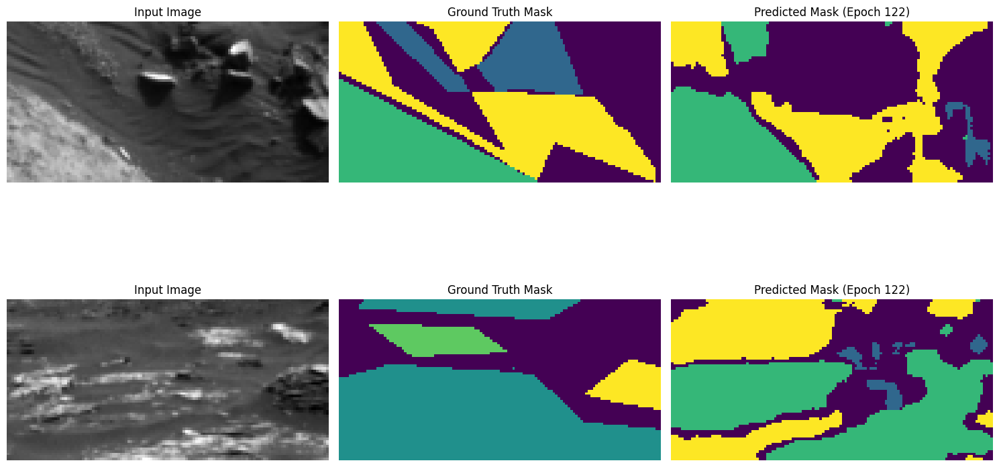

Epoch 122: Per-class IoUs: [None, 0.7996030465371458, 0.6413855555650589, 0.7862130629002577, 0.004894514767932489]
376/376 ━━━━━━━━━━━━━━━━━━━━ 91s 242ms/step - accuracy: 0.9552 - loss: 5.8952e-04 - mean_io_u: 0.7802 - mean_iou: 0.7802 - val_accuracy: 0.7426 - val_loss: 0.0270 - val_mean_io_u: 0.4464 - val_mean_iou: 0.4464 - learning_rate: 3.1250e-06
Epoch 123/300
 41/376 ━━━━━━━━━━━━━━━━━━━━ 1:12 216ms/step - accuracy: 0.9578 - loss: 5.4826e-04 - mean_io_u: 0.7827 - mean_iou: 0.7827

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers as tfkl

# Residual Block
def residual_block(x, filters):
    shortcut = x
    x = tfkl.Conv2D(filters, (3, 3), activation='relu', padding='same')(x)
    x = tfkl.Conv2D(filters, (3, 3), activation='relu', padding='same')(x)
    shortcut = tfkl.Conv2D(filters, (1, 1), padding='same')(shortcut)
    return tfkl.add([x, shortcut])
import tensorflow as tf
from tensorflow.keras import backend as K

import tensorflow as tf
from tensorflow.keras import backend as K

# U-Net with Residual Connections
def unet_with_residual_blocks(input_shape, num_classes):
    inputs = tfkl.Input(input_shape)

    # Encoder
    c1 = residual_block(inputs, 64)
    p1 = tfkl.MaxPooling2D((2, 2))(c1)

    c2 = residual_block(p1, 128)
    p2 = tfkl.MaxPooling2D((2, 2))(c2)

    c3 = residual_block(p2, 256)
    p3 = tfkl.MaxPooling2D((2, 2))(c3)

    c4 = residual_block(p3, 512)

    # Decoder
    u1 = tfkl.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c4)
    u1 = tfkl.concatenate([u1, c3])
    d1 = residual_block(u1, 256)

    u2 = tfkl.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(d1)
    u2 = tfkl.concatenate([u2, c2])
    d2 = residual_block(u2, 128)

    u3 = tfkl.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(d2)
    u3 = tfkl.concatenate([u3, c1])
    d3 = residual_block(u3, 64)

    outputs = tfkl.Conv2D(num_classes, (1, 1), activation='softmax')(d3)

    return tf.keras.Model(inputs, outputs)

# Initialize the model
input_shape = X_train.shape[1:]
num_classes = 5  # Replace with your number of classes
ignore_class = 0  # Class to ignore

#custom_mean_iou = CustomMeanIoU(num_classes=num_classes, ignore_class=0)

model = unet_with_residual_blocks(input_shape, num_classes)
# Define the optimizer with a specific learning rate
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4)
mean_iou = tfk.metrics.MeanIoU(num_classes=num_classes, ignore_class=0, sparse_y_pred=False)
per_class_iou_callback = PerClassIoUCallback(
    validation_data=(X_val, y_val),
    num_classes=num_classes,
    labels_to_exclude=[0]
)

# Compile the model
model.compile(optimizer=optimizer,
              loss=weighted_sparse_categorical_crossentropy(class_weights),
              metrics=["accuracy", mean_iou, MeanIntersectionOverUnion(num_classes=5, labels_to_exclude=[0])])

model.summary()
# Define callbacks
save_best_miou = SaveBestMeanIoU(filepath="best_model_mean_iou.h5", monitor="val_mean_iou", mode="max", verbose=1)


# Training the model
history = model.fit(
    X_train,
    y_train,
    validation_data=(X_val, y_val),  # Add validation data
    #batch_size=32,
    epochs=300,
    callbacks=[save_best_miou, model_checkpoint, reduce_lr, visualize_callback, per_class_iou_callback]
)


In [25]:
# Custom Mean Intersection Over Union metric
class MeanIntersectionOverUnion(tf.keras.metrics.MeanIoU):
    def __init__(self, num_classes, labels_to_exclude=None, name="mean_iou", dtype=None, **kwargs):  # **kwargs to handle extra arguments
        # Add **kwargs to the __init__ to handle any unexpected keyword arguments.
        super(MeanIntersectionOverUnion, self).__init__(num_classes=num_classes, name=name, dtype=dtype)
        if labels_to_exclude is None:
            labels_to_exclude = [0]  # Default to excluding label 0
        self.labels_to_exclude = labels_to_exclude

    def update_state(self, y_true, y_pred, sample_weight=None):
        # Convert predictions to class labels
        y_pred = tf.math.argmax(y_pred, axis=-1)

        # Flatten the tensors
        y_true = tf.reshape(y_true, [-1])
        y_pred = tf.reshape(y_pred, [-1])

        # Apply mask to exclude specified labels
        for label in self.labels_to_exclude:
            mask = tf.not_equal(y_true, label)
            y_true = tf.boolean_mask(y_true, mask)
            y_pred = tf.boolean_mask(y_pred, mask)

        # Update the state
        return super().update_state(y_true, y_pred, sample_weight)
def weighted_sparse_categorical_crossentropy(weights):
    def loss(y_true, y_pred):
        y_pred = tf.clip_by_value(y_pred, K.epsilon(), 1 - K.epsilon())
        y_true_one_hot = tf.one_hot(tf.cast(y_true, tf.int32), depth=len(weights))
        weights_tensor = tf.reduce_sum(weights * y_true_one_hot, axis=-1)
        cross_entropy = -tf.reduce_sum(y_true_one_hot * tf.math.log(y_pred), axis=-1)
        return tf.reduce_mean(weights_tensor * cross_entropy)
    return loss


In [32]:
# Custom Mean Intersection Over Union metric
class MeanIntersectionOverUnion(tf.keras.metrics.MeanIoU):
    def __init__(self, num_classes, labels_to_exclude=None, name="mean_iou", dtype=None, **kwargs):  # **kwargs to handle extra arguments
        # Add **kwargs to the __init__ to handle any unexpected keyword arguments.
        super(MeanIntersectionOverUnion, self).__init__(num_classes=num_classes, name=name, dtype=dtype)
        if labels_to_exclude is None:
            labels_to_exclude = [0]  # Default to excluding label 0
        self.labels_to_exclude = labels_to_exclude

    def update_state(self, y_true, y_pred, sample_weight=None):
        # Convert predictions to class labels
        y_pred = tf.math.argmax(y_pred, axis=-1)

        # Flatten the tensors
        y_true = tf.reshape(y_true, [-1])
        y_pred = tf.reshape(y_pred, [-1])

        # Apply mask to exclude specified labels
        for label in self.labels_to_exclude:
            mask = tf.not_equal(y_true, label)
            y_true = tf.boolean_mask(y_true, mask)
            y_pred = tf.boolean_mask(y_pred, mask)

        # Update the state
        return super().update_state(y_true, y_pred, sample_weight)

In [36]:
fine_tune_model = tf.keras.models.load_model("/kaggle/input/model-cat/best_model_mean_iou (1).h5", compile=False)


In [37]:
model=fine_tune_model

In [ ]:
# Save the model in the .keras format
model.save("best_model_mean_iou.h5")



In [38]:
model_filename = f"model_augmented_hvr_best_invert_noise.keras"
model.save(model_filename)

print(f"Model saved to {model_filename}")

Model saved to model_augmented_hvr_best_invert_noise.keras


## 📊 Prepare Your Submission

In our Kaggle competition, submissions are made as `csv` files. To create a proper `csv` file, you need to flatten your predictions and include an `id` column as the first column of your dataframe. To maintain consistency between your results and our solution, please avoid shuffling the test set. The code below demonstrates how to prepare the `csv` file from your model predictions.



In [39]:
import os
# If model_filename is not defined, load the most recent model from Google Drive
if "model_filename" not in globals() or model_filename is None:
    files = [f for f in os.listdir('.') if os.path.isfile(f) and f.startswith('model_') and f.endswith('.keras')]
    files.sort(key=lambda x: os.path.getmtime(x), reverse=True)
    if files:
        model_filename = files[0]
    else:
        raise FileNotFoundError("No model files found in the current directory.")

In [40]:
print(f"X_test shape before reshaping: {X_test.shape}")

X_test shape before reshaping: (10022, 64, 128, 1)


In [41]:
# Generate predictions
preds = model.predict(X_test)
preds = np.argmax(preds, axis=-1)  # Convert probabilities to class labels
print(f"Predictions shape: {preds.shape}")

I0000 00:00:1733501377.739375     127 service.cc:145] XLA service 0x7ca17c004ad0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733501377.739430     127 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1733501377.739437     127 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5


  4/314 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step 

I0000 00:00:1733501389.801938     127 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


314/314 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step
Predictions shape: (10022, 64, 128)


Randomly selected indices for prediction (seed=42): [3543 5731 4801  416 5125 9915  293 5020 1765 4192 2288 1188  107 7583
  856 5090 9784 5192 6935  850]


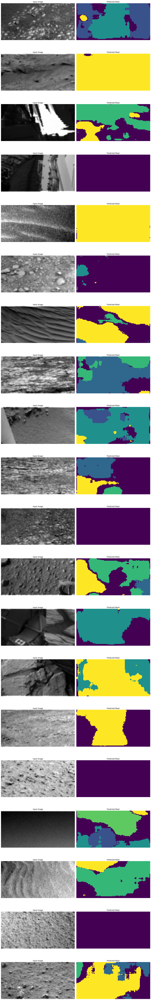

In [42]:
import numpy as np
import matplotlib.pyplot as plt

# Set random seed for reproducibility
np.random.seed(42)
# Randomly select 20 indices for prediction
random_indices = np.random.choice(X_test.shape[0], size=20, replace=False)
print(f"Randomly selected indices for prediction (seed=42): {random_indices}")

# Select 20 random samples and their corresponding masks
X_sample = X_test[random_indices]



predicted_masks = preds

# Visualize the predictions
num_images = len(X_sample)  # Number of images to visualize
fig, axes = plt.subplots(num_images, 2, figsize=(15, num_images * 5))

for i in range(num_images):
    # Original Image
    ax_img = axes[i, 0]
    ax_img.imshow(X_sample[i].squeeze(), cmap="gray")
    ax_img.set_title("Input Image")
    ax_img.axis("off")

    # Predicted Mask
    ax_pred = axes[i, 1]
    ax_pred.imshow(predicted_masks[i], cmap="viridis")
    ax_pred.set_title("Predicted Mask")
    ax_pred.axis("off")

plt.tight_layout()
plt.show()

In [43]:
def y_to_df(y) -> pd.DataFrame:
    """Converts segmentation predictions into a DataFrame format for Kaggle."""
    n_samples = len(y)
    y_flat = y.reshape(n_samples, -1)
    df = pd.DataFrame(y_flat)
    df["id"] = np.arange(n_samples)
    cols = ["id"] + [col for col in df.columns if col != "id"]
    return df[cols]

In [45]:
# Create and download the csv submission file
timestep_str = model_filename.replace("model_", "").replace(".keras", "")
submission_filename = f"submission_cat_{timestep_str}.csv"
submission_df = y_to_df(preds)
submission_df.to_csv(submission_filename, index=False)



In [46]:
len(submission_df.columns)

8193

In [ ]:
len(submission_df)

In [ ]:
# Custom Mean Intersection Over Union metric
class MeanIntersectionOverUnion(tf.keras.metrics.MeanIoU):
    def __init__(self, num_classes, labels_to_exclude=None, name="mean_iou", dtype=None, **kwargs):  # **kwargs to handle extra arguments
        # Add **kwargs to the __init__ to handle any unexpected keyword arguments.
        super(MeanIntersectionOverUnion, self).__init__(num_classes=num_classes, name=name, dtype=dtype)
        if labels_to_exclude is None:
            labels_to_exclude = [0]  # Default to excluding label 0
        self.labels_to_exclude = labels_to_exclude

    def update_state(self, y_true, y_pred, sample_weight=None):
        # Convert predictions to class labels
        y_pred = tf.math.argmax(y_pred, axis=-1)

        # Flatten the tensors
        y_true = tf.reshape(y_true, [-1])
        y_pred = tf.reshape(y_pred, [-1])

        # Apply mask to exclude specified labels
        for label in self.labels_to_exclude:
            mask = tf.not_equal(y_true, label)
            y_true = tf.boolean_mask(y_true, mask)
            y_pred = tf.boolean_mask(y_pred, mask)

        # Update the state
        return super().update_state(y_true, y_pred, sample_weight)

In [ ]:
# Filtreleme: Yalnızca nadir sınıfları içeren görüntüleri seç
rare_class = 4
filtered_X_train = []
filtered_y_train = []

for img, mask in zip(X_train, y_train):
    if rare_class in np.unique(mask):
        filtered_X_train.append(img)
        filtered_y_train.append(mask)

filtered_X_train = np.array(filtered_X_train)
filtered_y_train = np.array(filtered_y_train)

print(f"Filtered dataset shape: {filtered_X_train.shape}, {filtered_y_train.shape}")
# Önceden eğitilmiş modeli yükle
# Load the previously trained model
fine_tune_model = tf.keras.models.load_model("best_model_mean_iou.h5", custom_objects={
    "MeanIoU": MeanIntersectionOverUnion(num_classes=5, labels_to_exclude=[0]), # Updated custom object loading
    "MeanIntersectionOverUnion": MeanIntersectionOverUnion(num_classes=5, labels_to_exclude=[0]),# Your custom class remains unchanged
})

# Yeni optimizer ve düşük öğrenme hızı
fine_tune_optimizer = tf.keras.optimizers.Adam(learning_rate=1e-5)
print(f"Class weights: {class_weights}")

# Fine-tune model compilation with weighted loss
fine_tune_model.compile(
    optimizer=fine_tune_optimizer,
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy", MeanIntersectionOverUnion(num_classes=5, labels_to_exclude=[0])]
)

# Fine-tuning için eğitim
fine_tune_history = fine_tune_model.fit(
    filtered_X_train,
    filtered_y_train,
    validation_data=(X_val, y_val),  # Validation verisi tüm sınıfları içermelidir
    epochs=100,
    callbacks=[
        EarlyStopping(monitor="val_loss", patience=100, restore_best_weights=True),
        ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=2, min_lr=1e-7),
        per_class_iou_callback
    ]
)

# Fine-tuned modeli kaydet
fine_tuned_model_filename = "fine_tuned_model_with_weights.h5"
fine_tune_model.save(fine_tuned_model_filename)
print(f"Fine-tuned model with weights saved to {fine_tuned_model_filename}")

In [ ]:
# Filtreleme: Yalnızca nadir sınıfları içeren görüntüleri seç
rare_class = 4
filtered_X_train = []
filtered_y_train = []

for img, mask in zip(X_train, y_train):
    if rare_class in np.unique(mask):
        filtered_X_train.append(img)
        filtered_y_train.append(mask)

filtered_X_train = np.array(filtered_X_train)
filtered_y_train = np.array(filtered_y_train)

print(f"Filtered dataset shape: {filtered_X_train.shape}, {filtered_y_train.shape}")
# Önceden eğitilmiş modeli yükle
# Load the previously trained model
fine_tune_model = tf.keras.models.load_model("best_model_mean_iou.h5", custom_objects={
    "MeanIoU": tfk.metrics.MeanIoU(num_classes=num_classes, ignore_class=0, sparse_y_pred=False), # Updated custom object loading
    "MeanIntersectionOverUnion": MeanIntersectionOverUnion(num_classes=5, labels_to_exclude=[0]),# Your custom class remains unchanged
})

# Yeni optimizer ve düşük öğrenme hızı
fine_tune_optimizer = tf.keras.optimizers.Adam(learning_rate=1e-5)
class_weights = {0: 0.01, 1: 0.01, 2: 0.01, 3: 0.01, 4: 0.5}  # Use the provided class weights
print(f"Class weights: {class_weights}")


# Fine-tune model compilation with weighted loss
fine_tune_model.compile(
    optimizer=fine_tune_optimizer,
    loss=weighted_sparse_categorical_crossentropy(class_weights),
    metrics=["accuracy", MeanIntersectionOverUnion(num_classes=5, labels_to_exclude=[0])]
)

# Fine-tuning için eğitim
fine_tune_history = fine_tune_model.fit(
    filtered_X_train,
    filtered_y_train,
    validation_data=(X_val, y_val),  # Validation verisi tüm sınıfları içermelidir
    epochs=100,
    callbacks=[
        EarlyStopping(monitor="val_loss", patience=100, restore_best_weights=True),
        ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=2, min_lr=1e-7),
        per_class_iou_callback
    ]
)

# Fine-tuned modeli kaydet
fine_tuned_model_filename = "fine_tuned_model_with_weights.h5"
fine_tune_model.save(fine_tuned_model_filename)
print(f"Fine-tuned model with weights saved to {fine_tuned_model_filename}")